In [1]:
import numpy as np
import tensorflow as tf
import os
import pandas as pd
import cv2
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from collections import Counter
import random

print("✅ NumPy:", np.__version__)
print("✅ TensorFlow:", tf.__version__)

✅ NumPy: 1.21.4
✅ TensorFlow: 2.6.0


In [2]:
import os

# 이미지에 표시된 디렉토리 경로를 지정합니다.
# 주의: 이 코드를 실행하는 환경에서 해당 경로가 실제로 존재하고 접근 가능해야 합니다.
target_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid/test'

# 제외할 디렉토리 이름 목록입니다.
# 이미지에는 보이지 않지만, 원본 코드의 의도를 살려 유지합니다.
# 이미지에 보이는 '..' (상위 디렉토리) 항목도 제외합니다.
exclude_dirs = ['Train_Test_Valid', '__MACOSX', '.ipynb_checkpoints', '..']

# 클래스 폴더를 저장할 리스트
class_dirs = []

# 지정된 경로가 존재하는지 확인합니다.
if os.path.exists(target_dir):
    # target_dir 내의 모든 항목(파일 및 디렉토리) 리스트를 가져옵니다.
    all_items = os.listdir(target_dir)

    # 각 항목에 대해 반복합니다.
    for item in all_items:
        # 항목의 전체 경로를 만듭니다.
        item_path = os.path.join(target_dir, item)

        # 해당 경로가 디렉토리인지 확인하고,
        # 이름이 exclude_dirs에 포함되지 않고,
        # 이름이 '.zip'으로 끝나지 않는 경우에만 리스트에 추가합니다.
        if os.path.isdir(item_path) and item not in exclude_dirs and not item.endswith('.zip'):
            class_dirs.append(item)

    # 결과 출력
    print(f"'{target_dir}' 내 클래스 개수: {len(class_dirs)}")
    print("클래스 목록:")
    # 정렬된 순서로 출력 (선택 사항)
    class_dirs.sort()
    for cls in class_dirs:
        print(f" - {cls}")

else:
    print(f"오류: 지정된 디렉토리를 찾을 수 없습니다 - {target_dir}")

'/aiffel/aiffel/jellyfish/Train_Test_Valid/test' 내 클래스 개수: 6
클래스 목록:
 - Moon_jellyfish
 - barrel_jellyfish
 - blue_jellyfish
 - compass_jellyfish
 - lions_mane_jellyfish
 - mauve_stinger_jellyfish


발견된 클래스 개수: 6
클래스 목록: ['Moon_jellyfish', 'barrel_jellyfish', 'blue_jellyfish', 'compass_jellyfish', 'lions_mane_jellyfish', 'mauve_stinger_jellyfish']

클래스별 이미지 개수 계산 중...
 - Moon_jellyfish: 6 개
 - barrel_jellyfish: 5 개
 - blue_jellyfish: 7 개
 - compass_jellyfish: 7 개
 - lions_mane_jellyfish: 8 개
 - mauve_stinger_jellyfish: 7 개


/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 53364 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 47000 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 49828 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 51060 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 48120 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 51648 missing from current font.
  font.set_

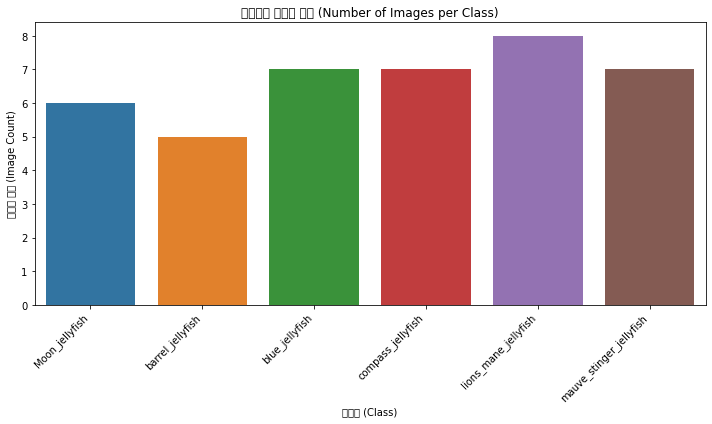

9420800/9406464 [==============================] - 0s 0us/step
MobileNetV2의 총 레이어 수: 154
마지막 20개 레이어를 제외하고 동결합니다.

--- 모델 구조 ---
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1280)              5120      
_________________________________________________________________
dense (Dense)                (None, 256)               327936    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1542

In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf  # TensorFlow 임포트 추가
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

# --- 데이터 탐색 및 NUM_CLASSES 계산 ---

# 클래스 폴더가 있는 상위 디렉토리 경로 (이전 단계에서 사용한 경로)
# 예: '/aiffel/jellyfish/Train_Test_Valid/test' 또는 데이터셋이 있는 실제 경로
# 이 경로는 build_mobilenet_model 함수 외부에 정의되어야 합니다.
base_data_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid/test' # 실제 데이터 경로로 수정하세요

# 제외할 디렉토리 (필요에 따라 수정)
exclude_dirs = ['Train_Test_Valid', '__MACOSX', '.ipynb_checkpoints', '..']

class_dirs = []
if os.path.exists(base_data_dir):
    all_items = os.listdir(base_data_dir)
    for item in all_items:
        item_path = os.path.join(base_data_dir, item)
        if os.path.isdir(item_path) and item not in exclude_dirs and not item.endswith('.zip'):
            class_dirs.append(item)
    class_dirs.sort() # 클래스 순서 일관성 유지
else:
    # 경로가 없으면 오류 발생시키거나 적절히 처리
    raise FileNotFoundError(f"지정된 데이터 디렉토리를 찾을 수 없습니다: {base_data_dir}")

# 클래스 개수 정의 (모델 빌드에 사용됨)
NUM_CLASSES = len(class_dirs)
print(f"발견된 클래스 개수: {NUM_CLASSES}")
print(f"클래스 목록: {class_dirs}")

# 각 클래스별 이미지 개수 계산
class_counts = {}
print("\n클래스별 이미지 개수 계산 중...")
for cls in class_dirs:
    class_path = os.path.join(base_data_dir, cls) # 각 클래스 폴더의 전체 경로
    try:
        # 해당 경로 내의 이미지 파일(jpg, jpeg, png)만 계산
        img_list = [
            f for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f)) and \
               f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ]
        class_counts[cls] = len(img_list)
        print(f" - {cls}: {len(img_list)} 개")
    except FileNotFoundError:
        print(f"경고: '{class_path}' 디렉토리를 찾을 수 없습니다.")
        class_counts[cls] = 0
    except Exception as e:
        print(f"'{class_path}' 처리 중 오류 발생: {e}")
        class_counts[cls] = 0

# DataFrame으로 변환 후 시각화
if class_counts: # 데이터가 있을 경우에만 시각화
    df_counts = pd.DataFrame(list(class_counts.items()), columns=['class', 'count'])

    plt.figure(figsize=(10, 6))
    sns.barplot(data=df_counts, x='class', y='count')
    plt.xticks(rotation=45, ha='right') # 레이블이 겹치지 않도록 회전 및 정렬
    plt.title("클래스별 이미지 개수 (Number of Images per Class)")
    plt.xlabel("클래스 (Class)")
    plt.ylabel("이미지 개수 (Image Count)")
    plt.tight_layout() # 레이아웃 자동 조정
    plt.show()
else:
    print("이미지 개수 데이터가 없어 시각화를 건너<0xEB><0x9A><0xA5>니다.")

# --- MobileNetV2 모델 빌드 ---

# 이미지 크기 정의 (MobileNetV2는 다양한 크기를 지원하지만 224x224가 일반적)
# 이 값은 데이터 로딩 및 전처리 시에도 일관되게 사용되어야 합니다.
IMG_SIZE = 224

def build_mobilenet_model(num_classes, img_size=224):
    """
    MobileNetV2 기반의 분류 모델을 빌드합니다.

    Args:
        num_classes (int): 분류할 클래스의 개수.
        img_size (int): 모델 입력 이미지의 높이 및 너비.

    Returns:
        tensorflow.keras.models.Model: 컴파일된 Keras 모델 객체.
    """
    base_model = MobileNetV2(
        weights='imagenet',      # ImageNet으로 사전 훈련된 가중치 사용
        include_top=False,       # 분류기 레이어는 제외하고 특징 추출기만 사용
        input_shape=(img_size, img_size, 3) # 입력 이미지 크기 지정
    )

    # 전이 학습: 베이스 모델의 일부 레이어 동결 (Fine-tuning 전략에 따라 조절)
    # 예: 마지막 20개 레이어를 제외하고 모두 동결
    # 동결할 레이어 수는 실험을 통해 결정하는 것이 좋습니다.
    print(f"MobileNetV2의 총 레이어 수: {len(base_model.layers)}")
    freeze_until_layer = -20 # 마지막 20개 레이어는 학습 가능하도록 남김
    print(f"마지막 {abs(freeze_until_layer)}개 레이어를 제외하고 동결합니다.")
    for layer in base_model.layers[:freeze_until_layer]:
        layer.trainable = False
    # 특정 레이어가 동결/해제되었는지 확인하려면:
    # for i, layer in enumerate(base_model.layers):
    #     print(i, layer.name, layer.trainable)

    # 모델 구성
    model = Sequential([
        base_model,                     # MobileNetV2 베이스 모델
        GlobalAveragePooling2D(),       # 특징 맵을 벡터로 변환
        BatchNormalization(),           # 배치 정규화 추가 (안정적인 학습에 도움)
        Dense(256, activation='relu'),  # 완전 연결 레이어 (노드 수는 조절 가능)
        Dropout(0.4),                   # 과적합 방지를 위한 드롭아웃 (비율 조절 가능)
        Dense(num_classes, activation='softmax') # 최종 출력 레이어 (클래스 개수만큼 노드)
    ])

    # 모델 컴파일
    model.compile(
        optimizer=Adam(learning_rate=0.001), # 옵티마이저 (Adam 사용, 학습률 조절 가능)
        loss='categorical_crossentropy',     # 다중 클래스 분류 손실 함수
        metrics=['accuracy']                 # 성능 평가 지표
    )

    return model

# 위에서 계산된 NUM_CLASSES를 사용하여 모델 빌드
model = build_mobilenet_model(num_classes=NUM_CLASSES, img_size=IMG_SIZE)

# 모델 구조 출력
print("\n--- 모델 구조 ---")
model.summary()

# 이제 이 'model' 객체를 사용하여 데이터를 로드하고 학습을 진행할 수 있습니다.
# 예: model.fit(train_generator, validation_data=validation_generator, epochs=...)

In [4]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 폰트 설치 후 캐시 업데이트 (최초 1회 또는 폰트 변경 시 필요)
# fm._rebuild() # 코랩 등 일부 환경에서는 _rebuild() 대신 fm._load_fontmanager(try_read_cache=False) 사용

# 설치된 한글 폰트 경로 확인 (예: 나눔고딕)
# 시스템에 설치된 폰트 중 'NanumGothic'을 찾아서 사용
font_path = None
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font: # 또는 'Malgun Gothic' 등 사용하려는 폰트 이름 일부
        font_path = font
        break

if font_path:
    print(f"Using font: {font_path}")
    # 폰트 설정 방법 1: 전역 설정 변경
    plt.rcParams['font.family'] = 'NanumGothic' # 또는 찾은 폰트 이름
    plt.rcParams['axes.unicode_minus'] = False # 마이너스 부호 깨짐 방지
else:
    print("Warning: NanumGothic 폰트를 찾을 수 없습니다. 기본 폰트를 사용합니다.")
    # 기본 폰트를 사용하게 두거나, 다른 사용 가능한 폰트를 지정

# --- 이후 그래프 그리는 코드 ---
# 예시:
# plt.figure(figsize=(10, 6))
# sns.barplot(data=df_counts, x='class', y='count')
# plt.xticks(rotation=45, ha='right')
# plt.title("클래스별 이미지 개수") # 이제 한글이 제대로 보여야 함
# plt.xlabel("클래스")
# plt.ylabel("이미지 개수")
# plt.tight_layout()
# plt.show()

Using font: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf


한글 폰트 발견: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf
Matplotlib 폰트 설정 완료: NanumGothic

선택된 클래스 폴더: Moon_jellyfish
샤프닝 처리할 이미지: /aiffel/aiffel/jellyfish/Train_Test_Valid/test/Moon_jellyfish/11.jpg


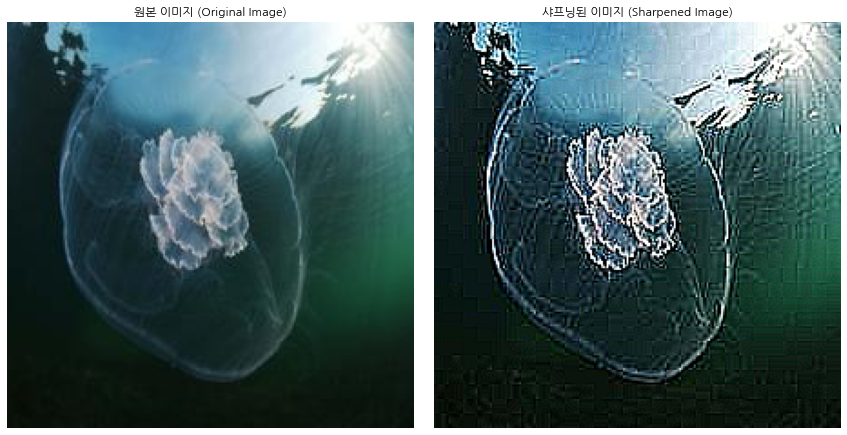

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib.font_manager as fm # 폰트 관리를 위해 추가

# --- Matplotlib 한글 폰트 설정 ---
# 이전에 사용한 폰트 설정 코드를 여기에 포함하거나,
# 별도 파일/셀에서 실행하여 전역적으로 적용되도록 합니다.
def setup_korean_font():
    """Matplotlib에서 사용할 한글 폰트를 설정합니다."""
    font_path = None
    try:
        # 시스템에 설치된 폰트 중 'NanumGothic' (또는 다른 선호하는 한글 폰트) 찾기
        font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
        # 일반적인 한글 폰트 이름 일부 목록
        korean_font_names = ['NanumGothic', 'Malgun Gothic', 'AppleSDGothicNeo']

        for font_file in font_list:
            try:
                # 폰트 파일 이름에서 폰트 이름 추출 시도
                font_name = fm.FontProperties(fname=font_file).get_name()
                if any(kor_name in font_name for kor_name in korean_font_names):
                    font_path = font_file
                    # 발견하면 바로 사용하고 반복 중단 (필요시 우선순위 조정)
                    break
            except Exception:
                continue # 폰트 이름 추출 실패 시 다음 폰트로 넘어감

        if font_path:
            print(f"한글 폰트 발견: {font_path}")
            # 찾은 폰트 이름으로 설정
            font_name = fm.FontProperties(fname=font_path).get_name()
            plt.rcParams['font.family'] = font_name
            plt.rcParams['axes.unicode_minus'] = False # 마이너스 부호 깨짐 방지
            print(f"Matplotlib 폰트 설정 완료: {font_name}")
        else:
            print("경고: 시스템에서 사용 가능한 한글 폰트를 찾지 못했습니다. 폰트 설치가 필요할 수 있습니다.")
            # 대체 폰트 설정 (선택 사항)
            # plt.rcParams['font.family'] = 'DejaVu Sans'

        # 폰트 캐시 재빌드 (필요한 경우, 특히 폰트 설치/변경 직후)
        # 가끔 필요하며, 오류 발생 시 주석 처리
        # try:
        #     fm._rebuild()
        #     print("Matplotlib 폰트 캐시를 재빌드했습니다.")
        # except AttributeError:
        #      pass # _rebuild 속성이 없는 경우 무시
        # except Exception as e_rebuild:
        #      print(f"폰트 캐시 재빌드 중 오류: {e_rebuild}")

    except Exception as e:
        print(f"폰트 설정 중 예외 발생: {e}")

# 함수 호출하여 폰트 설정 실행
setup_korean_font()
# --- 폰트 설정 끝 ---


def sharpen_image(img_path, output_path=None):
    """
    지정된 경로의 이미지를 읽어 샤프닝 처리하고 원본과 비교 시각화합니다.

    Args:
        img_path (str): 입력 이미지 파일 경로.
        output_path (str, optional): 샤프닝된 이미지를 저장할 경로. Defaults to None (저장 안 함).
    """
    # 이미지 읽기 (UTF-8 경로 및 비영어 경로 처리 강화)
    try:
        img_bytes = np.fromfile(img_path, np.uint8)
        img = cv2.imdecode(img_bytes, cv2.IMREAD_COLOR)
        if img is None:
             # imdecode 실패 시에도 None 반환 가능
             raise ValueError("cv2.imdecode가 이미지를 반환하지 못했습니다.")
    except Exception as e:
        print(f"이미지 파일을 읽는 중 오류 발생 ({img_path}): {e}")
        return # 함수 종료

    # 샤프닝 커널 정의 (Laplacian 필터 기반의 일반적인 커널)
    # kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    # 좀 더 강한 샤프닝 커널 (선택 사항)
    kernel = np.array([[-1, -1, -1], [-1,  9, -1], [-1, -1, -1]])

    # 2D 필터 적용하여 샤프닝 수행
    # ddepth=-1은 출력 이미지의 깊이(dtype)를 입력과 동일하게 유지
    try:
        sharpened = cv2.filter2D(img, -1, kernel)
    except Exception as e:
        print(f"이미지 샤프닝 처리 중 오류 발생: {e}")
        return

    # 결과 이미지 저장 (output_path가 지정된 경우)
    if output_path:
        try:
            # 파일 확장자 추출 (.jpg, .png 등)
            ext = os.path.splitext(output_path)[1]
            # imencode를 사용하여 메모리 버퍼로 인코딩 (경로 문제 방지)
            result, encoded_img = cv2.imencode(ext, sharpened)

            if result:
                # 인코딩된 데이터를 바이너리 쓰기 모드로 파일에 저장
                with open(output_path, mode='w+b') as f:
                    encoded_img.tofile(f)
                print(f"샤프닝 이미지 저장 완료: {output_path}")
            else:
                 print(f"이미지 인코딩 실패: {output_path}")
        except Exception as e:
            print(f"이미지 저장 중 오류 발생 ({output_path}): {e}")

    # Matplotlib 시각화를 위해 OpenCV의 BGR 색상 순서를 RGB로 변환
    try:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        sharpened_rgb = cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB)
    except Exception as e:
        print(f"색 공간 변환 중 오류 발생: {e}")
        # 변환 실패 시 시각화 불가, 함수 종료 또는 대체 처리
        return

    # 이미지 시각화 설정
    plt.figure(figsize=(12, 6)) # 그래프 크기 조정

    # 원본 이미지 표시
    plt.subplot(1, 2, 1) # 1행 2열 중 첫 번째
    plt.imshow(img_rgb)
    plt.title("원본 이미지 (Original Image)") # 설정된 한글 폰트로 표시
    plt.axis("off") # 축 정보 숨기기

    # 샤프닝된 이미지 표시
    plt.subplot(1, 2, 2) # 1행 2열 중 두 번째
    plt.imshow(sharpened_rgb)
    plt.title("샤프닝된 이미지 (Sharpened Image)") # 설정된 한글 폰트로 표시
    plt.axis("off") # 축 정보 숨기기

    plt.tight_layout() # 서브플롯 간 간격 자동 조정
    plt.show() # 그래프 창 표시


# --- 메인 코드 실행 부분 ---

# ★★★ 사용자 요청에 따라 고정된 기본 데이터 디렉토리 경로
base_data_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid/test'

# 클래스 디렉토리 목록 가져오기 (이전 단계에서 정의된 로직 재사용)
try:
    # 제외할 폴더 이름 목록
    exclude_dirs = ['Train_Test_Valid', '__MACOSX', '.ipynb_checkpoints', '..']
    # base_data_dir 내에서 실제 디렉토리이고, 제외 목록에 없으며, .zip이 아닌 것만 필터링
    class_dirs = [d for d in os.listdir(base_data_dir)
                  if os.path.isdir(os.path.join(base_data_dir, d)) and \
                  d not in exclude_dirs and not d.endswith('.zip')]
    class_dirs.sort() # 이름순 정렬

    if not class_dirs:
         print(f"오류: '{base_data_dir}' 내에서 유효한 클래스 폴더를 찾을 수 없습니다.")
         # 클래스가 없으면 더 이상 진행 불가
         exit()

except FileNotFoundError:
    print(f"오류: 기본 데이터 디렉토리 '{base_data_dir}'를 찾을 수 없습니다.")
    # 기본 경로가 없으면 진행 불가
    exit()
except Exception as e:
    print(f"클래스 디렉토리 검색 중 오류 발생: {e}")
    exit()


# 첫 번째 클래스 선택 (class_dirs 리스트가 비어있지 않음을 위에서 확인)
cls = class_dirs[0]
print(f"\n선택된 클래스 폴더: {cls}")

# 선택된 클래스 폴더의 전체 경로 구성
class_path = os.path.join(base_data_dir, cls)

# 클래스 폴더 내 이미지 파일 목록 가져오기 (jpg, jpeg, png 확장자만)
try:
    img_list = [
        f for f in os.listdir(class_path)
        # 파일인지 확인하고, 지정된 확장자로 끝나는지 확인 (대소문자 구분 없음)
        if os.path.isfile(os.path.join(class_path, f)) and \
           f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]
except FileNotFoundError:
     print(f"오류: 클래스 폴더 '{class_path}'를 찾을 수 없습니다.")
     img_list = [] # 빈 리스트로 처리하여 아래에서 처리되도록 함
except Exception as e:
    print(f"'{class_path}' 폴더 내 파일 목록 조회 중 오류: {e}")
    img_list = []

# 이미지 목록이 존재하는 경우 첫 번째 이미지 처리
if img_list:
    # ★★★ 첫 번째 이미지의 전체 경로 구성 (수정된 부분)
    img_file_name = img_list[0]
    img_path = os.path.join(class_path, img_file_name)
    print(f"샤프닝 처리할 이미지: {img_path}")

    # sharpen_image 함수 호출 (결과 이미지는 저장하지 않음)
    sharpen_image(img_path, output_path=None)

    # 만약 샤프닝된 이미지를 저장하고 싶다면 output_path 지정:
    # output_filename = f"sharpened_{img_file_name}"
    # output_save_path = os.path.join(class_path, output_filename) # 같은 폴더에 저장
    # sharpen_image(img_path, output_path=output_save_path)

else:
    print(f"'{class_path}' 폴더 내에 처리할 이미지 파일(.jpg, .jpeg, .png)이 없습니다.")

Matplotlib 폰트 설정 완료: NanumGothic

--- 각 클래스별 흐릿한 이미지 검사 시작 (기준 경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/test) ---

'Moon_jellyfish' 클래스 검사 (흐릿함 임계값 < 300)
  -> 총 3개의 흐릿한 이미지 발견. 가장 흐릿한 3개 표시:


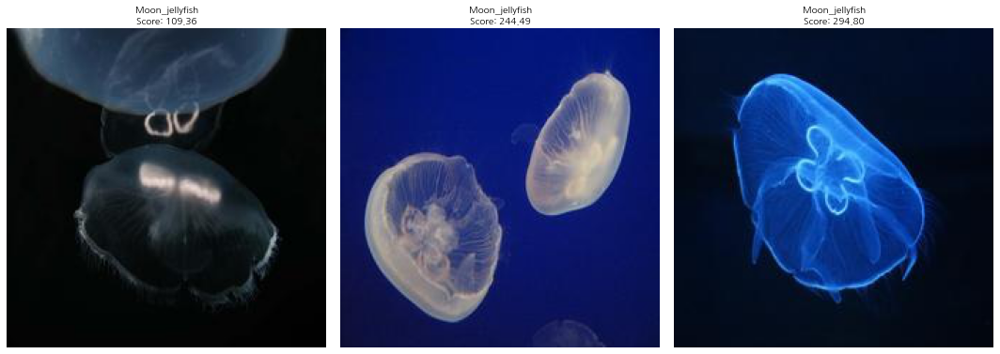


'barrel_jellyfish' 클래스 검사 (흐릿함 임계값 < 300)
  -> 총 2개의 흐릿한 이미지 발견. 가장 흐릿한 2개 표시:


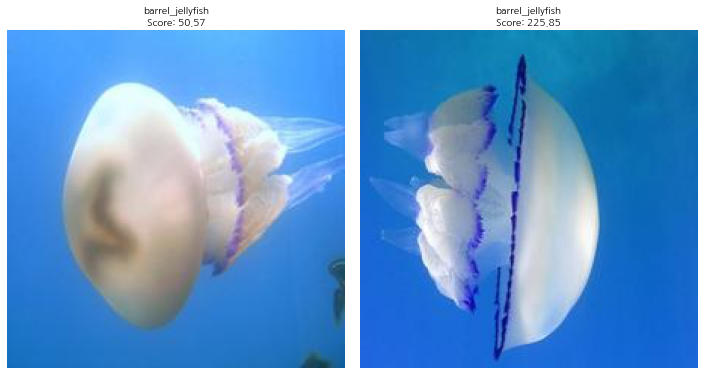


'blue_jellyfish' 클래스 검사 (흐릿함 임계값 < 300)
  -> 총 3개의 흐릿한 이미지 발견. 가장 흐릿한 3개 표시:


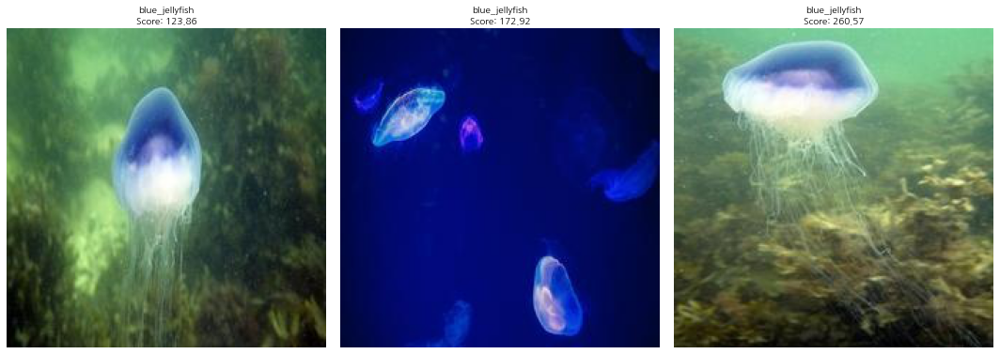


'compass_jellyfish' 클래스 검사 (흐릿함 임계값 < 300)
  -> 총 1개의 흐릿한 이미지 발견. 가장 흐릿한 1개 표시:


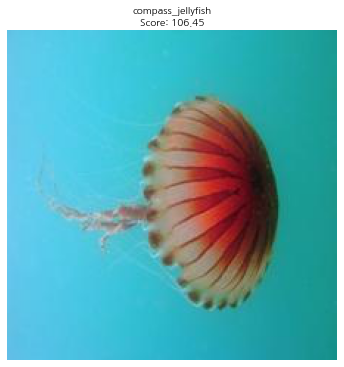


'lions_mane_jellyfish' 클래스 검사 (흐릿함 임계값 < 300)
  -> 총 2개의 흐릿한 이미지 발견. 가장 흐릿한 2개 표시:


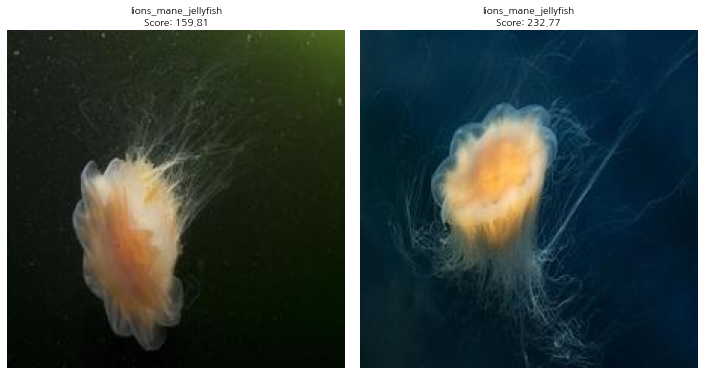


'mauve_stinger_jellyfish' 클래스 검사 (흐릿함 임계값 < 300)
  -> 총 1개의 흐릿한 이미지 발견. 가장 흐릿한 1개 표시:


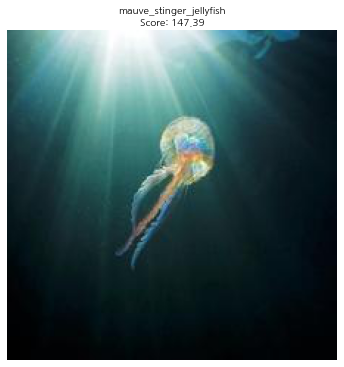


--- 흐릿한 이미지 검사 완료 ---


In [6]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image # 이미지를 열고 Matplotlib에서 사용하기 위해 추가
import matplotlib.font_manager as fm # 폰트 관리를 위해 추가

# --- Matplotlib 한글 폰트 설정 ---
# 이전에 사용한 폰트 설정 코드를 여기에 포함하거나,
# 별도 파일/셀에서 실행하여 전역적으로 적용되도록 합니다.
def setup_korean_font():
    """Matplotlib에서 사용할 한글 폰트를 설정합니다."""
    font_path = None
    try:
        font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
        korean_font_names = ['NanumGothic', 'Malgun Gothic', 'AppleSDGothicNeo']
        for font_file in font_list:
            try:
                font_name = fm.FontProperties(fname=font_file).get_name()
                if any(kor_name in font_name for kor_name in korean_font_names):
                    font_path = font_file
                    break
            except Exception:
                continue
        if font_path:
            font_name = fm.FontProperties(fname=font_path).get_name()
            plt.rcParams['font.family'] = font_name
            plt.rcParams['axes.unicode_minus'] = False
            print(f"Matplotlib 폰트 설정 완료: {font_name}")
        else:
            print("경고: 시스템에서 사용 가능한 한글 폰트를 찾지 못했습니다.")
    except Exception as e:
        print(f"폰트 설정 중 예외 발생: {e}")

# 함수 호출하여 폰트 설정 실행
setup_korean_font()
# --- 폰트 설정 끝 ---


def check_blurriness(img_path):
    """
    이미지의 흐릿함(blurriness) 점수를 계산합니다 (Laplacian variance 사용).
    점수가 낮을수록 흐릿할 가능성이 높습니다.

    Args:
        img_path (str): 검사할 이미지 파일 경로.

    Returns:
        float: 계산된 흐릿함 점수. 이미지를 읽을 수 없으면 float('inf') 반환.
    """
    try:
        # UTF-8/비영어 경로 및 안정적 로딩을 위해 imdecode 사용, Grayscale로 읽기
        img_bytes = np.fromfile(img_path, np.uint8)
        img = cv2.imdecode(img_bytes, cv2.IMREAD_GRAYSCALE)

        if img is None:
            # print(f"경고: 이미지를 GrayScale로 로드할 수 없습니다: {img_path}")
            # 이미지를 읽을 수 없는 경우, 흐릿하지 않은 것으로 간주 (매우 높은 점수 반환)
            return float('inf')

        # Laplacian 연산자 적용(ddepth=CV_64F로 정밀도 확보) 후 분산(variance) 계산
        laplacian_var = cv2.Laplacian(img, cv2.CV_64F).var()
        return laplacian_var

    except Exception as e:
        # print(f"흐릿함 점수 계산 중 오류 발생 ({img_path}): {e}")
        # 오류 발생 시에도 흐릿하지 않은 것으로 간주
        return float('inf')


def show_blurry_images(species_dir_full_path, threshold=300, num_images_to_show=3):
    """
    주어진 디렉토리에서 흐릿한 이미지를 찾아 상위 몇 개를 시각화합니다.

    Args:
        species_dir_full_path (str): 검사할 클래스(종)의 전체 디렉토리 경로.
        threshold (int, optional): 흐릿함 점수 임계값. 이 값보다 낮으면 흐릿하다고 판단. Defaults to 300.
        num_images_to_show (int, optional): 시각화할 최대 이미지 수. Defaults to 3.
    """
    blurry_images = []
    print(f"\n'{os.path.basename(species_dir_full_path)}' 클래스 검사 (흐릿함 임계값 < {threshold})")

    try:
        # 디렉토리 내 모든 항목 순회
        for item_name in os.listdir(species_dir_full_path):
            item_path = os.path.join(species_dir_full_path, item_name)

            # ★★★ 파일이고, 지정된 이미지 확장자인 경우에만 처리 ★★★
            if os.path.isfile(item_path) and item_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                # 흐릿함 점수 계산
                score = check_blurriness(item_path)

                # 점수가 임계값 미만이면 (유효한 점수일 때만) 리스트에 추가
                if score < threshold and score != float('inf'):
                    blurry_images.append((item_path, score))

    except FileNotFoundError:
        print(f"  오류: 디렉토리를 찾을 수 없습니다 - {species_dir_full_path}")
        return # 디렉토리 없으면 함수 종료
    except Exception as e:
        print(f"  '{species_dir_full_path}' 처리 중 오류 발생: {e}")
        return # 기타 오류 시 함수 종료

    # 흐릿한 이미지가 발견된 경우
    if blurry_images:
        # ★★★ 점수가 낮은 순서(더 흐릿한 순서)로 정렬 ★★★
        blurry_images.sort(key=lambda x: x[1])

        print(f"  -> 총 {len(blurry_images)}개의 흐릿한 이미지 발견. 가장 흐릿한 {min(num_images_to_show, len(blurry_images))}개 표시:")

        # 시각화할 이미지 개수 결정 (최대 num_images_to_show개)
        num_to_show = min(num_images_to_show, len(blurry_images))

        # 시각화 Figure 생성
        plt.figure(figsize=(5 * num_to_show, 5.5)) # 이미지 개수에 맞춰 크기 및 높이 조절

        # 상위 num_to_show 개의 흐릿한 이미지 시각화
        for i, (img_path, score) in enumerate(blurry_images[:num_to_show]):
            try:
                # PIL을 사용하여 이미지 열기
                img = Image.open(img_path)

                plt.subplot(1, num_to_show, i + 1) # 1행 num_to_show열
                plt.imshow(img)
                # 제목 설정 (클래스 이름과 점수)
                # 클래스 이름이 길 경우 줄바꿈 고려 가능
                title = f"{os.path.basename(species_dir_full_path)}\nScore: {score:.2f}"
                plt.title(title, fontsize=10) # 폰트 크기 조절
                plt.axis('off') # 축 숨기기
            except Exception as e_img:
                print(f"    이미지 표시 중 오류 ({img_path}): {e_img}")
                # 오류 발생 시 해당 subplot에 오류 메시지 표시
                plt.subplot(1, num_to_show, i + 1)
                plt.text(0.5, 0.5, 'Error loading image', ha='center', va='center')
                plt.axis('off')

        plt.tight_layout(pad=1.5) # 서브플롯 간 간격 및 패딩 조절
        plt.show() # 그래프 표시
    else:
        print(f"  -> 임계값({threshold}) 미만의 흐릿한 이미지를 찾지 못했습니다.")


# --- 메인 코드 실행 부분 ---

# ★★★ 사용자 요청에 따라 고정된 기본 데이터 디렉토리 경로
base_data_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid/test'

# 클래스 디렉토리 목록 가져오기 (이전 코드에서 정의된 로직 재사용)
try:
    exclude_dirs = ['Train_Test_Valid', '__MACOSX', '.ipynb_checkpoints', '..']
    class_dirs = [d for d in os.listdir(base_data_dir)
                  if os.path.isdir(os.path.join(base_data_dir, d)) and \
                  d not in exclude_dirs and not d.endswith('.zip')]
    class_dirs.sort()
    if not class_dirs:
         print(f"오류: '{base_data_dir}'에서 클래스 폴더를 찾을 수 없습니다.")
         exit()
except FileNotFoundError:
    print(f"오류: 베이스 디렉토리를 찾을 수 없습니다 - {base_data_dir}")
    exit()
except Exception as e:
    print(f"클래스 디렉토리 검색 중 오류 발생: {e}")
    exit()


# 각 클래스 디렉토리에 대해 흐릿한 이미지 검사 및 표시
print(f"\n--- 각 클래스별 흐릿한 이미지 검사 시작 (기준 경로: {base_data_dir}) ---")
if class_dirs:
    for species_dir_name in class_dirs:
        # ★★★ 클래스 폴더의 전체 경로 생성 (수정된 부분) ★★★
        full_species_path = os.path.join(base_data_dir, species_dir_name)

        # 생성된 전체 경로를 함수에 전달하여 흐릿한 이미지 표시
        # 예: 임계값 300 미만, 최대 3개 이미지 표시
        show_blurry_images(species_dir_full_path=full_species_path, threshold=300, num_images_to_show=3)
else:
    # class_dirs가 비어있는 경우는 위에서 처리됨
    pass

print("\n--- 흐릿한 이미지 검사 완료 ---")

In [7]:
import tensorflow as tf
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
from tensorflow.keras.applications import MobileNetV2
# MobileNetV2 전용 전처리 함수 임포트
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import matplotlib.font_manager as fm # 폰트 설정
import datetime # 시간 확인용 (선택적)

print(f"--- 스크립트 시작: {datetime.datetime.now()} ---", flush=True)
print(f"TensorFlow 버전: {tf.__version__}", flush=True)
print(f"NumPy 버전: {np.__version__}", flush=True)
print(f"OpenCV 버전: {cv2.__version__}", flush=True)

# --- Matplotlib 한글 폰트 설정 ---
print("--- 한글 폰트 설정 시작 ---", flush=True)
def setup_korean_font():
    """Matplotlib에서 사용할 한글 폰트를 설정합니다."""
    font_path = None
    try:
        font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
        korean_font_names = ['NanumGothic', 'Malgun Gothic', 'AppleSDGothicNeo']
        for font_file in font_list:
            try:
                font_name = fm.FontProperties(fname=font_file).get_name()
                if any(kor_name in font_name for kor_name in korean_font_names):
                    font_path = font_file
                    break
            except Exception:
                continue
        if font_path:
            font_name = fm.FontProperties(fname=font_path).get_name()
            plt.rcParams['font.family'] = font_name
            plt.rcParams['axes.unicode_minus'] = False
            print(f"Matplotlib 폰트 설정 완료: {font_name}", flush=True) # 완료 메시지 추가
        else:
            print("경고: 시스템에서 사용 가능한 한글 폰트를 찾지 못했습니다.", flush=True)
    except Exception as e:
        print(f"폰트 설정 중 예외 발생: {e}", flush=True)
setup_korean_font()
print("--- 한글 폰트 설정 완료 ---", flush=True)


# --- Jellyfish Augmentation Class 정의 ---
print("--- JellyfishFeaturesAugmentation 클래스 정의 시작 ---", flush=True)
class JellyfishFeaturesAugmentation:
    """
    해파리 종별 특성을 강화하는 데이터 증강 전략 (종 이름 업데이트됨)
    """
    def __init__(self, p=0.8):
        self.p = p
        # ★★★ 종 이름(key)을 실제 디렉토리/레이블 이름과 정확히 일치시킵니다 ★★★
        self.species_dict = {
            "Moon_jellyfish": "Moon jellyfish (Aurelia aurita)",
            "barrel_jellyfish": "Barrel jellyfish (Rhizostoma pulmo)",
            "blue_jellyfish": "Blue jellyfish (Cyanea lamarckii)",
            "compass_jellyfish": "Compass jellyfish (Chrysaora hysoscella)",
            "lions_mane_jellyfish": "Lion's mane jellyfish (Cyanea capillata)",
            "mauve_stinger_jellyfish": "Mauve stinger (Pelagia noctiluca)"
        }
        self.known_species = list(self.species_dict.keys())
        # 클래스 초기화 시 알려진 종 출력 (디버깅 도움)
        # print(f"  [Debug] Augmentation Acknowledged Species: {self.known_species}")

    # --- enhance_* 메소드들 ---
    # (메소드 내용은 이전과 동일하게 유지)
    def enhance_moon_jellyfish(self, image, intensity=0.3):
        result = image.copy().astype(np.uint8)
        gamma = 1.0 - intensity * 0.3
        inv_gamma = 1.0 / gamma
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)
        hsv = cv2.cvtColor(result, cv2.COLOR_RGB2HSV)
        hsv[:, :, 1] = hsv[:, :, 1] * (1 - intensity * 0.5)
        hsv[:, :, 2] = np.clip(hsv[:, :, 2] * (1 + intensity * 0.2), 0, 255)
        result = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
        edges = cv2.Canny(cv2.cvtColor(result, cv2.COLOR_RGB2GRAY), 50, 150)
        edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
        result = cv2.addWeighted(result, 1.0, edges_rgb, intensity * 0.2, 0)
        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_barrel_jellyfish(self, image, intensity=0.3):
        result = image.copy().astype(np.uint8)
        gamma = 1.0 - intensity * 0.4
        inv_gamma = 1.0 / gamma
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)
        try: # TensorFlow 연산 포함 시도
            tensor_image = tf.convert_to_tensor(result, dtype=tf.uint8)
            adjusted_contrast_tensor = tf.image.adjust_contrast(tensor_image, 1 + intensity * 0.5)
            result = adjusted_contrast_tensor.numpy()
        except Exception as e_tf:
             print(f"  [Warning] Barrel enhance: TF contrast adjustment failed: {e_tf}. Skipping.")
             # TF 사용 불가 시 OpenCV 방법 고려 또는 대비 조정 생략
             pass # 여기서는 그냥 넘어감
        sharpen_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
        sharpened = cv2.filter2D(result, -1, sharpen_kernel)
        result = cv2.addWeighted(result, 1.0, sharpened, intensity, 0)
        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_blue_jellyfish(self, image, intensity=0.3):
        result = image.copy().astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        # RGB 이미지의 B 채널은 인덱스 2
        try: # 채널 존재 확인
            if result.shape[2] >= 3:
                 result[:, :, 2] = clahe.apply(result[:, :, 2])
        except IndexError: pass # 채널 부족 시 무시
        blurred = cv2.GaussianBlur(result, (5, 5), sigmaX=1.5 * intensity)
        result = cv2.addWeighted(result, 1 - intensity, blurred, intensity, 0)
        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_compass_jellyfish(self, image, intensity=0.3):
        result = image.copy().astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try: # 채널 존재 확인
             if result.shape[2] >= 3:
                  for c in [0, 1]: # R, G 채널
                       result[:, :, c] = clahe.apply(result[:, :, c])
        except IndexError: pass
        sharpen_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
        sharpened = cv2.filter2D(result, -1, sharpen_kernel)
        result = cv2.addWeighted(result, 1 - intensity, sharpened, intensity, 0)
        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_lions_mane_jellyfish(self, image, intensity=0.3):
        result = image.copy().astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try: # 채널 존재 확인
             if result.shape[2] >= 3:
                  result[:, :, 1] = clahe.apply(result[:, :, 1]) # G 채널
        except IndexError: pass
        sharpen_kernel = np.array([[-1, -1, -1], [-1, 10, -1], [-1, -1, -1]])
        sharpened = cv2.filter2D(result, -1, sharpen_kernel * (intensity + 0.1)) # 약간 더 강하게
        result = cv2.addWeighted(result, 1 - intensity * 0.5, sharpened, intensity * 0.5, 0) # 블렌딩 조절
        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_mauve_stinger(self, image, intensity=0.3):
        result = image.copy().astype(np.uint8)
        gamma = 1.0 - intensity * 0.3
        inv_gamma = 1.0 / gamma
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)
        gray = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(gray, 60, 170) # 임계값 약간 조정
        edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
        result = cv2.addWeighted(result, 1.0, edges_rgb, intensity * 0.25, 0) # 가중치 약간 조정
        return np.clip(result, 0, 255).astype(np.uint8)

    # apply 메소드
    def apply(self, image, species, intensity=0.4):
        if species not in self.known_species or random.random() > self.p:
            return image.astype(np.uint8)
        result = image.copy().astype(np.uint8)
        try:
            # ... (이전과 동일한 if/elif 구조) ...
            if species == 'Moon_jellyfish': result = self.enhance_moon_jellyfish(result, intensity)
            elif species == 'barrel_jellyfish': result = self.enhance_barrel_jellyfish(result, intensity)
            elif species == 'blue_jellyfish': result = self.enhance_blue_jellyfish(result, intensity)
            elif species == 'compass_jellyfish': result = self.enhance_compass_jellyfish(result, intensity)
            elif species == 'lions_mane_jellyfish': result = self.enhance_lions_mane_jellyfish(result, intensity)
            elif species == 'mauve_stinger_jellyfish': result = self.enhance_mauve_stinger(result, intensity)
            else: return image.astype(np.uint8)
        except Exception as e:
            # print(f"  [Debug] Error during enhancement for {species}: {e}") # 디버깅 시 주석 해제
            return image.astype(np.uint8)
        return np.clip(result, 0, 255).astype(np.uint8)

    # visualize_* 메소드는 그대로 둠
    def visualize_enhancements(self, image, figsize=(15, 12)): pass
    def visualize_intensity_levels(self, image, species): pass
print("--- JellyfishFeaturesAugmentation 클래스 정의 완료 ---", flush=True)


# --- 상수 및 설정 ---
print("--- 상수 및 경로 설정 시작 ---", flush=True)
IMG_SIZE = 224
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

# ★★★ 사용자 확인 경로 설정 ★★★
base_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid'
train_dir = os.path.join(base_dir, 'Train')
val_dir = os.path.join(base_dir, 'Valid')
print(f"  Base directory: {base_dir}", flush=True)
print(f"  Train directory: {train_dir}", flush=True)
print(f"  Validation directory: {val_dir}", flush=True)
print("--- 상수 및 경로 설정 완료 ---", flush=True)


# --- 클래스 이름 및 개수 자동 감지 ---
print("--- 클래스 이름 및 개수 감지 시작 ---", flush=True)
class_names = [] # 미리 정의하여 NameError 방지
NUM_CLASSES = 0  # 미리 정의
try:
    print(f"  학습 디렉토리 존재 확인 중: {train_dir}", flush=True)
    if not os.path.exists(train_dir):
        raise FileNotFoundError(f"학습 데이터 디렉토리를 찾을 수 없습니다: {train_dir}")
    print(f"  학습 디렉토리 확인 완료.", flush=True)

    exclude_items = ['__MACOSX', '.ipynb_checkpoints', '.DS_Store']
    print(f"  클래스 목록 스캔 중 (제외 항목: {exclude_items})...", flush=True)
    all_items_in_train = os.listdir(train_dir)
    class_names = sorted([d for d in all_items_in_train
                       if os.path.isdir(os.path.join(train_dir, d)) and \
                       d not in exclude_items])
    if not class_names:
        raise ValueError(f"'{train_dir}'에서 클래스 폴더를 찾을 수 없습니다.")

    NUM_CLASSES = len(class_names)
    print(f"  감지된 클래스 ({NUM_CLASSES}개): {class_names}", flush=True)

    # Augmentation 클래스와 데이터셋 폴더 이름 비교
    print("  Augmentation 클래스 키와 데이터셋 폴더 이름 비교 중...", flush=True)
    augmenter_keys = set(JellyfishFeaturesAugmentation().species_dict.keys())
    dataset_keys = set(class_names)
    if augmenter_keys != dataset_keys:
        print("\n  경고: Augmentation 클래스의 종 목록과 데이터셋 폴더 목록이 일치하지 않습니다!", flush=True)
        print(f"    Augmentation Keys: {sorted(list(augmenter_keys))}", flush=True)
        print(f"    Dataset Folders  : {sorted(list(dataset_keys))}", flush=True)
    else:
        print("  Augmentation 클래스와 데이터셋 폴더 이름 일치 확인.", flush=True)

except Exception as e:
    print(f"클래스 디렉토리 검색 중 심각한 오류 발생: {e}", flush=True)
    print("!!! 스크립트 실행을 중단합니다 !!!", flush=True)
    exit() # 오류 시 확실히 종료
print("--- 클래스 이름 및 개수 감지 완료 ---", flush=True)


# 레이블 인덱스 매핑 생성
print("--- 레이블 매핑 생성 시작 ---", flush=True)
class_to_index = {name: i for i, name in enumerate(class_names)}
index_to_class = {i: name for name, i in class_to_index.items()}
print(f"  Class to Index mapping: {class_to_index}", flush=True)
print("--- 레이블 매핑 생성 완료 ---", flush=True)


# --- 데이터셋 생성 함수 ---
print("--- 데이터셋 생성 함수 정의 ---", flush=True)
def create_dataset(data_dir):
    image_paths = []
    labels = []
    print(f"  create_dataset 호출됨: {data_dir}", flush=True)
    if not os.path.exists(data_dir):
         print(f"  경고: 디렉토리가 존재하지 않습니다 - {data_dir}", flush=True)
         return image_paths, labels

    for class_name in class_names: # global class_names 사용
        class_dir_path = os.path.join(data_dir, class_name)
        if not os.path.isdir(class_dir_path): continue
        try:
            for fname in os.listdir(class_dir_path):
                if fname.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                    img_path = os.path.join(class_dir_path, fname)
                    if os.path.isfile(img_path):
                        image_paths.append(img_path)
                        labels.append(class_name)
        except Exception as e:
            print(f"  '{class_dir_path}' 처리 중 오류: {e}", flush=True)
            continue
    print(f"  {data_dir} 에서 {len(image_paths)}개 이미지 경로 발견.", flush=True)
    return image_paths, labels

# 학습 및 검증 데이터 경로/레이블 생성
print("--- 학습/검증 데이터 경로 및 레이블 생성 시작 ---", flush=True)
train_paths, train_labels = create_dataset(train_dir)
val_paths, val_labels = create_dataset(val_dir)

if not train_paths:
    print("오류: 학습 이미지를 찾을 수 없습니다. 경로 및 파일 구조를 확인하세요.", flush=True)
    exit()

print(f"--- 데이터 경로/레이블 생성 완료 (학습:{len(train_paths)}, 검증:{len(val_paths)}) ---", flush=True)


# tf.data.Dataset 생성
print("--- tf.data.Dataset 객체 생성 시작 ---", flush=True)
train_ds = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
val_ds = tf.data.Dataset.from_tensor_slices((val_paths, val_labels))
print("--- tf.data.Dataset 객체 생성 완료 ---", flush=True)


# --- 데이터 처리 및 증강 파이프라인 정의 ---
print("--- 데이터 처리 및 증강 파이프라인 함수 정의 시작 ---", flush=True)

# Augmentation 클래스 인스턴스 생성 (파이프라인 외부에서 생성)
jellyfish_augmenter_instance = JellyfishFeaturesAugmentation(p=0.7)
print("  JellyfishFeaturesAugmentation 인스턴스 생성됨.", flush=True)

# 1. 이미지 로딩 및 리사이징 함수
def decode_img(img_path):
    # print(f"  [Debug] Decoding: {img_path.numpy().decode('utf-8')}") # 매우 많은 출력 발생 가능
    try:
        img = tf.io.read_file(img_path)
        img = tf.image.decode_image(img, channels=3, expand_animations=False, dtype=tf.float32)
        img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method=tf.image.ResizeMethod.BILINEAR) # 리사이즈 방법 명시
        img = tf.ensure_shape(img, [IMG_SIZE, IMG_SIZE, 3])
    except Exception as e: # tf.errors 포함
        tf.print(f"이미지 디코딩/리사이징 오류: {img_path}", output_stream=os.sys.stderr) # TF 내부에서 출력
        img = tf.zeros([IMG_SIZE, IMG_SIZE, 3], dtype=tf.float32) # 오류 시 검은 이미지 반환
    return img

# 2. 커스텀 증강 래퍼 (tf.py_function용)
def augment_py_wrapper(image_tensor, species_tensor):
    image_np = image_tensor.numpy().astype(np.uint8)
    species_str = species_tensor.numpy().decode('utf-8')
    # 여기서 jellyfish_augmenter_instance 사용 (외부 인스턴스 참조)
    augmented_image_np = jellyfish_augmenter_instance.apply(image_np, species=species_str, intensity=random.uniform(0.2, 0.6))
    augmented_image_tensor = tf.cast(augmented_image_np, tf.float32)
    return augmented_image_tensor

# 3. 커스텀 증강 적용 함수 (tf.py_function 사용)
@tf.function
def apply_species_augmentation(image, label):
    # print("  [Debug] Applying species augmentation...") # @tf.function 내부 print는 동작 방식 다름
    aug_img = tf.py_function( func=augment_py_wrapper, inp=[image, label], Tout=tf.float32 )
    aug_img = tf.ensure_shape(aug_img, [IMG_SIZE, IMG_SIZE, 3])
    return aug_img, label

# 4. 최종 전처리 및 레이블 변환 함수
def finalize_preparation(image, label):
    # print("  [Debug] Finalizing preparation...") # @tf.function 내부 print는 동작 방식 다름
    def label_to_one_hot(lbl_str_tensor):
        lbl_str = lbl_str_tensor.numpy().decode('utf-8')
        idx = class_to_index.get(lbl_str, 0) # 오류 시 첫 번째 클래스 (0)으로 처리
        # if idx == -1: tf.print(f"경고: 알 수 없는 레이블 '{lbl_str}' 처리됨!", output_stream=os.sys.stderr)
        return tf.one_hot(idx, NUM_CLASSES, dtype=tf.float32)

    label_onehot = tf.py_function(func=label_to_one_hot, inp=[label], Tout=tf.float32)
    label_onehot = tf.ensure_shape(label_onehot, [NUM_CLASSES])

    # 이미지 정규화 (0-255 범위의 float32 입력 가정)
    image_normalized = preprocess_input(image * 255.0)

    return image_normalized, label_onehot
print("--- 데이터 처리 및 증강 파이프라인 함수 정의 완료 ---", flush=True)


# --- 데이터셋 파이프라인 구성 ---
print("\n--- 데이터 파이프라인 구성 시작 ---", flush=True)

# 학습 데이터셋 파이프라인
print("  학습 데이터셋 구성 중...", flush=True)
train_ds = train_ds.shuffle(buffer_size=len(train_paths))
print("   - Shuffle 완료.", flush=True)
train_ds = train_ds.map(lambda path, label: (decode_img(path), label), num_parallel_calls=AUTOTUNE)
print("   - decode_img 매핑 완료.", flush=True)
# (선택적 표준 증강 추가 지점)
train_ds = train_ds.map(apply_species_augmentation, num_parallel_calls=AUTOTUNE) # 커스텀 증강
print("   - apply_species_augmentation 매핑 완료.", flush=True)
train_ds = train_ds.map(finalize_preparation, num_parallel_calls=AUTOTUNE) # 최종 전처리
print("   - finalize_preparation 매핑 완료.", flush=True)
train_ds = train_ds.batch(BATCH_SIZE)
print(f"   - Batch({BATCH_SIZE}) 완료.", flush=True)
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
print("   - Prefetch 완료.", flush=True)
print("  학습 데이터셋 준비 완료.", flush=True)

# 검증 데이터셋 파이프라인
print("  검증 데이터셋 구성 중...", flush=True)
val_ds = val_ds.map(lambda path, label: (decode_img(path), label), num_parallel_calls=AUTOTUNE)
print("   - decode_img 매핑 완료.", flush=True)
val_ds = val_ds.map(finalize_preparation, num_parallel_calls=AUTOTUNE) # 최종 전처리
print("   - finalize_preparation 매핑 완료.", flush=True)
val_ds = val_ds.batch(BATCH_SIZE)
print(f"   - Batch({BATCH_SIZE}) 완료.", flush=True)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
print("   - Prefetch 완료.", flush=True)
print("  검증 데이터셋 준비 완료.", flush=True)


# --- MobileNetV2 모델 빌드 ---
print("--- MobileNetV2 모델 빌드 함수 정의 ---", flush=True)
def build_mobilenet_model(num_classes, img_size):
    """MobileNetV2 모델 빌드"""
    print(f"  빌드 시작: {num_classes} 클래스, 이미지 크기 {img_size}x{img_size}", flush=True)
    base_model = MobileNetV2(
        weights='imagenet', include_top=False, input_shape=(img_size, img_size, 3)
    )
    freeze_layer_count = -20
    print(f"  Base 모델 로드 완료. 마지막 {abs(freeze_layer_count)} 레이어 제외 동결.", flush=True)
    for layer in base_model.layers[:freeze_layer_count]:
        layer.trainable = False
    # Fine-tuning 시 BN 레이어 학습 유지 주석 처리됨
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        BatchNormalization(),
        Dense(256, activation='relu'),
        Dropout(0.4),
        Dense(num_classes, activation='softmax')
    ], name="MobileNetV2_Jellyfish")
    print("  Sequential 모델 구성 완료.", flush=True)
    model.compile(
        optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy']
    )
    print("  모델 컴파일 완료.", flush=True)
    return model

# 모델 빌드 실행
print("\n--- 모델 빌드 실행 시작 ---", flush=True)
model = build_mobilenet_model(num_classes=NUM_CLASSES, img_size=IMG_SIZE)
print("--- 모델 빌드 실행 완료 ---", flush=True)
# print("\n--- 모델 구조 요약 ---")
# model.summary() # 요약 출력은 길 수 있으므로 필요시 주석 해제
# print("--- 모델 구조 요약 완료 ---")


# --- 모델 학습 ---
print("\n" + "="*30, flush=True)
print(">>> 모델 학습 시작 (model.fit)... <<<", flush=True)
print("="*30, flush=True)
print(f"Epochs: {epochs}", flush=True) # 학습 에포크 수 확인
# ★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
# 여기 아래부터 Epoch 진행 상황 출력이 나와야 합니다.
# 예: Epoch 1/15 ... loss: ... accuracy: ... val_loss: ... val_accuracy: ...
# ★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
epochs = 15 # 학습 에포크 수 (예시)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_jellyfish_model.keras', save_best_only=True, monitor='val_accuracy'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
]

history = model.fit(
    train_ds,
    epochs=epochs,
    validation_data=val_ds,
    callbacks=callbacks,
    verbose=1 # 0: 출력 없음, 1: 진행 막대, 2: 에포크당 한 줄 (★ 반드시 1 또는 2로 설정 ★)
)

print("\n" + "="*30, flush=True)
print(f">>> 모델 학습 완료 ({datetime.datetime.now()}) <<<", flush=True)
print("="*30, flush=True)


# --- 학습 결과 시각화 (선택적) ---
print("\n--- 학습 결과 시각화 시작 ---", flush=True)
try:
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(len(acc)) # 실제 학습된 에포크 수

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.tight_layout()
    plt.show()
    print("--- 학습 결과 시각화 완료 ---", flush=True)
except KeyError as e:
    print(f"학습 결과 시각화 실패: history 객체에 필요한 키가 없습니다 - {e}", flush=True)
except Exception as e:
    print(f"학습 결과 시각화 중 오류 발생: {e}", flush=True)


# --- 증강 이미지 시각화 (샘플 확인용) ---
print("\n--- 증강된 학습 이미지 샘플 표시 시작 ---", flush=True)
try:
    plt.figure(figsize=(10, 10))
    # 시각화를 위해 데이터 파이프라인의 일부 재구성
    vis_ds = tf.data.Dataset.from_tensor_slices((train_paths[:9], train_labels[:9])) # 샘플 수 줄임 (최대 9개)
    vis_ds = vis_ds.map(lambda path, label: (decode_img(path), label), num_parallel_calls=AUTOTUNE)
    vis_ds = vis_ds.map(apply_species_augmentation, num_parallel_calls=AUTOTUNE) # 커스텀 증강만 적용

    plot_count = 0
    for i, (image, label) in enumerate(vis_ds):
        if i >= 9: break # 최대 9개만 표시
        ax = plt.subplot(3, 3, i + 1)
        # 이미지 시각화를 위해 0-255 범위의 uint8로 변환
        plt.imshow(image.numpy().astype("uint8"))
        plt.title(f"Augmented\n{label.numpy().decode('utf-8')}", fontsize=9)
        plt.axis("off")
        plot_count += 1

    if plot_count > 0:
        plt.tight_layout()
        plt.show()
    else:
        print("  시각화할 증강 이미지를 생성하지 못했습니다.")
    print("--- 증강된 학습 이미지 샘플 표시 완료 ---", flush=True)

except Exception as e:
    print(f"증강 이미지 시각화 중 오류 발생: {e}", flush=True)

print(f"\n--- 스크립트 종료: {datetime.datetime.now()} ---", flush=True)

--- 스크립트 시작: 2025-04-04 05:16:59.060641 ---
TensorFlow 버전: 2.6.0
NumPy 버전: 1.21.4
OpenCV 버전: 4.5.3
--- 한글 폰트 설정 시작 ---
Matplotlib 폰트 설정 완료: NanumGothic
--- 한글 폰트 설정 완료 ---
--- JellyfishFeaturesAugmentation 클래스 정의 시작 ---
--- JellyfishFeaturesAugmentation 클래스 정의 완료 ---
--- 상수 및 경로 설정 시작 ---
  Base directory: /aiffel/aiffel/jellyfish/Train_Test_Valid
  Train directory: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train
  Validation directory: /aiffel/aiffel/jellyfish/Train_Test_Valid/Valid
--- 상수 및 경로 설정 완료 ---
--- 클래스 이름 및 개수 감지 시작 ---
  학습 디렉토리 존재 확인 중: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train
  학습 디렉토리 확인 완료.
  클래스 목록 스캔 중 (제외 항목: ['__MACOSX', '.ipynb_checkpoints', '.DS_Store'])...
  감지된 클래스 (6개): ['Moon_jellyfish', 'barrel_jellyfish', 'blue_jellyfish', 'compass_jellyfish', 'lions_mane_jellyfish', 'mauve_stinger_jellyfish']
  Augmentation 클래스 키와 데이터셋 폴더 이름 비교 중...
  Augmentation 클래스와 데이터셋 폴더 이름 일치 확인.
--- 클래스 이름 및 개수 감지 완료 ---
--- 레이블 매핑 생성 시작 ---
  Class to Index mapping: {'Moon_j

NameError: name 'epochs' is not defined

Matplotlib 폰트 설정 완료: NanumGothic

--- 각 클래스별 첫 이미지 전경/배경 분석 시작 (총 6개 클래스) ---

[1/6] 클래스 처리 중: Moon_jellyfish
  -> 분석 대상 이미지: 07.JPG

[2/6] 클래스 처리 중: barrel_jellyfish
  -> 분석 대상 이미지: 08.jpg

[3/6] 클래스 처리 중: blue_jellyfish
  -> 분석 대상 이미지: 01.jpeg

[4/6] 클래스 처리 중: compass_jellyfish
  -> 분석 대상 이미지: 04.jpg

[5/6] 클래스 처리 중: lions_mane_jellyfish
  -> 분석 대상 이미지: 12.jpg

[6/6] 클래스 처리 중: mauve_stinger_jellyfish
  -> 분석 대상 이미지: 07.jpg


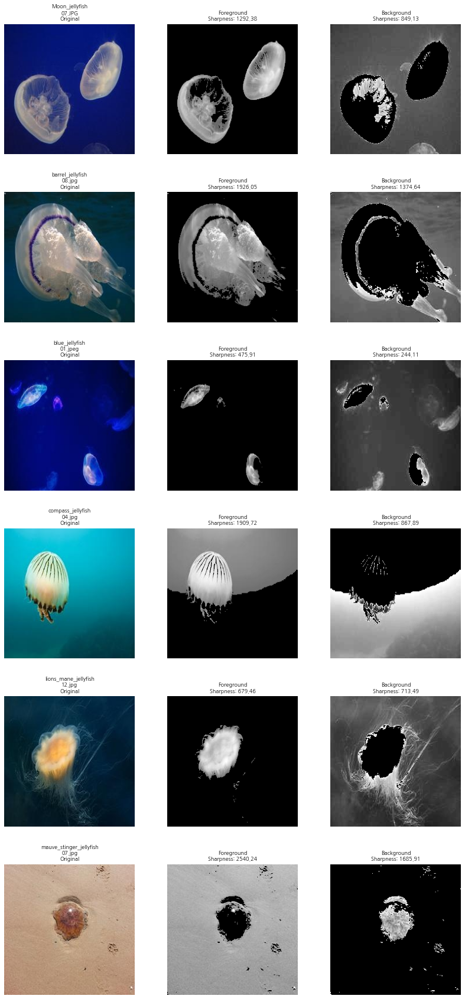


--- 전경/배경 분석 완료 ---


In [8]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm # 폰트 관리를 위해 추가

# --- Matplotlib 한글 폰트 설정 ---
# 이전에 사용한 폰트 설정 코드를 여기에 포함하거나,
# 별도 파일/셀에서 실행하여 전역적으로 적용되도록 합니다.
def setup_korean_font():
    """Matplotlib에서 사용할 한글 폰트를 설정합니다."""
    font_path = None
    try:
        font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
        korean_font_names = ['NanumGothic', 'Malgun Gothic', 'AppleSDGothicNeo']
        for font_file in font_list:
            try:
                font_name = fm.FontProperties(fname=font_file).get_name()
                if any(kor_name in font_name for kor_name in korean_font_names):
                    font_path = font_file
                    break
            except Exception:
                continue
        if font_path:
            font_name = fm.FontProperties(fname=font_path).get_name()
            plt.rcParams['font.family'] = font_name
            plt.rcParams['axes.unicode_minus'] = False
            print(f"Matplotlib 폰트 설정 완료: {font_name}")
        else:
            print("경고: 시스템에서 사용 가능한 한글 폰트를 찾지 못했습니다.")
    except Exception as e:
        print(f"폰트 설정 중 예외 발생: {e}")

# 함수 호출하여 폰트 설정 실행
setup_korean_font()
# --- 폰트 설정 끝 ---


def analyze_foreground_background(img_path):
    """
    Otsu's thresholding을 사용하여 이미지의 전경/배경을 분리하고,
    각 영역의 선명도(Laplacian variance)를 계산합니다.

    Args:
        img_path (str): 분석할 이미지 파일 경로.

    Returns:
        tuple: (fg_mask, bg_mask, fg_var, bg_var, original_img)
               오류 발생 시 (None, None, 0.0, 0.0, None) 반환.
    """
    try:
        # UTF-8/비영어 경로 및 안정적 로딩을 위해 imdecode 사용
        img_bytes = np.fromfile(img_path, np.uint8)
        img = cv2.imdecode(img_bytes, cv2.IMREAD_COLOR)

        if img is None:
            # print(f"경고: 이미지를 로드할 수 없습니다: {img_path}")
            return None, None, 0.0, 0.0, None

        # 그레이스케일 변환
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Otsu의 이진화 방법 적용 (자동 임계값 결정 + 이진 마스크 생성)
        # 배경이 어둡고 객체가 밝다는 가정하에 THRESH_BINARY 사용.
        # 반대 경우(배경 밝음, 객체 어두움) THRESH_BINARY_INV 고려.
        otsu_threshold, thresh_mask = cv2.threshold(
            gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
        )

        # Otsu가 실패하는 경우 (예: 단색 이미지) 처리 - threshold가 비정상적일 수 있음
        if otsu_threshold <= 1 or otsu_threshold >= 254:
             print(f"경고: Otsu 임계값이 비정상적({otsu_threshold}). 전경/배경 분리가 어려울 수 있음: {os.path.basename(img_path)}")
             # 이 경우, 마스크를 전체 또는 없음으로 처리하거나, 에러 반환 가능
             # 여기서는 일단 진행하되, 결과 해석에 주의 필요

        # 전경 마스크 생성: 원본 그레이스케일 이미지에서 Otsu 마스크의 흰색(전경) 부분만 남김
        # mask=thresh_mask 는 해당 마스크에서 0이 아닌 부분만 연산을 적용함
        fg_mask = cv2.bitwise_and(gray, gray, mask=thresh_mask)

        # 배경 마스크 생성: 원본 그레이스케일 이미지에서 Otsu 마스크의 검은색(배경) 부분만 남김
        # cv2.bitwise_not(thresh_mask)는 마스크를 반전시킴
        bg_mask = cv2.bitwise_and(gray, gray, mask=cv2.bitwise_not(thresh_mask))

        # 전경/배경 영역의 선명도(Laplacian variance) 계산
        # 참고: 마스크된 영역(값이 0인 부분)도 계산에 포함되므로,
        # 0이 아닌 픽셀만을 대상으로 분산을 계산하는 것이 더 정확할 수 있으나 복잡함.
        # 여기서는 마스크된 전체 영역의 분산을 계산.
        foreground_var = cv2.Laplacian(fg_mask, cv2.CV_64F).var()
        background_var = cv2.Laplacian(bg_mask, cv2.CV_64F).var()

        return fg_mask, bg_mask, foreground_var, background_var, img

    except cv2.error as e:
         # OpenCV 관련 에러 (예: 지원하지 않는 이미지 타입 등)
         print(f"OpenCV 오류 발생 ({img_path}): {e}")
         return None, None, 0.0, 0.0, None
    except Exception as e:
        # 기타 예외 처리
        print(f"전경/배경 분석 중 알 수 없는 오류 발생 ({img_path}): {e}")
        return None, None, 0.0, 0.0, None


# --- 메인 코드 실행 부분 ---

# ★★★ 사용자 요청에 따라 고정된 기본 데이터 디렉토리 경로
base_data_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid/test'

# 클래스 디렉토리 목록 가져오기 (이전 코드 재사용 및 오류 처리 강화)
try:
    if not os.path.exists(base_data_dir):
        raise FileNotFoundError(f"베이스 디렉토리를 찾을 수 없습니다: {base_data_dir}")

    exclude_dirs = ['Train_Test_Valid', '__MACOSX', '.ipynb_checkpoints', '..']
    all_items = os.listdir(base_data_dir)
    class_dirs = [d for d in all_items
                  if os.path.isdir(os.path.join(base_data_dir, d)) and \
                  d not in exclude_dirs and not d.endswith('.zip')]
    class_dirs.sort() # 이름순 정렬

    if not class_dirs:
         print(f"오류: '{base_data_dir}' 내에서 유효한 클래스 폴더를 찾을 수 없습니다.")
         exit() # 처리할 클래스가 없으면 종료

except FileNotFoundError as e:
    print(e)
    exit()
except Exception as e:
    print(f"클래스 디렉토리 검색 중 오류 발생: {e}")
    exit()


# 시각화 준비
num_classes = len(class_dirs)
print(f"\n--- 각 클래스별 첫 이미지 전경/배경 분석 시작 (총 {num_classes}개 클래스) ---")

# Figure 크기 동적 조절 (클래스 수에 따라 높이 결정)
plt.figure(figsize=(12, 4 * num_classes)) # 클래스당 높이 증가, 가로 너비 고정

plot_idx_counter = 1 # 서브플롯 인덱스 (1부터 시작)

# 각 클래스 디렉토리 순회
for i, species_dir_name in enumerate(class_dirs):
    current_row_start_idx = i * 3 + 1 # 현재 행의 첫 번째 subplot 인덱스
    print(f"\n[{i+1}/{num_classes}] 클래스 처리 중: {species_dir_name}")

    # ★★★ 클래스 폴더의 전체 경로 생성 ★★★
    class_path = os.path.join(base_data_dir, species_dir_name)

    # 클래스 폴더 내 이미지 파일 목록 가져오기 (jpg, jpeg, png)
    try:
        img_files = [
            f for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f)) and \
               f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ]
        img_files.sort() # 파일 목록 정렬 (선택 사항, 일관성을 위해)

    except FileNotFoundError:
         print(f"  -> 오류: 클래스 디렉토리 '{class_path}'를 찾을 수 없습니다.")
         # 오류 메시지를 해당 행의 첫 번째 subplot에 표시 (선택적)
         plt.subplot(num_classes, 3, current_row_start_idx)
         plt.text(0.5, 0.5, f"Directory not found:\n{species_dir_name}", ha='center', va='center', fontsize=8, color='red')
         plt.axis('off')
         # 이 클래스 건너뛰고 다음 클래스로 진행 (인덱스는 이미 고려됨)
         plot_idx_counter += 3 # 다음 행으로 넘어가도록 인덱스 증가
         continue
    except Exception as e:
        print(f"  -> 오류: '{class_path}' 파일 목록 조회 중 오류: {e}")
        plt.subplot(num_classes, 3, current_row_start_idx)
        plt.text(0.5, 0.5, f"Error listing files:\n{species_dir_name}", ha='center', va='center', fontsize=8, color='red')
        plt.axis('off')
        plot_idx_counter += 3
        continue

    # 이미지 파일이 없으면 메시지 표시 후 다음 클래스로
    if not img_files:
        print(f"  -> 경고: '{class_path}' 폴더에 이미지 파일이 없습니다.")
        plt.subplot(num_classes, 3, current_row_start_idx)
        plt.text(0.5, 0.5, f"No images found in:\n{species_dir_name}", ha='center', va='center', fontsize=8, color='orange')
        plt.axis('off')
        plot_idx_counter += 3
        continue

    # ★★★ 첫 번째 이미지의 전체 경로 생성 ★★★
    first_img_name = img_files[0]
    img_path = os.path.join(class_path, first_img_name)
    print(f"  -> 분석 대상 이미지: {first_img_name}")

    # 전경/배경 분석 함수 호출
    fg_mask, bg_mask, fg_var, bg_var, original = analyze_foreground_background(img_path)

    # 분석 결과가 유효한 경우에만 시각화
    if original is not None:
        try:
            # 1. 원본 이미지 표시 (subplot 인덱스는 plot_idx_counter 사용)
            plt.subplot(num_classes, 3, plot_idx_counter)
            plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
            # 클래스 이름과 파일 이름 표시 (파일 이름이 길면 잘릴 수 있음)
            title_orig = f"{species_dir_name}\n{first_img_name}\nOriginal"
            plt.title(title_orig, fontsize=9)
            plt.axis('off')
            plot_idx_counter += 1 # 다음 subplot 인덱스

            # 2. 전경 마스크 표시
            plt.subplot(num_classes, 3, plot_idx_counter)
            plt.imshow(fg_mask, cmap='gray') # 그레이스케일 컬러맵
            title_fg = f"Foreground\nSharpness: {fg_var:.2f}"
            plt.title(title_fg, fontsize=9)
            plt.axis('off')
            plot_idx_counter += 1

            # 3. 배경 마스크 표시
            plt.subplot(num_classes, 3, plot_idx_counter)
            plt.imshow(bg_mask, cmap='gray') # 그레이스케일 컬러맵
            title_bg = f"Background\nSharpness: {bg_var:.2f}"
            plt.title(title_bg, fontsize=9)
            plt.axis('off')
            plot_idx_counter += 1

        except Exception as e_plot:
            print(f"  -> 오류: 이미지 시각화 중 오류 발생 ({first_img_name}): {e_plot}")
            # 시각화 오류 발생 시, 오류 발생한 subplot 포함하여 해당 행의 나머지 비워둠
            # 오류 메시지를 마지막 빈 subplot에 표시 가능
            error_subplot_idx = plot_idx_counter # 현재 위치 또는 다음 위치
            if error_subplot_idx <= current_row_start_idx + 2: # 현재 행 범위 내인지 확인
                 plt.subplot(num_classes, 3, error_subplot_idx)
                 plt.text(0.5, 0.5, f"Plotting error", ha='center', va='center', fontsize=8, color='red')
                 plt.axis('off')
            # 이미 실패했으므로 해당 행의 나머지 subplot 인덱스까지 카운터 증가
            plot_idx_counter = current_row_start_idx + 3

    else:
         print(f"  -> 경고: '{first_img_name}' 이미지 분석 실패. 시각화를 건너<0xEB><0x9A><0xA5>니다.")
         # 분석 실패 시 해당 행의 첫 번째 subplot에 메시지 표시
         plt.subplot(num_classes, 3, current_row_start_idx)
         plt.text(0.5, 0.5, f"Analysis failed:\n{first_img_name}", ha='center', va='center', fontsize=8, color='red')
         plt.axis('off')
         # 해당 행의 나머지 subplot 인덱스까지 카운터 증가
         plot_idx_counter += 3


# 전체 레이아웃 조정 및 그래프 표시
plt.tight_layout(pad=2.5, h_pad=3.0) # 세로 간격(h_pad) 추가 조절
plt.show()

print("\n--- 전경/배경 분석 완료 ---")

In [9]:
# =====================================================
# Cell 1: 기본 설정 및 라이브러리 임포트
# =====================================================
import tensorflow as tf
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import matplotlib.font_manager as fm
import datetime

print(f"--- 스크립트 시작: {datetime.datetime.now()} ---", flush=True)
print(f"TensorFlow 버전: {tf.__version__}", flush=True)
# ... [이하 폰트 설정, 상수/경로 설정 코드는 이전과 동일] ...
# --- Matplotlib 한글 폰트 설정 ---
print("--- 한글 폰트 설정 시작 ---", flush=True)
def setup_korean_font():
    font_path = None
    try:
        font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
        korean_font_names = ['NanumGothic', 'Malgun Gothic', 'AppleSDGothicNeo']
        for font_file in font_list:
            try:
                font_name = fm.FontProperties(fname=font_file).get_name()
                if any(kor_name in font_name for kor_name in korean_font_names):
                    font_path = font_file; break
            except Exception: continue
        if font_path:
            font_name = fm.FontProperties(fname=font_path).get_name()
            plt.rcParams['font.family'] = font_name
            plt.rcParams['axes.unicode_minus'] = False
            print(f"  Matplotlib 폰트 설정 완료: {font_name}", flush=True)
        else:
            print("  경고: 시스템에서 사용 가능한 한글 폰트를 찾지 못했습니다.", flush=True)
    except Exception as e: print(f"  폰트 설정 중 예외 발생: {e}", flush=True)
setup_korean_font()
print("--- 한글 폰트 설정 완료 ---", flush=True)
# --- 상수 및 설정 ---
print("--- 상수 및 경로 설정 시작 ---", flush=True)
IMG_SIZE = 224
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE
base_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid'
train_dir = os.path.join(base_dir, 'Train')
val_dir = os.path.join(base_dir, 'Valid')
print(f"  Base directory: {base_dir}", flush=True)
print(f"  Train directory: {train_dir}", flush=True)
print(f"  Validation directory: {val_dir}", flush=True)
print("--- 상수 및 경로 설정 완료 ---", flush=True)
print("\n[Cell 1 완료] 기본 설정 및 임포트 완료.\n", flush=True)

--- 스크립트 시작: 2025-04-04 05:17:13.011086 ---
TensorFlow 버전: 2.6.0
--- 한글 폰트 설정 시작 ---
  Matplotlib 폰트 설정 완료: NanumGothic
--- 한글 폰트 설정 완료 ---
--- 상수 및 경로 설정 시작 ---
  Base directory: /aiffel/aiffel/jellyfish/Train_Test_Valid
  Train directory: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train
  Validation directory: /aiffel/aiffel/jellyfish/Train_Test_Valid/Valid
--- 상수 및 경로 설정 완료 ---

[Cell 1 완료] 기본 설정 및 임포트 완료.



In [10]:
# =====================================================
# Cell 2: JellyfishFeaturesAugmentation 클래스 정의 (모든 enhance_* 메소드 수정됨)
# =====================================================
import cv2 # Cell 1에서 import 했지만, 클래스 자체의 독립성을 위해 추가 가능
import numpy as np
import random
import tensorflow as tf # enhance_barrel_jellyfish 에서 사용
# matplotlib는 시각화 메소드용이므로 여기서는 필수 아님

print("--- JellyfishFeaturesAugmentation 클래스 정의 시작 ---", flush=True)
class JellyfishFeaturesAugmentation:
    """
    해파리 종별 특성을 강화하는 데이터 증강 전략 (메소드 포맷팅 수정됨)
    """
    def __init__(self, p=0.8):
        self.p = p
        self.species_dict = {
            "Moon_jellyfish": "Moon jellyfish (Aurelia aurita)",
            "barrel_jellyfish": "Barrel jellyfish (Rhizostoma pulmo)",
            "blue_jellyfish": "Blue jellyfish (Cyanea lamarckii)",
            "compass_jellyfish": "Compass jellyfish (Chrysaora hysoscella)",
            "lions_mane_jellyfish": "Lion's mane jellyfish (Cyanea capillata)",
            "mauve_stinger_jellyfish": "Mauve stinger (Pelagia noctiluca)"
        }
        self.known_species = list(self.species_dict.keys())
        # print(f"  [Debug] Augmentation Acknowledged Species: {self.known_species}")

    # --- 모든 enhance_* 메소드 (여러 줄로 나누고 들여쓰기 수정) ---

    def enhance_moon_jellyfish(self, image, intensity=0.3):
        """ Moon jellyfish 특성 강화 """
        result = image.copy().astype(np.uint8)

        # 1. 밝기 증가 (Gamma 보정)
        gamma = 1.0 - intensity * 0.3
        inv_gamma = 1.0 / gamma if gamma > 0 else 1.0 # 0 나누기 방지
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)

        # 2. 투명도 효과 (채도 감소 및 밝기 약간 증가)
        hsv = cv2.cvtColor(result, cv2.COLOR_RGB2HSV)
        # 채도 감소
        hsv[:, :, 1] = np.clip(hsv[:, :, 1] * (1 - intensity * 0.5), 0, 255)
        # 밝기 증가 (과도하지 않게)
        hsv[:, :, 2] = np.clip(hsv[:, :, 2] * (1 + intensity * 0.2), 0, 255)
        result = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)

        # 3. 엣지 강조 (Canny 사용)
        try:
            gray = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
            edges = cv2.Canny(gray, 50, 150)
            edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
            # 원본에 엣지 약하게 추가
            result = cv2.addWeighted(result, 1.0, edges_rgb, intensity * 0.2, 0)
        except cv2.error as e_cv:
             print(f"  [Warning] Moon enhance Canny/addWeighted failed: {e_cv}. Skipping edge enhancement.")
             pass # 엣지 강조 실패 시 그냥 넘어감

        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_barrel_jellyfish(self, image, intensity=0.3):
        """ Barrel jellyfish 특성 강화 (수정된 버전) """
        result = image.copy().astype(np.uint8)

        # 1. 밝기 증가 (Gamma 보정)
        gamma = 1.0 - intensity * 0.4
        inv_gamma = 1.0 / gamma if gamma > 0 else 1.0
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)

        # 2. 대비 증가 (TensorFlow 사용 시도)
        try:
            tensor_image = tf.convert_to_tensor(result, dtype=tf.uint8)
            adjusted_contrast_tensor = tf.image.adjust_contrast(tensor_image, 1 + intensity * 0.5)
            result = adjusted_contrast_tensor.numpy()
        except Exception as e_tf:
            print(f"  [Warning] Barrel enhance: TF contrast adjustment failed: {e_tf}. Skipping contrast.")
            pass

        # 3. 샤프닝
        sharpen_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
        sharpened = cv2.filter2D(result, -1, sharpen_kernel)
        result = cv2.addWeighted(result, 1.0, sharpened, intensity, 0)

        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_blue_jellyfish(self, image, intensity=0.3):
        """ Blue jellyfish 특성 강화 (수정된 버전) """
        result = image.copy().astype(np.uint8)

        # 1. B 채널에 CLAHE 적용
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try:
            if result.ndim == 3 and result.shape[2] >= 3:
                 result[:, :, 2] = clahe.apply(result[:, :, 2])
        except IndexError:
            print("  [Warning] Blue enhance: IndexError during CLAHE. Skipping.")
            pass
        except cv2.error as e_cv:
             print(f"  [Warning] Blue enhance CLAHE failed: {e_cv}. Skipping.")
             pass

        # 2. Gaussian Blur 적용
        # sigmaX 값을 intensity에 비례하게 하여 강도 조절
        try:
             blurred = cv2.GaussianBlur(result, (5, 5), sigmaX=max(0.1, 1.5 * intensity)) # sigma는 0보다 커야 함
        except cv2.error as e_cv:
             print(f"  [Warning] Blue enhance GaussianBlur failed: {e_cv}. Using original.")
             blurred = result # 블러 실패 시 원본 사용

        # 3. 원본과 블러된 이미지 블렌딩
        result = cv2.addWeighted(result, 1 - intensity, blurred, intensity, 0)

        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_compass_jellyfish(self, image, intensity=0.3):
        """ Compass jellyfish 특성 강화 """
        result = image.copy().astype(np.uint8)

        # 1. R, G 채널에 CLAHE 적용
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try:
            if result.ndim == 3 and result.shape[2] >= 3:
                for c in [0, 1]: # R(0), G(1) 채널
                    result[:, :, c] = clahe.apply(result[:, :, c])
        except IndexError:
            print("  [Warning] Compass enhance: IndexError during CLAHE. Skipping.")
            pass
        except cv2.error as e_cv:
             print(f"  [Warning] Compass enhance CLAHE failed: {e_cv}. Skipping.")
             pass

        # 2. 샤프닝
        sharpen_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
        try:
             sharpened = cv2.filter2D(result, -1, sharpen_kernel)
             # 3. 블렌딩
             result = cv2.addWeighted(result, 1 - intensity, sharpened, intensity, 0)
        except cv2.error as e_cv:
             print(f"  [Warning] Compass enhance sharpening/blending failed: {e_cv}. Skipping.")
             pass # 샤프닝/블렌딩 실패 시 그냥 넘어감

        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_lions_mane_jellyfish(self, image, intensity=0.3):
        """ Lion's mane jellyfish 특성 강화 """
        result = image.copy().astype(np.uint8)

        # 1. G 채널에 CLAHE 적용
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try:
            if result.ndim == 3 and result.shape[2] >= 3:
                 result[:, :, 1] = clahe.apply(result[:, :, 1]) # G 채널(인덱스 1)
        except IndexError:
             print("  [Warning] Lion's Mane enhance: IndexError during CLAHE. Skipping.")
             pass
        except cv2.error as e_cv:
             print(f"  [Warning] Lion's Mane enhance CLAHE failed: {e_cv}. Skipping.")
             pass

        # 2. 강한 샤프닝 및 블렌딩
        sharpen_kernel = np.array([[-1, -1, -1], [-1, 10, -1], [-1, -1, -1]])
        try:
             # intensity를 약간 더해서 커널 효과 조절 시도 (결과 보고 조정 필요)
             # filter2D 자체는 커널 값에 따라 작동, 강도는 블렌딩에서 조절하는 것이 일반적
             # sharpened = cv2.filter2D(result, -1, sharpen_kernel * (intensity + 0.1)) # 이 방식은 커널 값 자체 변경
             sharpened = cv2.filter2D(result, -1, sharpen_kernel) # 커널은 고정
             # 블렌딩 가중치 조절 (원본 비중 약간 낮춤, 샤프닝 비중 약간 높임)
             result = cv2.addWeighted(result, max(0, 1 - intensity * 1.2), sharpened, min(1, intensity * 1.2), 0)
        except cv2.error as e_cv:
             print(f"  [Warning] Lion's Mane enhance sharpening/blending failed: {e_cv}. Skipping.")
             pass

        return np.clip(result, 0, 255).astype(np.uint8)

    def enhance_mauve_stinger(self, image, intensity=0.3):
        """ Mauve stinger 특성 강화 """
        result = image.copy().astype(np.uint8)

        # 1. 밝기 증가 (Gamma 보정)
        gamma = 1.0 - intensity * 0.3
        inv_gamma = 1.0 / gamma if gamma > 0 else 1.0
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)

        # 2. 엣지 강조 (Canny 사용)
        try:
            gray = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
            # Canny 임계값은 이미지 특성에 따라 조절 필요할 수 있음
            edges = cv2.Canny(gray, 60, 170)
            edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
            # 원본에 엣지 추가 (가중치 조절 가능)
            result = cv2.addWeighted(result, 1.0, edges_rgb, intensity * 0.25, 0)
        except cv2.error as e_cv:
             print(f"  [Warning] Mauve stinger enhance Canny/addWeighted failed: {e_cv}. Skipping edge enhancement.")
             pass

        return np.clip(result, 0, 255).astype(np.uint8)

    # apply 메소드 (이전과 동일)
    def apply(self, image, species, intensity=0.4):
        if species not in self.known_species or random.random() > self.p:
            return image.astype(np.uint8)
        result = image.copy().astype(np.uint8)
        try:
            if species == 'Moon_jellyfish': result = self.enhance_moon_jellyfish(result, intensity)
            elif species == 'barrel_jellyfish': result = self.enhance_barrel_jellyfish(result, intensity)
            elif species == 'blue_jellyfish': result = self.enhance_blue_jellyfish(result, intensity)
            elif species == 'compass_jellyfish': result = self.enhance_compass_jellyfish(result, intensity)
            elif species == 'lions_mane_jellyfish': result = self.enhance_lions_mane_jellyfish(result, intensity)
            elif species == 'mauve_stinger_jellyfish': result = self.enhance_mauve_stinger(result, intensity)
            else: return image.astype(np.uint8)
        except Exception as e:
            # print(f"  [Debug] Error during enhancement for {species}: {e}")
            return image.astype(np.uint8)
        return np.clip(result, 0, 255).astype(np.uint8)

    # visualize_* 메소드 정의 (구현 생략)
    def visualize_enhancements(self, image, figsize=(15, 12)): pass
    def visualize_intensity_levels(self, image, species): pass

print("--- JellyfishFeaturesAugmentation 클래스 정의 완료 ---", flush=True)
print("\n[Cell 2 완료] Augmentation 클래스 정의 완료 (모든 enhance_* 메소드 포맷 수정).\n", flush=True)

--- JellyfishFeaturesAugmentation 클래스 정의 시작 ---
--- JellyfishFeaturesAugmentation 클래스 정의 완료 ---

[Cell 2 완료] Augmentation 클래스 정의 완료 (모든 enhance_* 메소드 포맷 수정).



In [11]:
# ====================================================================
# Cell 3: 데이터 경로 확인, 클래스 이름 감지, 레이블 매핑 생성
# ====================================================================
print("--- 클래스 이름 및 개수 감지 시작 ---", flush=True)
class_names = [] # 미리 정의
NUM_CLASSES = 0  # 미리 정의
try:
    print(f"  학습 디렉토리 존재 확인 중: {train_dir}", flush=True) # train_dir은 Cell 1에서 정의됨
    if not os.path.exists(train_dir):
        raise FileNotFoundError(f"학습 데이터 디렉토리를 찾을 수 없습니다: {train_dir}")
    print(f"  학습 디렉토리 확인 완료.", flush=True)

    exclude_items = ['__MACOSX', '.ipynb_checkpoints', '.DS_Store']
    print(f"  클래스 목록 스캔 중 (제외 항목: {exclude_items})...", flush=True)
    all_items_in_train = os.listdir(train_dir)
    class_names = sorted([d for d in all_items_in_train
                       if os.path.isdir(os.path.join(train_dir, d)) and \
                       d not in exclude_items])
    if not class_names:
        raise ValueError(f"'{train_dir}'에서 클래스 폴더를 찾을 수 없습니다.")

    NUM_CLASSES = len(class_names)
    print(f"  감지된 클래스 ({NUM_CLASSES}개): {class_names}", flush=True)

    # Augmentation 클래스와 데이터셋 폴더 이름 비교
    print("  Augmentation 클래스 키와 데이터셋 폴더 이름 비교 중...", flush=True)
    # Cell 2에서 정의된 클래스 사용
    augmenter_keys = set(JellyfishFeaturesAugmentation().species_dict.keys())
    dataset_keys = set(class_names)
    if augmenter_keys != dataset_keys:
        print("\n  경고: Augmentation 클래스의 종 목록과 데이터셋 폴더 목록이 일치하지 않습니다!", flush=True)
        print(f"    Augmentation Keys: {sorted(list(augmenter_keys))}", flush=True)
        print(f"    Dataset Folders  : {sorted(list(dataset_keys))}", flush=True)
    else:
        print("  Augmentation 클래스와 데이터셋 폴더 이름 일치 확인.", flush=True)

except Exception as e:
    print(f"클래스 디렉토리 검색 중 심각한 오류 발생: {e}", flush=True)
    print("!!! 스크립트 실행을 중단합니다 !!!", flush=True)
    # 필요시 exit() 호출
print("--- 클래스 이름 및 개수 감지 완료 ---", flush=True)

# 레이블 인덱스 매핑 생성
print("--- 레이블 매핑 생성 시작 ---", flush=True)
if class_names: # class_names가 성공적으로 감지되었을 때만 실행
     class_to_index = {name: i for i, name in enumerate(class_names)}
     index_to_class = {i: name for name, i in class_to_index.items()}
     print(f"  Class to Index mapping: {class_to_index}", flush=True)
else:
     print("  오류: 클래스 목록이 없어 레이블 매핑을 생성할 수 없습니다.", flush=True)
print("--- 레이블 매핑 생성 완료 ---", flush=True)

print("\n[Cell 3 완료] 데이터 정보 설정 완료.\n", flush=True)

--- 클래스 이름 및 개수 감지 시작 ---
  학습 디렉토리 존재 확인 중: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train
  학습 디렉토리 확인 완료.
  클래스 목록 스캔 중 (제외 항목: ['__MACOSX', '.ipynb_checkpoints', '.DS_Store'])...
  감지된 클래스 (6개): ['Moon_jellyfish', 'barrel_jellyfish', 'blue_jellyfish', 'compass_jellyfish', 'lions_mane_jellyfish', 'mauve_stinger_jellyfish']
  Augmentation 클래스 키와 데이터셋 폴더 이름 비교 중...
  Augmentation 클래스와 데이터셋 폴더 이름 일치 확인.
--- 클래스 이름 및 개수 감지 완료 ---
--- 레이블 매핑 생성 시작 ---
  Class to Index mapping: {'Moon_jellyfish': 0, 'barrel_jellyfish': 1, 'blue_jellyfish': 2, 'compass_jellyfish': 3, 'lions_mane_jellyfish': 4, 'mauve_stinger_jellyfish': 5}
--- 레이블 매핑 생성 완료 ---

[Cell 3 완료] 데이터 정보 설정 완료.



In [12]:
# ============================================================
# Cell 4: 데이터셋 생성 및 처리/증강 파이프라인 함수 정의 (★★★ 되돌린 버전 ★★★)
# ============================================================
print("--- 데이터셋 생성 및 처리 함수 정의 시작 (되돌린 버전) ---", flush=True)

# Augmentation 인스턴스 생성 (Cell 2 클래스 사용)
try:
    if 'JellyfishFeaturesAugmentation' in locals() or 'JellyfishFeaturesAugmentation' in globals():
        jellyfish_augmenter_instance = JellyfishFeaturesAugmentation(p=0.7)
        print("  JellyfishFeaturesAugmentation 인스턴스 생성됨.", flush=True)
    else: raise NameError("JellyfishFeaturesAugmentation not defined")
except Exception as e: print(f"Augmenter 인스턴스 생성 중 오류: {e}", flush=True); raise

# 데이터셋 생성 함수 (★★★ 문자열 레이블 반환 ★★★)
def create_dataset(data_dir):
    image_paths = []
    labels = [] # 문자열 레이블 저장
    if not os.path.exists(data_dir) or 'class_names' not in globals() or not class_names: return image_paths, labels
    for class_name in class_names:
        class_dir_path = os.path.join(data_dir, class_name)
        if not os.path.isdir(class_dir_path): continue
        try:
            for fname in os.listdir(class_dir_path):
                if fname.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                    img_path = os.path.join(class_dir_path, fname)
                    if os.path.isfile(img_path):
                        image_paths.append(img_path)
                        labels.append(class_name) # ★★★ 문자열 레이블 추가 ★★★
        except Exception as e: print(f"  '{class_dir_path}' 처리 중 오류: {e}", flush=True)
    return image_paths, labels

# 이미지 로딩/리사이징 함수 (변경 없음)
def decode_img(img_path):
    try:
        img_content = tf.io.read_file(img_path)
        img = tf.image.decode_image(img_content, channels=3, expand_animations=False, dtype=tf.uint8)
        img = tf.cast(img, tf.float32) / 255.0 # 0-1 float32
        img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method=tf.image.ResizeMethod.BILINEAR)
        img = tf.ensure_shape(img, [IMG_SIZE, IMG_SIZE, 3])
    except Exception as e:
        tf.print("오류: 이미지 디코딩/리사이징 실패 - ", img_path, "오류:", e, output_stream=os.sys.stderr)
        img = tf.zeros([IMG_SIZE, IMG_SIZE, 3], dtype=tf.float32)
    return img

# 커스텀 증강 래퍼 (★★★ 문자열 레이블 입력, 이미지 NumPy 반환 ★★★)
def augment_py_wrapper(image_tensor, species_tensor):
    image_np = (image_tensor.numpy() * 255.0).astype(np.uint8)
    species_str = species_tensor.numpy().decode('utf-8') # ★★★ 문자열 bytes 디코딩 ★★★
    # jellyfish_augmenter_instance는 외부에서 정의됨
    augmented_image_np = jellyfish_augmenter_instance.apply(image_np, species=species_str, intensity=random.uniform(0.2, 0.6))
    return augmented_image_np # uint8 NumPy 반환

# 커스텀 증강 적용 함수 (★★★ 문자열 레이블 처리, 이미지 텐서만 반환 ★★★)
@tf.function
def apply_species_augmentation_image_only(image, label_str): # ★★★ 입력: 이미지, 문자열 레이블 ★★★
    aug_img_np = tf.py_function(
        func=augment_py_wrapper,
        inp=[image, label_str], # 이미지와 문자열 레이블 전달
        Tout=tf.uint8           # NumPy uint8 반환
    )
    aug_img = tf.cast(aug_img_np, tf.float32) / 255.0 # uint8 -> float32 (0-1)
    aug_img = tf.ensure_shape(aug_img, [IMG_SIZE, IMG_SIZE, 3])
    return aug_img # 증강된 이미지만 반환

# 최종 전처리 및 레이블 변환 함수 (★★★ tf.py_function으로 원-핫 인코딩 되돌림 ★★★)
def finalize_preparation(image, label_str): # ★★★ 입력: 이미지, 문자열 레이블 ★★★
    """ 최종 전처리: 레이블 원-핫 인코딩(py_func 사용) 및 이미지 정규화 """

    # 1. 레이블(문자열)을 원-핫 인코딩하는 Python 함수
    def label_to_one_hot(lbl_str_tensor):
        lbl_str = lbl_str_tensor.numpy().decode('utf-8')
        idx = class_to_index.get(lbl_str, 0) # class_to_index는 Cell 3에서 정의
        # tf.one_hot은 Python 함수 내에서 직접 사용 불가 -> NumPy 배열 반환
        one_hot_np = np.zeros(NUM_CLASSES, dtype=np.float32) # NUM_CLASSES는 Cell 3에서 정의
        if 0 <= idx < NUM_CLASSES:
            one_hot_np[idx] = 1.0
        return one_hot_np # NumPy 배열 반환

    # tf.py_function을 사용하여 원-핫 인코딩 수행
    label_onehot = tf.py_function(
        func=label_to_one_hot,
        inp=[label_str],         # 문자열 레이블 텐서 전달
        Tout=tf.float32        # 반환 타입은 float32
    )
    label_onehot = tf.ensure_shape(label_onehot, [NUM_CLASSES]) # Shape 설정

    # 2. 이미지 정규화 (MobileNetV2용)
    image_scaled = image * 255.0
    image_normalized = preprocess_input(image_scaled)

    return image_normalized, label_onehot

print("--- 데이터셋 생성 및 처리 함수 정의 완료 (되돌린 버전) ---", flush=True)
print("\n[Cell 4 완료] 데이터 처리 함수 정의 완료 (되돌린 버전).\n", flush=True)

--- 데이터셋 생성 및 처리 함수 정의 시작 (되돌린 버전) ---
  JellyfishFeaturesAugmentation 인스턴스 생성됨.
--- 데이터셋 생성 및 처리 함수 정의 완료 (되돌린 버전) ---

[Cell 4 완료] 데이터 처리 함수 정의 완료 (되돌린 버전).



In [13]:
# ======================================================
# Cell 5: 데이터셋 생성 및 파이프라인 구성 실행 (검증 강화됨)
# ======================================================
print("--- 학습/검증 데이터 경로 및 레이블 생성 시작 ---", flush=True)
# Cell 4의 create_dataset 함수 호출 (train_dir, val_dir은 Cell 1에서 정의)
train_paths, train_labels = create_dataset(train_dir)
val_paths, val_labels = create_dataset(val_dir) # 검증 데이터 로드

# ★★★ 검증 데이터 로딩 확인 ★★★
if not train_paths:
    print("오류: 학습 이미지를 찾을 수 없습니다. 경로를 확인하고 이전 셀들을 다시 실행하세요.", flush=True)
    raise SystemExit("No training images found, stopping execution.")
elif not val_paths:
    # ★ 검증 이미지가 없는 경우 강력한 경고 또는 오류 발생 ★
    print("="*50, flush=True)
    print(f"★★★ 경고: 검증 디렉토리({val_dir})에서 이미지를 찾을 수 없습니다! ★★★", flush=True)
    print("  -> val_dir 경로가 올바른지, 해당 폴더 안에 클래스별 이미지가 있는지 확인하세요.", flush=True)
    print("  -> 검증 없이 학습만 진행되거나, 이후 단계에서 오류가 발생할 수 있습니다.", flush=True)
    print("="*50, flush=True)
    # 필요하다면 여기서 중단: raise SystemExit("No validation images found.")
else:
    print(f"--- 데이터 경로/레이블 생성 완료 (학습:{len(train_paths)}, 검증:{len(val_paths)}) ---", flush=True)

# tf.data.Dataset 생성
print("--- tf.data.Dataset 객체 생성 시작 ---", flush=True)
train_ds = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
# ★ 검증 데이터셋 생성 전 재확인 ★
if val_paths: # val_paths가 비어있지 않을 때만 생성
    val_ds = tf.data.Dataset.from_tensor_slices((val_paths, val_labels))
    print("  학습 및 검증 tf.data.Dataset 객체 생성 완료.", flush=True)
    # ★ 생성된 검증 데이터셋 크기 확인 (추정치) ★
    val_cardinality = tf.data.experimental.cardinality(val_ds)
    print(f"  추정된 검증 데이터셋 크기(Cardinality): {val_cardinality.numpy()}", flush=True)
else:
    val_ds = None # 검증 데이터셋 없음을 명시
    print("  학습 tf.data.Dataset 객체만 생성됨 (검증 데이터 없음).", flush=True)
print("--- tf.data.Dataset 객체 생성 완료 ---", flush=True)


# --- 데이터셋 파이프라인 구성 ---
print("\n--- 데이터 파이프라인 구성 시작 ---", flush=True)

# 학습 데이터셋 파이프라인 (이전과 동일)
print("  학습 데이터셋 구성 중...", flush=True)
train_ds = train_ds.shuffle(buffer_size=max(1000, len(train_paths)))
print("   - Shuffle 완료.", flush=True)
train_ds = train_ds.map(lambda path, label: (decode_img(path), label), num_parallel_calls=AUTOTUNE)
print("   - decode_img 매핑 완료.", flush=True)
train_ds = train_ds.map(apply_species_augmentation, num_parallel_calls=AUTOTUNE)
print("   - apply_species_augmentation 매핑 완료.", flush=True)
train_ds = train_ds.map(finalize_preparation, num_parallel_calls=AUTOTUNE)
print("   - finalize_preparation 매핑 완료.", flush=True)
train_ds = train_ds.batch(BATCH_SIZE)
print(f"   - Batch({BATCH_SIZE}) 완료.", flush=True)
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
print("   - Prefetch 완료.", flush=True)
print("  학습 데이터셋 준비 완료.", flush=True)

# 검증 데이터셋 파이프라인 (val_ds가 있을 때만 구성)
if val_ds is not None:
    print("  검증 데이터셋 구성 중...", flush=True)
    val_ds = val_ds.map(lambda path, label: (decode_img(path), label), num_parallel_calls=AUTOTUNE)
    print("   - decode_img 매핑 완료.", flush=True)
    val_ds = val_ds.map(finalize_preparation, num_parallel_calls=AUTOTUNE) # 최종 전처리
    print("   - finalize_preparation 매핑 완료.", flush=True)
    val_ds = val_ds.batch(BATCH_SIZE)
    print(f"   - Batch({BATCH_SIZE}) 완료.", flush=True)
    val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
    print("   - Prefetch 완료.", flush=True)

    # ★★★ 파이프라인 거친 후 데이터 확인 (옵션) ★★★
    print("  검증 데이터셋에서 샘플 1개 가져오기 시도...", flush=True)
    try:
        for example_image, example_label in val_ds.take(1):
            print(f"    -> 샘플 가져오기 성공. 이미지 shape: {example_image.shape}, 레이블 shape: {example_label.shape}", flush=True)
            # print(f"    -> 샘플 레이블 (one-hot): {example_label.numpy()}") # 너무 길 수 있음
    except tf.errors.OutOfRangeError:
        print("    -> 경고: 검증 데이터셋에서 샘플을 가져올 수 없습니다 (비어 있음?).", flush=True)
    except Exception as e:
        print(f"    -> 검증 데이터셋 샘플 확인 중 오류: {e}", flush=True)
    print("  검증 데이터셋 준비 완료.", flush=True)
else:
    print("  검증 데이터셋이 없어 파이프라인 구성을 건너<0xEB><0x9A><0xA5>니다.", flush=True)


print("\n[Cell 5 완료] 데이터셋 및 파이프라인 준비 완료.\n", flush=True)

--- 학습/검증 데이터 경로 및 레이블 생성 시작 ---
★★★ 경고: 검증 디렉토리(/aiffel/aiffel/jellyfish/Train_Test_Valid/Valid)에서 이미지를 찾을 수 없습니다! ★★★
  -> val_dir 경로가 올바른지, 해당 폴더 안에 클래스별 이미지가 있는지 확인하세요.
  -> 검증 없이 학습만 진행되거나, 이후 단계에서 오류가 발생할 수 있습니다.
--- tf.data.Dataset 객체 생성 시작 ---
  학습 tf.data.Dataset 객체만 생성됨 (검증 데이터 없음).
--- tf.data.Dataset 객체 생성 완료 ---

--- 데이터 파이프라인 구성 시작 ---
  학습 데이터셋 구성 중...
   - Shuffle 완료.
   - decode_img 매핑 완료.
   - apply_species_augmentation 매핑 완료.
   - finalize_preparation 매핑 완료.
   - Batch(32) 완료.
   - Prefetch 완료.
  학습 데이터셋 준비 완료.
  검증 데이터셋이 없어 파이프라인 구성을 건너<0xEB><0x9A><0xA5>니다.

[Cell 5 완료] 데이터셋 및 파이프라인 준비 완료.



In [16]:
# ===================================
# Cell 6: 모델 빌드
# ===================================
print("--- MobileNetV2 모델 빌드 함수 정의 ---", flush=True)
def build_mobilenet_model(num_classes, img_size):
    """MobileNetV2 모델 빌드"""
    print(f"  빌드 시작: {num_classes} 클래스, 이미지 크기 {img_size}x{img_size}", flush=True)
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_size, img_size, 3))
    freeze_layer_count = -20
    print(f"  Base 모델 로드 완료. 마지막 {abs(freeze_layer_count)} 레이어 제외 동결.", flush=True)
    for layer in base_model.layers[:freeze_layer_count]:
        layer.trainable = False
    model = Sequential([
        base_model, GlobalAveragePooling2D(), BatchNormalization(),
        Dense(256, activation='relu'), Dropout(0.4),
        Dense(num_classes, activation='softmax')
    ], name="MobileNetV2_Jellyfish")
    print("  Sequential 모델 구성 완료.", flush=True)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    print("  모델 컴파일 완료.", flush=True)
    return model

# 모델 빌드 실행 (NUM_CLASSES, IMG_SIZE는 이전 셀에서 정의됨)
print("\n--- 모델 빌드 실행 시작 ---", flush=True)
if 'NUM_CLASSES' in locals() and NUM_CLASSES > 0:
     model = build_mobilenet_model(num_classes=NUM_CLASSES, img_size=IMG_SIZE)
     print("--- 모델 빌드 실행 완료 ---", flush=True)
     print("\n--- 모델 구조 요약 ---")
     model.summary(print_fn=lambda x: print(x, flush=True)) # 요약 출력
     print("--- 모델 구조 요약 완료 ---")
else:
     print("오류: 모델 빌드에 필요한 NUM_CLASSES가 정의되지 않았거나 0입니다. 이전 셀들을 확인하세요.", flush=True)
     model = None # 모델 빌드 실패

print("\n[Cell 6 완료] 모델 빌드 완료.\n", flush=True)

--- MobileNetV2 모델 빌드 함수 정의 ---

--- 모델 빌드 실행 시작 ---
  빌드 시작: 6 클래스, 이미지 크기 224x224
  Base 모델 로드 완료. 마지막 20 레이어 제외 동결.
  Sequential 모델 구성 완료.
  모델 컴파일 완료.
--- 모델 빌드 실행 완료 ---

--- 모델 구조 요약 ---
Model: "MobileNetV2_Jellyfish"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d_4 ( (None, 1280)              0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 1280)              5120      
_________________________________________________________________
dense_8 (Dense)              (None, 256)               327936    
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)               0         
__________________________________________________

In [14]:
# ===================================
# Cell 7: 모델 학습 실행 (검증 데이터 전달 확인)
# ===================================

# Cell 6에서 모델 빌드 완료 확인, Cell 5에서 데이터셋 준비 완료 확인
if 'model' in locals() and model is not None and 'train_ds' in locals():
    print("\n" + "="*30, flush=True)
    print(">>> 모델 학습 시작 (model.fit)... <<<", flush=True)
    print("="*30, flush=True)

    epochs = 15
    print(f"  총 Epochs: {epochs}", flush=True)

    callbacks = [
        tf.keras.callbacks.ModelCheckpoint('best_jellyfish_model.keras', save_best_only=True, monitor='val_accuracy', verbose=1),
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
    ]
    print(f"  Callbacks 설정: ModelCheckpoint(monitor='val_accuracy'), EarlyStopping(monitor='val_loss', patience=5)", flush=True)

    # ★★★ validation_data 인자 확인 ★★★
    validation_dataset_to_use = None
    if 'val_ds' in locals() and val_ds is not None:
        # val_ds가 유효하게 생성되었는지 추가 확인 (예: cardinality)
        # take(1) 등으로 실제 데이터가 있는지 확인하는 것이 더 확실할 수 있음
        try:
             # 간단히 None이 아닌지만 확인하거나, 더 확실한 검증 추가
             if tf.data.experimental.cardinality(val_ds).numpy() > 0:
                  validation_dataset_to_use = val_ds
                  print("  검증 데이터셋(val_ds)을 model.fit에 전달합니다.", flush=True)
             else:
                  print("  경고: val_ds는 생성되었으나 비어있는 것 같습니다. 검증 없이 학습합니다.", flush=True)
        except Exception as e:
             print(f"  경고: val_ds 확인 중 오류 ({e}). 검증 없이 학습합니다.", flush=True)
    else:
        print("  경고: 검증 데이터셋(val_ds)이 준비되지 않았습니다. 검증 없이 학습합니다.", flush=True)


    print("\n  model.fit 호출 중... 에포크 진행 상황 출력을 기다리세요.", flush=True)
    print("  ★★★ 각 에포크 로그에 'val_loss'와 'val_accuracy'가 출력되는지 확인하세요! ★★★", flush=True)
    print("-" * 60, flush=True)

    history = model.fit(
        train_ds,
        epochs=epochs,
        # ★ validation_data 인자에 준비된 데이터셋 전달 (None일 수도 있음) ★
        validation_data=validation_dataset_to_use,
        callbacks=callbacks,
        verbose=1 # 에포크 진행 상황 출력
    )

    print("-" * 60, flush=True)
    print("\n" + "="*30, flush=True)
    print(f">>> 모델 학습 완료 ({datetime.datetime.now()}) <<<", flush=True)
    print("="*30, flush=True)

else:
    print("오류: 모델 학습을 시작할 수 없습니다. 모델 또는 학습 데이터셋이 준비되지 않았습니다.", flush=True)
    history = None

print("\n[Cell 7 완료] 모델 학습 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)


>>> 모델 학습 시작 (model.fit)... <<<
  총 Epochs: 15
  Callbacks 설정: ModelCheckpoint(monitor='val_accuracy'), EarlyStopping(monitor='val_loss', patience=5)
  경고: 검증 데이터셋(val_ds)이 준비되지 않았습니다. 검증 없이 학습합니다.

  model.fit 호출 중... 에포크 진행 상황 출력을 기다리세요.
  ★★★ 각 에포크 로그에 'val_loss'와 'val_accuracy'가 출력되는지 확인하세요! ★★★
------------------------------------------------------------
Epoch 1/15
29/29 [==============================] - 31s 164ms/step - loss: 1.5197 - accuracy: 0.4911
Epoch 2/15
29/29 [==============================] - 3s 111ms/step - loss: 1.2178 - accuracy: 0.5322
Epoch 3/15
29/29 [==============================] - 3s 114ms/step - loss: 1.2736 - accuracy: 0.5144
Epoch 4/15
29/29 [==============================] - 3s 117ms/step - loss: 1.1800 - accuracy: 0.5478
Epoch 5/15
29/29 [==============================] - 3s 115ms/step - loss: 1.0359 - accuracy: 0.5656
Epoch 6/15
29/29 [==============================] - 3s 117ms/step - loss: 1.1213 - accuracy: 0.5278
Epoch 7/15
29/29 [==================


--- 학습 결과 시각화 시작 ---
  History 객체에 기록된 키: ['loss', 'accuracy']
  (시각화 정보) Validation Accuracy 기록이 없어 그래프에 표시되지 않습니다.
  (시각화 정보) Validation Loss 기록이 없어 그래프에 표시되지 않습니다.


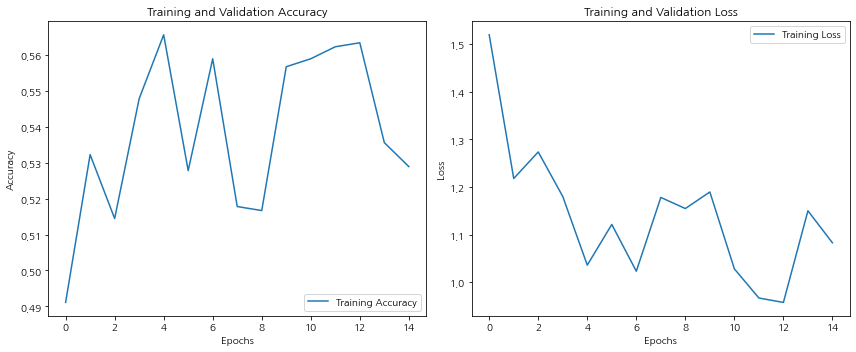

--- 학습 결과 시각화 완료 ---

[Cell 8 완료] 결과 시각화 완료 또는 건너<0xEB><0x9A><0xA5>.



In [15]:
# ===================================
# Cell 8: 학습 결과 시각화 (키 존재 여부 상세 확인)
# ===================================
print("\n--- 학습 결과 시각화 시작 ---", flush=True)

if 'history' in locals() and history is not None and history.history:
    print(f"  History 객체에 기록된 키: {list(history.history.keys())}", flush=True) # ★ 어떤 키들이 있는지 출력
    try:
        # 키 존재 여부를 확인하고 값 추출
        acc = history.history.get('accuracy')
        val_acc = history.history.get('val_accuracy') # ★ 이 키가 있는지 확인
        loss = history.history.get('loss')
        val_loss = history.history.get('val_loss')   # ★ 이 키가 있는지 확인

        # 모든 필요한 값이 정상적으로 추출되었는지 확인
        if acc is not None and loss is not None: # Training 값은 필수
            epochs_range = range(len(acc))
            plt.figure(figsize=(12, 5))

            # Accuracy Plot
            plt.subplot(1, 2, 1)
            plt.plot(epochs_range, acc, label='Training Accuracy')
            if val_acc is not None: # ★ val_accuracy가 있을 때만 그리기
                plt.plot(epochs_range, val_acc, label='Validation Accuracy')
            else:
                 print("  (시각화 정보) Validation Accuracy 기록이 없어 그래프에 표시되지 않습니다.")
            plt.legend(loc='lower right'); plt.title('Training and Validation Accuracy'); plt.xlabel('Epochs'); plt.ylabel('Accuracy')

            # Loss Plot
            plt.subplot(1, 2, 2)
            plt.plot(epochs_range, loss, label='Training Loss')
            if val_loss is not None: # ★ val_loss가 있을 때만 그리기
                plt.plot(epochs_range, val_loss, label='Validation Loss')
            else:
                 print("  (시각화 정보) Validation Loss 기록이 없어 그래프에 표시되지 않습니다.")
            plt.legend(loc='upper right'); plt.title('Training and Validation Loss'); plt.xlabel('Epochs'); plt.ylabel('Loss')

            plt.tight_layout()
            plt.show()
            print("--- 학습 결과 시각화 완료 ---", flush=True)
        else:
             print("  학습 결과 시각화 실패: history 객체에 'accuracy' 또는 'loss' 키가 없습니다.", flush=True)

    except Exception as e:
        print(f"  학습 결과 시각화 중 오류 발생: {e}", flush=True)
else:
     print("  학습 기록(history)이 없어 시각화를 건너<0xEB><0x9A><0xA5>니다.", flush=True)

print("\n[Cell 8 완료] 결과 시각화 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)


--- 증강 전/후 학습 이미지 샘플 표시 시작 ---
  4개 샘플에 대해 증강 전/후 비교 시각화 시도...


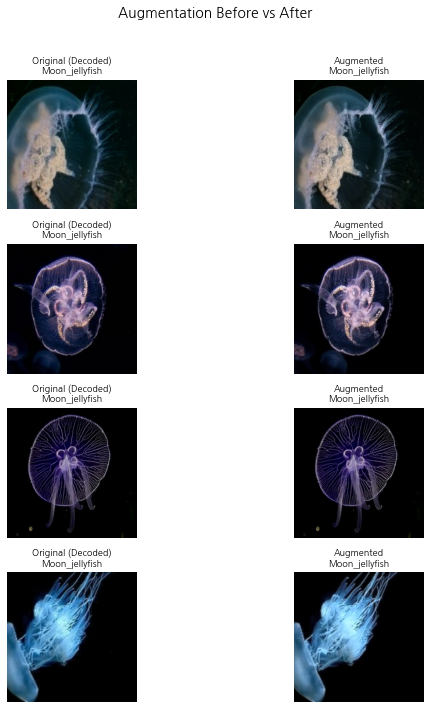

  4개 샘플에 대한 증강 전/후 비교 표시 완료.
--- 증강 전/후 학습 이미지 샘플 표시 완료 ---

--- 스크립트 종료 시뮬레이션 (Cell 9 위치) ---

[Cell 9 완료] 모든 과정 완료.



In [16]:
# ===========================================
# Cell 9: 증강 전/후 비교 시각화 (진단용)
# ===========================================
print("\n--- 증강 전/후 학습 이미지 샘플 표시 시작 ---", flush=True)

# train_paths, train_labels 변수가 필요 (Cell 5에서 문자열 레이블 사용 가정)
if 'train_paths' in locals() and train_paths and 'train_labels' in locals():
    try:
        num_vis_samples = min(4, len(train_paths)) # 샘플 수를 4개로 줄여서 확인
        if num_vis_samples == 0: raise ValueError("No training paths available for visualization.")

        vis_paths = train_paths[:num_vis_samples]
        vis_labels = train_labels[:num_vis_samples] # 문자열 레이블 사용

        print(f"  {num_vis_samples}개 샘플에 대해 증강 전/후 비교 시각화 시도...", flush=True)
        plt.figure(figsize=(10, 2.5 * num_vis_samples)) # Figure 크기 조절
        plt.suptitle("Augmentation Before vs After", fontsize=14)

        # 데이터셋 생성 및 처리 (map을 사용하여 각 이미지 처리)
        vis_ds = tf.data.Dataset.from_tensor_slices((vis_paths, vis_labels))

        # 1. 디코딩/리사이징만 적용
        decoded_ds = vis_ds.map(lambda path, label_str: (decode_img(path), label_str), num_parallel_calls=AUTOTUNE)

        # 2. 디코딩된 결과에 증강 적용
        #   apply_species_augmentation_image_only는 이미지만 반환하므로 lambda 사용
        augmented_ds = decoded_ds.map(
            lambda image, label_str: (image, apply_species_augmentation_image_only(image, label_str), label_str), # 원본이미지, 증강이미지, 레이블 반환
            num_parallel_calls=AUTOTUNE
        )

        plot_count = 0
        # 생성된 데이터셋에서 이미지 가져와서 표시
        for i, (original_image, augmented_image, label_str) in enumerate(augmented_ds):
            if i >= num_vis_samples: break

            # 원본 (디코딩/리사이징 후)
            ax = plt.subplot(num_vis_samples, 2, 2*i + 1)
            img_orig_show = (original_image.numpy() * 255.0).astype("uint8") # 0-1 float -> 0-255 uint8
            plt.imshow(np.clip(img_orig_show, 0, 255)) # Clip 추가
            plt.title(f"Original (Decoded)\n{label_str.numpy().decode('utf-8')}", fontsize=9)
            plt.axis("off")

            # 증강 후
            ax = plt.subplot(num_vis_samples, 2, 2*i + 2)
            img_aug_show = (augmented_image.numpy() * 255.0).astype("uint8") # 0-1 float -> 0-255 uint8
            plt.imshow(np.clip(img_aug_show, 0, 255)) # Clip 추가
            plt.title(f"Augmented\n{label_str.numpy().decode('utf-8')}", fontsize=9)
            plt.axis("off")
            plot_count += 1

        if plot_count > 0:
            plt.tight_layout(rect=[0, 0, 1, 0.96]) # suptitle 공간 확보
            plt.show()
            print(f"  {plot_count}개 샘플에 대한 증강 전/후 비교 표시 완료.", flush=True)
        else:
            print("  시각화할 이미지를 생성하지 못했습니다.")
        print("--- 증강 전/후 학습 이미지 샘플 표시 완료 ---", flush=True)

    except Exception as e:
        print(f"증강 전/후 이미지 시각화 중 오류 발생: {e}", flush=True)
else:
     print("  학습 데이터 경로/레이블 없어 시각화 생략.", flush=True)


print(f"\n--- 스크립트 종료 시뮬레이션 (Cell 9 위치) ---", flush=True)
print("\n[Cell 9 완료] 모든 과정 완료.\n", flush=True)

In [17]:
# =====================================================
# Cell A: 증강 활용 예시를 위한 기본 설정 및 임포트
# =====================================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import tensorflow as tf
# import albumentations as A # Cell D 실행 시 필요

# --- 이 셀들을 실행하기 전에 이전의 Cell 1, Cell 2, Cell 3이 실행되어 ---
# --- JellyfishFeaturesAugmentation 클래스, 경로 변수(예: train_paths), ---
# --- 레이블 매핑(예: index_to_class) 등이 정의되어 있다고 가정합니다. ---

# 만약 정의되지 않았다면 필요한 부분을 가져오거나 다시 정의해야 합니다.
# 예시: from your_previous_code import JellyfishFeaturesAugmentation, train_paths, index_to_class

print("[Cell A 완료] 증강 활용 예시를 위한 기본 설정 완료.\n", flush=True)

[Cell A 완료] 증강 활용 예시를 위한 기본 설정 완료.



In [18]:
# =====================================================
# Cell B: 단일 이미지 데모 함수 정의 및 실행 예시
# =====================================================
print("--- Cell B 시작: 단일 이미지 데모 ---", flush=True)

# 1. 단일 이미지 데모 함수 정의
def demo_feature_enhancement(image_path, augmenter_instance):
    """
    단일 이미지에 모든 해파리 종별 특성 강화 효과를 시각화하는 데모.
    """
    print(f"\n--- 단일 이미지 데모 시작: {os.path.basename(image_path)} ---", flush=True)
    try:
        # Robust 이미지 로딩
        img_bytes = np.fromfile(image_path, np.uint8)
        image = cv2.imdecode(img_bytes, cv2.IMREAD_COLOR)
        if image is None: raise ValueError("이미지 로드 실패")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # RGB 변환

        print("  각 종별 강화 효과 시각화 호출 중...", flush=True)
        # Augmenter 클래스 내 visualize_enhancements 메소드 호출
        augmenter_instance.visualize_enhancements(image)

        print("\n  특정 종(예: compass_jellyfish)에 대한 다양한 강도 수준 시각화 호출 중...", flush=True)
        species_key_for_intensity_demo = 'compass_jellyfish' # 시각화할 종 키 (Augmenter와 일치해야 함)
        if species_key_for_intensity_demo in augmenter_instance.known_species:
             # Augmenter 클래스 내 visualize_intensity_levels 메소드 호출
             augmenter_instance.visualize_intensity_levels(image, species_key_for_intensity_demo)
        else:
             print(f"  경고: '{species_key_for_intensity_demo}'가 알려진 종 목록에 없습니다.", flush=True)

    except FileNotFoundError:
        print(f"  오류: 데모 이미지 경로를 찾을 수 없습니다 - {image_path}", flush=True)
    except AttributeError as e:
         print(f"  오류: Augmenter 객체에 필요한 메소드(visualize_*)가 없습니다: {e}", flush=True)
    except Exception as e:
        print(f"  데모 실행 중 오류 발생: {e}", flush=True)
    print("--- 단일 이미지 데모 끝 ---", flush=True)

# 2. 데모 함수 실행 예시
#    - 이전 Cell 들에서 train_paths와 JellyfishFeaturesAugmentation 클래스가 정의되었다고 가정
if 'train_paths' in locals() and train_paths and 'JellyfishFeaturesAugmentation' in locals():
    # 데모용 Augmenter 인스턴스 생성 (항상 적용)
    augmenter_for_demo = JellyfishFeaturesAugmentation(p=1.0)
    # 첫 번째 학습 이미지 경로 사용
    demo_image_path = train_paths[0]
    # 데모 함수 호출
    demo_feature_enhancement(demo_image_path, augmenter_for_demo)
else:
    print("데모 실행에 필요한 'train_paths' 또는 'JellyfishFeaturesAugmentation' 클래스를 찾을 수 없습니다.", flush=True)

print("\n[Cell B 완료] 단일 이미지 데모 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)

--- Cell B 시작: 단일 이미지 데모 ---

--- 단일 이미지 데모 시작: aug-19-28.jpg ---
  각 종별 강화 효과 시각화 호출 중...

  특정 종(예: compass_jellyfish)에 대한 다양한 강도 수준 시각화 호출 중...
--- 단일 이미지 데모 끝 ---

[Cell B 완료] 단일 이미지 데모 완료 또는 건너<0xEB><0x9A><0xA5>.



--- Cell C 시작: 배치 데이터 증강 (tf.data 외부) ---

  배치 증강 함수 테스트 시작...
    가상 데이터 생성: 이미지 (4, 64, 64, 3), 레이블 (4,)
    사용될 Species Mapping: {0: 'Moon_jellyfish', 1: 'barrel_jellyfish', 2: 'blue_jellyfish', 3: 'compass_jellyfish', 4: 'lions_mane_jellyfish', 5: 'mauve_stinger_jellyfish'}
  배치 크기 4에 대해 증강 적용 시작...
  배치 증강 적용 완료.
    증강된 배치 데이터 shape: (4, 64, 64, 3)


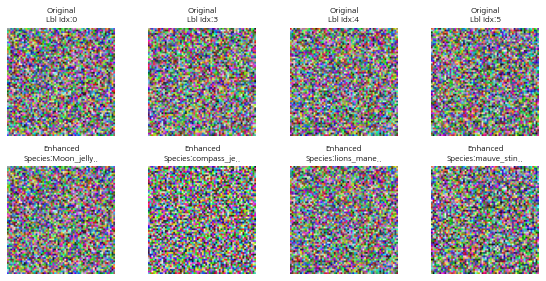


[Cell C 완료] 배치 데이터 증강 함수 정의 및 예시 완료 또는 건너<0xEB><0x9A><0xA5>.



In [19]:
# ==================================================================
# Cell C: 배치 데이터 증강 함수 정의 및 사용 예시 (tf.data 외부)
# ==================================================================
print("--- Cell C 시작: 배치 데이터 증강 (tf.data 외부) ---", flush=True)

# 1. 배치 데이터 증강 함수 정의
def apply_batch_enhancement(images, labels, species_mapping, augmenter_instance):
    """
    배치 데이터(NumPy 배열)에 종별 맞춤형 증강 적용 (tf.data 외 사용 예시)
    """
    enhanced_images = []
    if not isinstance(images, np.ndarray) or not isinstance(labels, np.ndarray):
         print("  경고: 입력 images와 labels는 NumPy 배열이어야 합니다.", flush=True)
         return images

    print(f"  배치 크기 {len(images)}에 대해 증강 적용 시작...", flush=True)
    for i, (img, label_index) in enumerate(zip(images, labels)):
        try:
            species_key = species_mapping.get(label_index)
            if species_key:
                # intensity는 랜덤 또는 고정값 사용
                enhanced = augmenter_instance.apply(img.astype(np.uint8), species=species_key, intensity=random.uniform(0.2, 0.6))
                enhanced_images.append(enhanced)
            else:
                 # print(f"  경고: 레이블 인덱스 {label_index}에 대한 종 매핑이 없습니다. 원본 사용.", flush=True) # 너무 많은 출력 방지
                 enhanced_images.append(img.astype(np.uint8))
        except Exception as e:
            print(f"  배치 증강 중 오류 발생 (인덱스: {i}, 레이블: {label_index}): {e}", flush=True)
            enhanced_images.append(img.astype(np.uint8)) # 오류 시 원본 사용

    print(f"  배치 증강 적용 완료.", flush=True)
    return np.array(enhanced_images, dtype=np.uint8)

# 2. 배치 데이터 증강 사용 예시
#    - 이전 Cell 들에서 index_to_class, JellyfishFeaturesAugmentation 등이 정의되었다고 가정
if 'index_to_class' in locals() and 'JellyfishFeaturesAugmentation' in locals():
    print("\n  배치 증강 함수 테스트 시작...", flush=True)
    # 가상의 배치 데이터 생성 (예: 4개의 64x64 이미지)
    dummy_images = np.random.randint(0, 256, size=(4, 64, 64, 3), dtype=np.uint8)
    # 가상의 레이블 인덱스 생성 (0부터 NUM_CLASSES-1 사이의 값)
    num_classes_check = len(index_to_class)
    if num_classes_check > 0:
        dummy_labels = np.random.randint(0, num_classes_check, size=(4,))
        print(f"    가상 데이터 생성: 이미지 {dummy_images.shape}, 레이블 {dummy_labels.shape}", flush=True)

        # 레이블 인덱스 -> 종 이름(key) 매핑 (index_to_class 사용)
        # 주의: index_to_class의 value가 Augmenter의 key와 일치해야 함
        species_map_for_batch = index_to_class
        print(f"    사용될 Species Mapping: {species_map_for_batch}", flush=True)

        # Augmenter 인스턴스 생성
        augmenter_for_batch = JellyfishFeaturesAugmentation(p=0.7)

        # 배치 증강 함수 호출
        enhanced_batch = apply_batch_enhancement(dummy_images, dummy_labels, species_map_for_batch, augmenter_for_batch)
        print(f"    증강된 배치 데이터 shape: {enhanced_batch.shape}", flush=True)

        # (선택적) 결과 이미지 몇 개 시각화
        plt.figure(figsize=(8, 4))
        for i in range(min(4, len(dummy_images))):
             plt.subplot(2, 4, i + 1)
             plt.imshow(dummy_images[i])
             label_idx = dummy_labels[i]
             plt.title(f"Original\nLbl Idx:{label_idx}", fontsize=8)
             plt.axis('off')

             plt.subplot(2, 4, i + 5)
             plt.imshow(enhanced_batch[i])
             species_name = species_map_for_batch.get(label_idx, 'Unknown')
             plt.title(f"Enhanced\nSpecies:{species_name[:10]}..", fontsize=8)
             plt.axis('off')
        plt.tight_layout()
        plt.show()

    else:
        print("  클래스 정보가 없어 배치 증강 테스트를 건너<0xEB><0x9A><0xA5>니다.", flush=True)
else:
    print("배치 증강 테스트에 필요한 'index_to_class' 또는 'JellyfishFeaturesAugmentation'을 찾을 수 없습니다.", flush=True)


print("\n[Cell C 완료] 배치 데이터 증강 함수 정의 및 예시 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)

In [20]:
# ====================================================
# Cell D: Albumentations 통합 예시 함수 정의
# ====================================================
print("--- Cell D 시작: Albumentations 통합 예시 ---", flush=True)

# 1. Albumentations 통합 함수 정의
def get_feature_enhancement_transform(augmenter_instance, species=None):
    """ Albumentations 변환과 결합된 특성 강화 증강 생성 예시. """
    try:
        import albumentations as A
        print("  Albumentations 라이브러리 임포트 성공.", flush=True)
    except ImportError:
        print("  오류: 이 함수를 사용하려면 'albumentations' 라이브러리가 필요합니다. (pip install albumentations)", flush=True)
        return None

    # species 인자는 데이터 로더 등 외부에서 받아와야 함 (여기선 예시로 고정)
    current_species = species
    # 예: if species is None and hasattr(augmenter_instance, 'known_species') and augmenter_instance.known_species:
    #    current_species = random.choice(augmenter_instance.known_species)

    print(f"  Albumentations 파이프라인 생성 (적용 종: {current_species}, 확률: {augmenter_instance.p})...", flush=True)
    transform = A.Compose([
        A.RandomRotate90(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.08, scale_limit=0.1, rotate_limit=30, p=0.6),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        # 커스텀 증강 적용 (Lambda 사용, p 확률로 실행됨)
        A.Lambda(image=lambda img, **kwargs: augmenter_instance.apply(img, species=current_species, intensity=random.uniform(0.2, 0.6)), p=augmenter_instance.p),
        A.RandomBrightnessContrast(p=0.3),
        # Normalize는 보통 파이프라인 마지막 또는 모델 입력 직전에 적용
    ])
    print("  Albumentations 파이프라인 생성 완료.", flush=True)
    return transform

# 2. Albumentations 사용 예시 (간단히 함수 호출만)
#    - JellyfishFeaturesAugmentation 클래스가 정의되었다고 가정
if 'JellyfishFeaturesAugmentation' in locals():
    print("\n  Albumentations 통합 함수 테스트 호출...", flush=True)
    augmenter_for_alb = JellyfishFeaturesAugmentation(p=0.7)
    # 특정 종 (예: 'blue_jellyfish') 또는 None으로 테스트
    alb_transform = get_feature_enhancement_transform(augmenter_for_alb, species='blue_jellyfish')

    if alb_transform:
        print("  Albumentations 변환 파이프라인이 성공적으로 생성되었습니다.", flush=True)
        # 사용 예: transformed_image = alb_transform(image=my_numpy_image)['image']
    else:
        print("  Albumentations 변환 파이프라인 생성에 실패했습니다 (라이브러리 확인 필요).", flush=True)
else:
    print("Albumentations 통합 테스트에 필요한 'JellyfishFeaturesAugmentation' 클래스를 찾을 수 없습니다.", flush=True)


print("\n[Cell D 완료] Albumentations 통합 예시 함수 정의 완료 또는 실패.\n", flush=True)

--- Cell D 시작: Albumentations 통합 예시 ---

  Albumentations 통합 함수 테스트 호출...
  Albumentations 라이브러리 임포트 성공.
  Albumentations 파이프라인 생성 (적용 종: blue_jellyfish, 확률: 0.7)...
  Albumentations 파이프라인 생성 완료.
  Albumentations 변환 파이프라인이 성공적으로 생성되었습니다.

[Cell D 완료] Albumentations 통합 예시 함수 정의 완료 또는 실패.



/opt/conda/lib/python3.9/site-packages/albumentations/augmentations/transforms.py:2454: UserWarning: Using lambda is incompatible with multiprocessing. Consider using regular functions or partial().
  warnings.warn(


In [21]:
# =======================================================================
# Cell E: TensorFlow 데이터 파이프라인 사용 시도 함수 정의 (Deprecated)
# =======================================================================
print("--- Cell E 시작: TensorFlow 파이프라인 통합 시도 (Deprecated) ---", flush=True)

# 1. Deprecated 함수 정의
def jellyfish_feature_enhancement_tf_deprecated(image, label, species_mapping, augmenter_instance):
    """
    TensorFlow 데이터 파이프라인에서 사용 시도 예시 (비권장).
    Graph 모드에서는 .numpy() 호출 불가 -> tf.py_function 필요.
    """
    print("  경고: jellyfish_feature_enhancement_tf_deprecated 함수는 Graph 모드에서 오류를 발생시킬 수 있습니다. tf.py_function 사용을 권장합니다.", flush=True)
    # 실제 실행은 tf.py_function 내에서 이루어져야 함
    # 아래 코드는 Eager 모드에서만 개념적으로 동작 가능
    try:
        label_index = label.numpy() # Graph 모드 에러 발생 지점
        species_key = species_mapping.get(label_index)
        if species_key is None: return image, label

        image_np = image.numpy().astype(np.uint8) # Graph 모드 에러 발생 지점
        enhanced_np = augmenter_instance.apply(image_np, species=species_key, intensity=random.uniform(0.2, 0.6))
        enhanced = tf.convert_to_tensor(enhanced_np, dtype=tf.float32)
        enhanced = tf.ensure_shape(enhanced, image.shape)
        return enhanced, label
    except AttributeError: # .numpy() 호출 시 발생 가능
         tf.print("오류: .numpy() 호출 실패. Graph 모드에서는 tf.py_function을 사용해야 합니다.", output_stream=os.sys.stderr)
         return image, label # 오류 시 원본 반환
    except Exception as e:
         tf.print(f"오류 발생 in jellyfish_feature_enhancement_tf_deprecated: {e}", output_stream=os.sys.stderr)
         return image, label

# 2. 함수 정의 완료 메시지
print("  참고용 Deprecated 함수 정의 완료.", flush=True)

print("\n[Cell E 완료] TensorFlow 파이프라인 통합 시도 함수 정의 완료.\n", flush=True)

--- Cell E 시작: TensorFlow 파이프라인 통합 시도 (Deprecated) ---
  참고용 Deprecated 함수 정의 완료.

[Cell E 완료] TensorFlow 파이프라인 통합 시도 함수 정의 완료.



In [22]:
# ================================================================
# Cell (A'): 특성 강화 시각화를 위한 설정 및 임포트
# ================================================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import matplotlib.font_manager as fm # 폰트 설정 (Cell 1에서 이미 설정됨)

# --- 이 셀 이후의 코드를 실행하기 전에 이전 Cell 1, 2, 3이 실행되어 ---
# --- 아래 변수들이 정의되어 있어야 합니다:
# --- 1. JellyfishFeaturesAugmentation 클래스
# --- 2. setup_korean_font() 함수 실행 (Cell 1)
# --- 3. train_dir 경로 변수 (Cell 1)
# --- 4. class_names 리스트 (Cell 3)
# --- 5. (선택적) base_dir 경로 변수 (Cell 1)

print("[Cell A' 완료] 특성 강화 시각화를 위한 기본 설정 확인.\n", flush=True)

[Cell A' 완료] 특성 강화 시각화를 위한 기본 설정 확인.



In [23]:
# ================================================================
# Cell (B'): 클래스별 원본/증강 비교 시각화 함수 정의
# ================================================================
print("--- 함수 정의 시작: show_before_after_species_fixed ---", flush=True)

def show_before_after_species_fixed(data_directory, class_names_list, augmenter_instance, samples_per_class=2, figsize=(10, 10)):
    """
    각 클래스별로 원본 이미지와 특성 강화가 적용된 이미지를 비교 시각화합니다.
    Args:
        data_directory (str): 클래스 폴더가 포함된 디렉토리 경로 (예: train_dir).
        class_names_list (list): 실제 클래스(폴더) 이름 목록.
        augmenter_instance: 사용할 JellyfishFeaturesAugmentation 객체.
        samples_per_class (int): 클래스당 보여줄 샘플 수.
        figsize (tuple): 각 클래스별 Figure 크기.
    """
    print(f"\n--- 클래스별 원본/특성강화 비교 시각화 시작 (소스: {data_directory}) ---", flush=True)
    if not class_names_list:
         print("  오류: 시각화할 클래스 목록이 비어있습니다.", flush=True)
         return
    if augmenter_instance is None:
         print("  오류: Augmenter 인스턴스가 제공되지 않았습니다.", flush=True)
         return

    # 시각화를 위해 항상 증강 적용하도록 설정 (원본 확률 p 무시)
    original_p = augmenter_instance.p # 원래 확률 저장
    augmenter_instance.p = 1.0

    for species_key in sorted(class_names_list): # 실제 클래스(폴더) 이름 사용
        species_dir = os.path.join(data_directory, species_key)
        print(f"\n  처리 중인 클래스: {species_key} (경로: {species_dir})", flush=True)

        if not os.path.isdir(species_dir):
            print(f"  경고: '{species_dir}' 디렉토리를 찾을 수 없습니다. 건너<0xEB><0x9A><0xA5>니다.", flush=True)
            continue

        try:
            img_files = [f for f in os.listdir(species_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            random.shuffle(img_files) # 랜덤 샘플 선택
            img_files_sample = img_files[:samples_per_class]
        except Exception as e:
             print(f"  '{species_dir}' 파일 목록 조회 중 오류: {e}. 건너<0xEB><0x9A><0xA5>니다.", flush=True)
             continue

        if not img_files_sample:
            print(f"  경고: '{species_dir}'에 표시할 이미지가 없습니다. 건너<0xEB><0x9A><0xA5>니다.", flush=True)
            continue

        # 클래스별로 별도 Figure 생성
        plt.figure(figsize=(figsize[0], samples_per_class * 4.5)) # 샘플 수 따라 높이 조절
        display_species_name = augmenter_instance.species_dict.get(species_key, species_key)
        plt.suptitle(f"{display_species_name} - Before / After (Feature Enhanced)", fontsize=14)

        for i, img_name in enumerate(img_files_sample):
            img_path = os.path.join(species_dir, img_name)
            try:
                # 이미지 로드 (Robust loading)
                img_bytes = np.fromfile(img_path, np.uint8)
                img = cv2.imdecode(img_bytes, cv2.IMREAD_COLOR)
                if img is None: raise ValueError(f"이미지 로드 실패: {img_name}")
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # RGB 변환

                # Before
                plt.subplot(samples_per_class, 2, 2*i + 1)
                plt.imshow(img_rgb)
                plt.title(f"Original ({img_name[:10]}..)", fontsize=9)
                plt.axis("off")

                # After (올바른 species_key 사용, 특성 강화 Augmenter 사용)
                # intensity 값은 데모용으로 고정하거나 조절 가능
                enhanced = augmenter_instance.apply(img_rgb, species=species_key, intensity=0.4)
                plt.subplot(samples_per_class, 2, 2*i + 2)
                plt.imshow(enhanced)
                plt.title("Enhanced (Features)", fontsize=9) # 제목 변경
                plt.axis("off")

            except Exception as e_img:
                 print(f"    이미지 처리/시각화 오류 ({img_name}): {e_img}", flush=True)
                 try: # 오류 발생 시 빈 subplot 표시
                     plt.subplot(samples_per_class, 2, 2*i + 1); plt.title(f"Load Error\n({img_name[:10]}..)", fontsize=9); plt.axis("off")
                     plt.subplot(samples_per_class, 2, 2*i + 2); plt.title("Load Error", fontsize=9); plt.axis("off")
                 except Exception: pass

        plt.tight_layout(rect=[0, 0, 1, 0.96]) # suptitle 공간 확보
        plt.show() # 클래스마다 플롯 표시

    # 원래 확률 p 복원
    augmenter_instance.p = original_p
    print("\n--- 클래스별 원본/증강 비교 시각화 끝 ---", flush=True)

print("--- 함수 정의 완료: show_before_after_species_fixed ---", flush=True)
print("\n[Cell B' 완료] 특성 강화 비교 시각화 함수 정의 완료.\n", flush=True)

--- 함수 정의 시작: show_before_after_species_fixed ---
--- 함수 정의 완료: show_before_after_species_fixed ---

[Cell B' 완료] 특성 강화 비교 시각화 함수 정의 완료.



--- Cell C' 시작: 특성 강화 시각화 실행 ---
  시각화용 Augmenter 인스턴스 생성 완료 (p=1.0).

--- 클래스별 원본/특성강화 비교 시각화 시작 (소스: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train) ---

  처리 중인 클래스: Moon_jellyfish (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train/Moon_jellyfish)


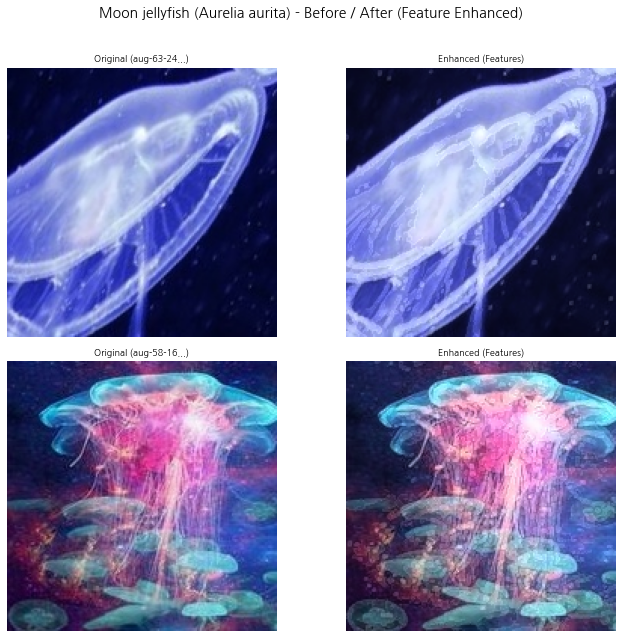


  처리 중인 클래스: barrel_jellyfish (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train/barrel_jellyfish)


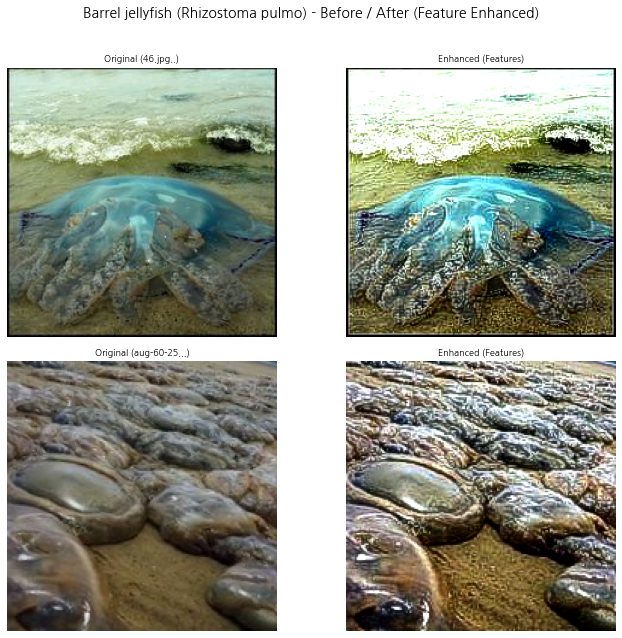


  처리 중인 클래스: blue_jellyfish (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train/blue_jellyfish)


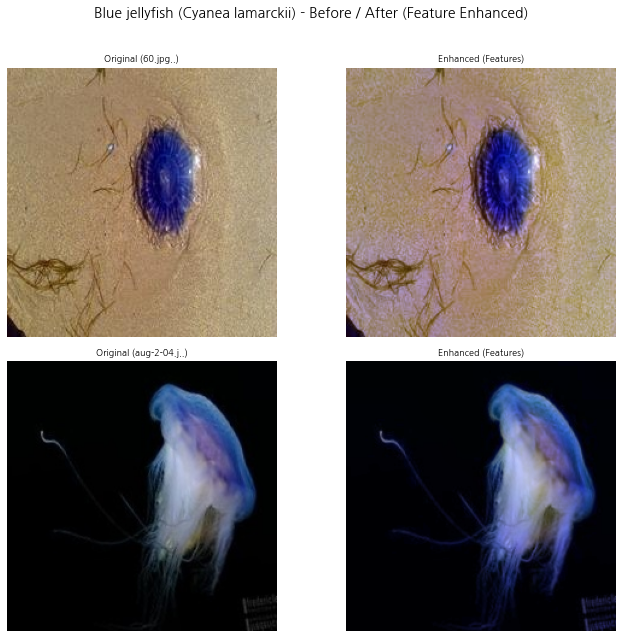


  처리 중인 클래스: compass_jellyfish (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train/compass_jellyfish)


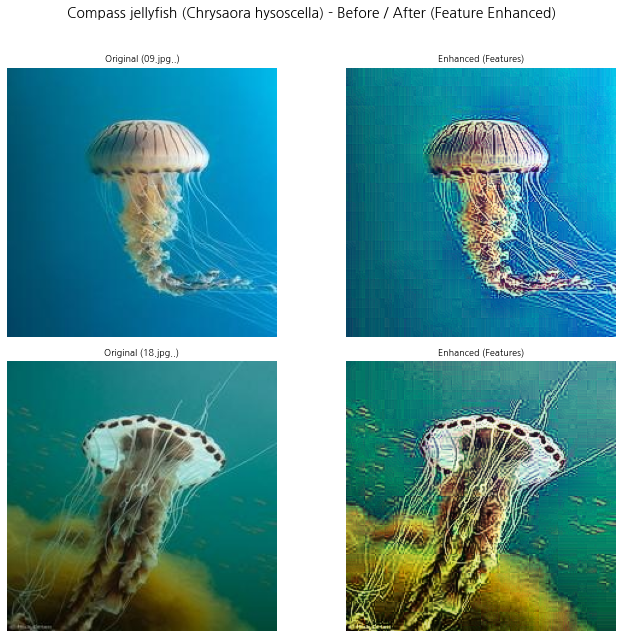


  처리 중인 클래스: lions_mane_jellyfish (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train/lions_mane_jellyfish)


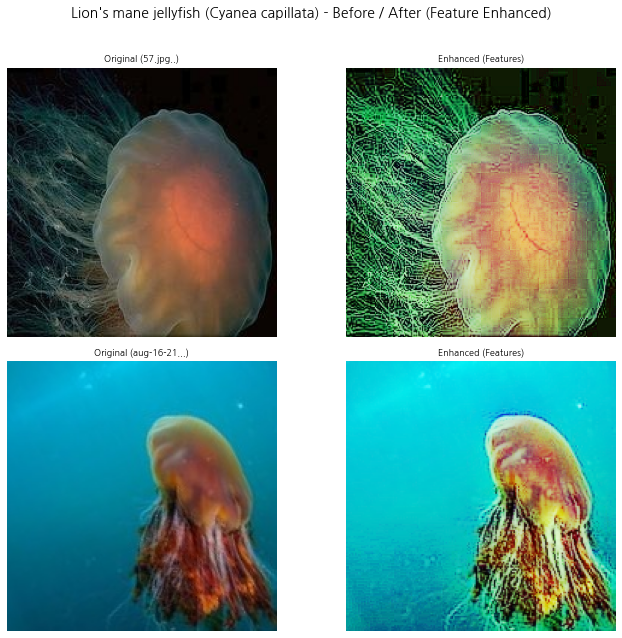


  처리 중인 클래스: mauve_stinger_jellyfish (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train/mauve_stinger_jellyfish)


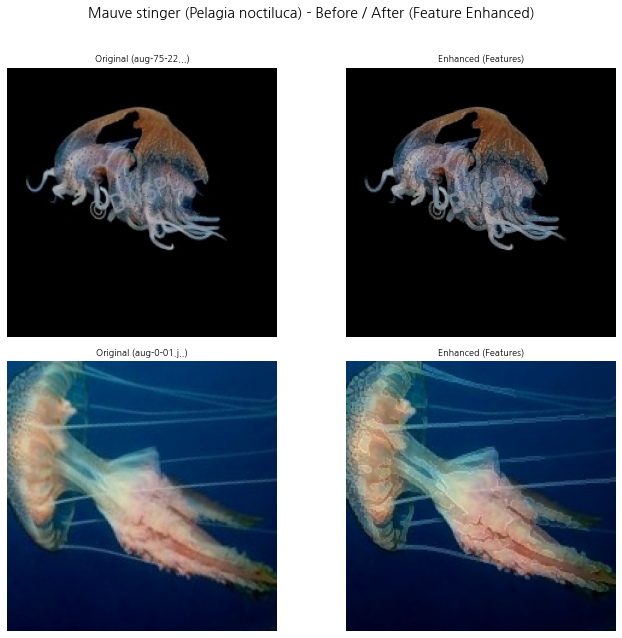


--- 클래스별 원본/증강 비교 시각화 끝 ---

[Cell C' 완료] 특성 강화 시각화 실행 완료 또는 건너<0xEB><0x9A><0xA5>.



In [24]:
# ======================================================
# Cell (C'): 특성 강화 시각화 함수 실행 예시
# ======================================================
print("--- Cell C' 시작: 특성 강화 시각화 실행 ---", flush=True)

# 필요한 변수들이 이전 셀에서 정의되었는지 확인
if 'train_dir' in locals() and 'class_names' in locals() and 'JellyfishFeaturesAugmentation' in locals():
    # 시각화를 위한 Augmenter 객체 생성 (Cell 2에서 정의된 클래스 사용)
    # p=1.0으로 설정하면 항상 증강된 결과를 볼 수 있음
    augmenter_for_vis = JellyfishFeaturesAugmentation(p=1.0)
    print("  시각화용 Augmenter 인스턴스 생성 완료 (p=1.0).", flush=True)

    # 시각화 함수 호출
    show_before_after_species_fixed(
        data_directory=train_dir,      # 학습 데이터 디렉토리 경로 (Cell 1 정의)
        class_names_list=class_names,  # 실제 클래스 이름 리스트 (Cell 3 정의)
        augmenter_instance=augmenter_for_vis, # 생성한 Augmenter 객체
        samples_per_class=2            # 클래스당 2개 샘플 표시
    )
else:
    print("오류: 시각화 예시를 실행하기 위한 변수('train_dir', 'class_names' 또는 'JellyfishFeaturesAugmentation' 클래스)가 정의되지 않았습니다.", flush=True)
    print("-> 이전 Cell 1, 2, 3을 먼저 실행해야 합니다.", flush=True)

print("\n[Cell C' 완료] 특성 강화 시각화 실행 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)

In [25]:
# 필요한 라이브러리 임포트 및 클래스 시작

import cv2
import numpy as np
import random
import matplotlib.pyplot as plt # 시각화 메소드에서 사용

print("--- JellyfishGeometricAugmentation 클래스 정의 시작 ---", flush=True)

class JellyfishGeometricAugmentation:
    """
    해파리 분류를 위한 기본 기하학적 변환 증강 전략
    방향성이 없는 해파리의 특성을 고려한 회전, 뒤집기, 이동 등 변환
    """

--- JellyfishGeometricAugmentation 클래스 정의 시작 ---


In [26]:
# __init__ (초기화) 메소드
def __init__(self, p=0.8):
        """
        매개변수:
            p: 증강이 적용될 확률
        """
        self.p = p
        # 사용 가능한 변환 목록 정의
        self.available_transformations = [
            'rotate', 'flip', 'shift', 'zoom', 'shear',
            'elastic', 'perspective', #'radial', # 성능 문제로 주석 처리 권장
            'crop_resize', 'random_resize'
        ]
        self.costly_transformations = ['elastic'] # 계산 비용 높은 변환 목록

In [27]:
# _ensure_uint8 (헬퍼) 메소드

def _ensure_uint8(self, image):
        """결과 이미지를 uint8 타입 및 0-255 범위로 안전하게 변환"""
        # 입력이 float일 경우 0-1 범위라고 가정하고 0-255로 변환 후 uint8 캐스팅 고려
        if image.dtype != np.uint8:
             # 입력이 0-1 범위 float일 때 처리
             if image.min() >= 0 and image.max() <= 1.0:
                  image = image * 255.0
        # 최종 클리핑 및 타입 변환
        return np.clip(image, 0, 255).astype(np.uint8)

In [28]:
# rotate 메소드

def rotate(self, image, angle_range=(-180, 180)):
        """ 이미지 회전 """
        result = image.copy()
        angle = random.uniform(angle_range[0], angle_range[1])
        h, w = result.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(rotated)

In [29]:
# flip 메소드

def flip(self, image, mode='random'):
        """ 이미지 뒤집기 """
        result = image.copy()
        if mode == 'random':
            mode_code = random.choice([0, 1, -1]) # 0: 수직, 1: 수평, -1: 양쪽
        elif mode == 'horizontal':
            mode_code = 1
        elif mode == 'vertical':
            mode_code = 0
        elif mode == 'both':
            mode_code = -1
        else:
            return self._ensure_uint8(result) # 변경 없음
        flipped = cv2.flip(result, mode_code)
        return self._ensure_uint8(flipped)

In [30]:
# shift 메소드

def shift(self, image, shift_range=(-0.15, 0.15)):
        """ 이미지 이동 """
        result = image.copy()
        h, w = result.shape[:2]
        tx = int(w * random.uniform(shift_range[0], shift_range[1]))
        ty = int(h * random.uniform(shift_range[0], shift_range[1]))
        M = np.float32([[1, 0, tx], [0, 1, ty]])
        shifted = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(shifted)

In [31]:
# zoom 메소드

def zoom(self, image, zoom_range=(0.8, 1.2)):
        """ 확대/축소 """
        result = image.copy()
        h, w = result.shape[:2]
        scale = random.uniform(zoom_range[0], zoom_range[1])
        center_x, center_y = w // 2, h // 2
        M = cv2.getRotationMatrix2D((center_x, center_y), 0, scale)
        interpolation = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_LINEAR
        zoomed = cv2.warpAffine(result, M, (w, h), flags=interpolation, borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(zoomed)

In [32]:
# shear 메소드

def shear(self, image, shear_range=(-0.15, 0.15)):
        """ 전단 변환 """
        result = image.copy()
        h, w = result.shape[:2]
        shear_factor = random.uniform(shear_range[0], shear_range[1])
        # X축 또는 Y축 방향으로 랜덤하게 전단 적용 및 중앙 기준 오프셋 적용
        if random.random() < 0.5: # X축 전단
             M = np.float32([[1, shear_factor, -shear_factor * h * 0.5], [0, 1, 0]])
        else: # Y축 전단
             M = np.float32([[1, 0, 0], [shear_factor, 1, -shear_factor * w * 0.5]])
        sheared = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(sheared)

In [33]:
# elastic_transform 메소드

def elastic_transform(self, image, alpha=50, sigma=5):
        """ 탄성 변환 - OpenCV remap 사용 """
        result = image.copy()
        height, width = result.shape[:2]
        random_state = np.random.RandomState(None)
        effective_alpha = alpha * random.uniform(0.7, 1.3)
        effective_sigma = sigma * random.uniform(0.7, 1.3)
        effective_sigma = max(1.0, effective_sigma) # sigma는 0보다 커야 함

        dx = (random_state.rand(height, width) * 2 - 1)
        dx = cv2.GaussianBlur(dx.astype(np.float32), (0, 0), effective_sigma) * effective_alpha
        dy = (random_state.rand(height, width) * 2 - 1)
        dy = cv2.GaussianBlur(dy.astype(np.float32), (0, 0), effective_sigma) * effective_alpha

        x, y = np.meshgrid(np.arange(width), np.arange(height))
        map_x = np.clip(x + dx, 0, width - 1).astype(np.float32)
        map_y = np.clip(y + dy, 0, height - 1).astype(np.float32)
        distorted = cv2.remap(result, map_x, map_y,
                              interpolation=cv2.INTER_LINEAR,
                              borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(distorted)

In [34]:
# perspective_transform 메소드

def elastic_transform(self, image, alpha=50, sigma=5):
        """ 탄성 변환 - OpenCV remap 사용 """
        result = image.copy()
        height, width = result.shape[:2]
        random_state = np.random.RandomState(None)
        effective_alpha = alpha * random.uniform(0.7, 1.3)
        effective_sigma = sigma * random.uniform(0.7, 1.3)
        effective_sigma = max(1.0, effective_sigma) # sigma는 0보다 커야 함

        dx = (random_state.rand(height, width) * 2 - 1)
        dx = cv2.GaussianBlur(dx.astype(np.float32), (0, 0), effective_sigma) * effective_alpha
        dy = (random_state.rand(height, width) * 2 - 1)
        dy = cv2.GaussianBlur(dy.astype(np.float32), (0, 0), effective_sigma) * effective_alpha

        x, y = np.meshgrid(np.arange(width), np.arange(height))
        map_x = np.clip(x + dx, 0, width - 1).astype(np.float32)
        map_y = np.clip(y + dy, 0, height - 1).astype(np.float32)
        distorted = cv2.remap(result, map_x, map_y,
                              interpolation=cv2.INTER_LINEAR,
                              borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(distorted)

In [35]:
# center_crop_and_resize 메소드

def center_crop_and_resize(self, image, crop_percent_range=(0.75, 0.95)):
        """ 중앙 크롭 및 리사이즈 """
        result = image.copy()
        crop_percent = random.uniform(crop_percent_range[0], crop_percent_range[1])
        h, w = result.shape[:2]
        crop_h, crop_w = int(h * crop_percent), int(w * crop_percent)
        if crop_h <= 0 or crop_w <=0 : return self._ensure_uint8(result)
        start_y = max(0, (h - crop_h) // 2)
        start_x = max(0, (w - crop_w) // 2)
        cropped = result[start_y : min(start_y + crop_h, h), start_x : min(start_x + crop_w, w)]
        interpolation = cv2.INTER_AREA if crop_percent > 1 else cv2.INTER_LINEAR
        # 크롭된 이미지가 비어있는 경우 처리
        if cropped.size == 0: return self._ensure_uint8(result)
        resized = cv2.resize(cropped, (w, h), interpolation=interpolation)
        return self._ensure_uint8(resized)

In [36]:
# random_resize 메소드

def random_resize(self, image, scale_range=(0.7, 1.3)):
        """ 랜덤 리사이즈 """
        result = image.copy()
        h, w = result.shape[:2]
        scale = random.uniform(scale_range[0], scale_range[1])
        new_h, new_w = int(h * scale), int(w * scale)
        if new_h <= 0 or new_w <= 0: return self._ensure_uint8(result)

        interpolation = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_LINEAR
        resized = cv2.resize(result, (new_w, new_h), interpolation=interpolation)

        if scale < 1.0:
            delta_h, delta_w = h - new_h, w - new_w
            top, bottom = delta_h // 2, delta_h - (delta_h // 2)
            left, right = delta_w // 2, delta_w - (delta_w // 2)
            final_result = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_REFLECT_101)
        elif scale > 1.0:
            delta_h, delta_w = new_h - h, new_w - w
            top, left = delta_h // 2, delta_w // 2
            final_result = resized[top:min(top + h, new_h), left:min(left + w, new_w)] # 범위 확인
        else:
            final_result = resized

        if final_result.shape[0] != h or final_result.shape[1] != w:
            final_result = cv2.resize(final_result, (w, h), interpolation=cv2.INTER_LINEAR)

        return self._ensure_uint8(final_result)

In [37]:
# apply 메소드

def apply(self, image, transformations=None, num_transforms_range=(1, 3)):
        """ 선택한 변환들을 이미지에 순차적으로 적용 """
        if not isinstance(image, np.ndarray): raise TypeError("Input image must be a NumPy array.")
        if image.dtype != np.uint8: image = self._ensure_uint8(image)
        result = image.copy()

        if random.random() > self.p: return result

        if transformations is None:
            possible_transforms = list(self.available_transformations)
            costly_selected = [t for t in self.costly_transformations if t in possible_transforms and random.random() < 0.2]
            standard_transforms = [t for t in possible_transforms if t not in self.costly_transformations]
            num_standard_to_select = max(0, random.randint(num_transforms_range[0], num_transforms_range[1]) - len(costly_selected))
            selected_standard = random.sample(standard_transforms, min(num_standard_to_select, len(standard_transforms)))
            transformations_to_apply = costly_selected + selected_standard
            random.shuffle(transformations_to_apply)
        else:
            transformations_to_apply = [t for t in transformations if t in self.available_transformations]

        if not transformations_to_apply: return result

        # print(f"  Applying Geo: {transformations_to_apply}") # 디버깅용

        for transform_name in transformations_to_apply:
            try:
                method = getattr(self, transform_name, None)
                if method and callable(method):
                     result = method(result)
                else:
                     print(f"  [Warning] Unknown geometric transformation requested: '{transform_name}'")
            except Exception as e:
                print(f"  [Error] Failed applying {transform_name}: {e}")

        return self._ensure_uint8(result)

In [38]:
# visualize_transformations 메소드

# --- 시각화 메소드 ---
    # (클래스 내 다른 메소드들과 동일한 들여쓰기 레벨로 시작해야 함)
def visualize_transformations(self, image, figsize=(15, 12)):
        """ 각 변환의 효과 시각화 (수정됨) """
        # 함수 내부 코드는 한 단계 더 들여쓰기
        if image is None:
            print("Cannot visualize transformations on None image.")
            return

        # 시각화할 변환 목록과 함수 매핑
        transformations_map = {
            "Original": lambda x: x,
            "Rotation": self.rotate,
            "Flip": self.flip,
            "Shift": self.shift,
            "Zoom": self.zoom,
            "Shear": self.shear,
            "Elastic": lambda x: self.elastic_transform(x),
            "Perspective": self.perspective_transform,
            "CenterCropResize": self.center_crop_and_resize,
            "RandomResize": self.random_resize,
            # "Radial": self.radial_distortion, # 필요시 추가
            "Combined": lambda x: self.apply(x, num_transforms_range=(2,4))
        }
        num_items = len(transformations_map)
        cols = 4
        rows = (num_items + cols - 1) // cols # 필요한 행 계산

        plt.figure(figsize=figsize)
        plt.suptitle("Geometric Transformation Examples", fontsize=16)

        # 각 변환 적용 및 시각화
        for i, (name, func) in enumerate(transformations_map.items()):
            # subplot 호출과 try 블록 분리 (들여쓰기 레벨 주의)
            plt.subplot(rows, cols, i + 1)
            try:
                # try 블록 내부 코드 (한 단계 더 들여쓰기)
                img_copy = self._ensure_uint8(image.copy()) # 원본 복사 및 타입 확인
                transformed = func(img_copy) # 변환 함수 적용
                plt.imshow(self._ensure_uint8(transformed)) # 결과 표시 및 타입 확인
                plt.title(name, fontsize=10)
            except Exception as e:
                # except 블록 (try와 같은 레벨)
                plt.text(0.5, 0.5, "Error", ha='center', va='center', fontsize=9)
                plt.title(f"{name}\n(Error)", fontsize=9)
                print(f"Error visualizing {name}: {e}")
            # try-except 블록 끝난 후 (for 루프와 같은 레벨)
            plt.axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # 제목 공간 확보
        plt.show()
        
# visualize_intensity 메소드

# (클래스 내 다른 메소드들과 동일한 들여쓰기 레벨로 시작해야 함)
def visualize_intensity(self, image, transform_type, param_name, values, figsize=(15, 8)):
        """ 특정 변환의 다양한 강도 시각화 (수정됨) """
        # 함수 내부 코드는 한 단계 더 들여쓰기
        if image is None:
            print("Cannot visualize intensity on None image.")
            return

        plt.figure(figsize=figsize)
        num_values = len(values)
        # subplot 레이아웃 계산
        cols = min(4, num_values + 1)
        rows = ((num_values + 1) + cols -1 ) // cols

        # 원본 이미지 표시
        plt.subplot(rows, cols, 1)
        plt.imshow(self._ensure_uint8(image))
        plt.title("Original", fontsize=10)
        plt.axis('off')

        # 각 강도 수준 적용 및 시각화
        for i, value in enumerate(values):
            # subplot 호출과 try 블록 분리 (들여쓰기 레벨 주의)
            plt.subplot(rows, cols, i + 2)
            transformed = None # 초기화
            try:
                # try 블록 내부 코드 (한 단계 더 들여쓰기)
                method = getattr(self, transform_type, None)
                if method and callable(method):
                    kwargs = {} # 파라미터 딕셔너리
                    # 파라미터 이름에 따라 kwargs 생성
                    if param_name == 'angle': kwargs = {'angle_range': (value, value)}
                    elif param_name == 'scale': kwargs = {'zoom_range': (value, value)}
                    elif param_name == 'intensity': kwargs = {'intensity': value} # perspective 용도
                    elif param_name == 'alpha' and transform_type == 'elastic': kwargs = {'alpha': value}
                    elif param_name == 'sigma' and transform_type == 'elastic': kwargs = {'sigma': value}
                    elif param_name == 'crop_percent': kwargs = {'crop_percent_range': (value, value)}
                    # radial 제외
                    else: kwargs = {param_name: value} # shift, shear 등 기본 파라미터

                    transformed = method(image.copy(), **kwargs) # 변환 적용
                    plt.imshow(self._ensure_uint8(transformed)) # 결과 표시
                    plt.title(f"{param_name}: {value:.2f}", fontsize=10)
                else:
                     raise ValueError(f"Unknown transform_type: {transform_type}")
            except Exception as e:
                # except 블록 (try와 같은 레벨)
                plt.text(0.5, 0.5, "Error", ha='center', va='center', fontsize=9)
                plt.title(f"{param_name}: {value:.2f} (Error)", fontsize=9)
                print(f"Error visualizing intensity {value} for {transform_type}: {e}")
            # try-except 블록 끝난 후 (for 루프와 같은 레벨)
            plt.axis('off')

        plt.suptitle(f"{transform_type.capitalize()} Transformation Intensity ({param_name})", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # 제목 공간 확보
        plt.show()

# 클래스 정의가 끝나는 부분에 맞춰 들여쓰기 없음
print("--- JellyfishGeometricAugmentation 클래스 내 시각화 메소드 수정 완료 ---", flush=True)
# print("\n[Cell B'' 완료] 기하학적 증강 클래스 정의 완료 (전체 메소드 포함).\n", flush=True) # Cell B'' 마지막 print

--- JellyfishGeometricAugmentation 클래스 내 시각화 메소드 수정 완료 ---


In [39]:
# ============================================================
# Cell C''-1: 기하학적 증강 시각화 헬퍼 함수 정의 및 임포트
# ============================================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import matplotlib.font_manager as fm # 폰트 설정 (Cell 1에서 이미 설정됨)

# --- 이전 셀들 실행 확인 ---
# 이 셀 실행 전에 Cell 1, Cell 3, Cell B'' 가 실행되어
# 필요한 변수(train_dir, class_names 등)와
# JellyfishGeometricAugmentation 클래스가 정의되어 있어야 합니다.
if 'plt' not in locals() or 'np' not in locals() or 'cv2' not in locals():
     print("오류: 필요한 라이브러리가 임포트되지 않았습니다. Cell 1을 실행하세요.", flush=True)
     # 필요시 여기서 중단

print("--- 시각화 헬퍼 함수 정의 시작 ---", flush=True)

def visualize_augmentation_grid(images_with_names, augmenter, n_samples=4, figsize=(15, 12)):
    """ 여러 이미지에 대한 증강 효과(랜덤 조합)를 그리드로 시각화 """
    n_images = len(images_with_names)
    if n_images == 0:
        print("  (visualize_augmentation_grid) 시각화할 이미지가 없습니다.", flush=True)
        return
    plt.figure(figsize=figsize)
    print(f"  Generating augmentation grid for {n_images} images...", flush=True)
    for i, (name, img) in enumerate(images_with_names):
        plt.subplot(n_images, n_samples + 1, i * (n_samples + 1) + 1)
        plt.imshow(augmenter._ensure_uint8(img))
        plt.title(f"Original: {name}", fontsize=9); plt.axis('off')
        for j in range(n_samples):
            plt.subplot(n_images, n_samples + 1, i * (n_samples + 1) + j + 2)
            try:
                augmented = augmenter.apply(img.copy()) # apply는 랜덤 조합 적용
                plt.imshow(augmenter._ensure_uint8(augmented))
                plt.title(f"Aug #{j+1}", fontsize=9)
            except Exception as e:
                plt.text(0.5, 0.5, "Error", ha='center', va='center')
                plt.title(f"Aug #{j+1} (Error)", fontsize=9)
                print(f"  Error generating augmented sample {j+1} for {name}: {e}", flush=True)
            plt.axis('off')
    plt.tight_layout(); plt.show()
    print(f"  Augmentation grid generated.", flush=True)

def visualize_before_after(images_with_names, augmenter, figsize=(10, 8)):
    """ 원본 이미지와 증강된 이미지를 나란히 비교 시각화 """
    n_images = len(images_with_names)
    if n_images == 0:
        print("  (visualize_before_after) 시각화할 이미지가 없습니다.", flush=True)
        return
    plt.figure(figsize=(figsize[0], figsize[1] * n_images / 3)) # 높이 조절
    print(f"  Generating before/after comparison for {n_images} images...", flush=True)
    for i, (name, img) in enumerate(images_with_names):
        plt.subplot(n_images, 2, 2*i + 1)
        plt.imshow(augmenter._ensure_uint8(img))
        plt.title(f"Original: {name}", fontsize=9); plt.axis('off')
        plt.subplot(n_images, 2, 2*i + 2)
        try:
            augmented = augmenter.apply(img.copy()) # 랜덤 조합 적용
            plt.imshow(augmenter._ensure_uint8(augmented))
            plt.title("Augmented", fontsize=9)
        except Exception as e:
            plt.text(0.5, 0.5, "Error", ha='center', va='center')
            plt.title("Augmented (Error)", fontsize=9)
            print(f"  Error generating before/after augmented sample for {name}: {e}", flush=True)
        plt.axis('off')
    plt.tight_layout(); plt.show()
    print(f"  Before/after comparison generated.", flush=True)

print("--- 시각화 헬퍼 함수 정의 완료 ---", flush=True)
print("\n[Cell C''-1 완료] 시각화 헬퍼 함수 정의 완료.\n", flush=True)

--- 시각화 헬퍼 함수 정의 시작 ---
--- 시각화 헬퍼 함수 정의 완료 ---

[Cell C''-1 완료] 시각화 헬퍼 함수 정의 완료.



In [50]:
# ============================================================
# 결합된 Cell B''+C''-2 (오류 최종 수정 버전): 클래스 정의 + 객체 생성 + 샘플 로드 + 확인
# ============================================================
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
import os
import tensorflow as tf

print("--- 최종 진단 셀 시작: 클래스 정의, 객체 생성, 샘플 로드, 변수 확인 ---", flush=True)

geometric_augmenter = None
sample_images_geom = []
combined_cell_success = False

try:
    # --- JellyfishGeometricAugmentation 클래스 정의 (모든 오류 최종 수정본) ---
    print("  Defining JellyfishGeometricAugmentation class (FINAL REVISION)...", flush=True)
    class JellyfishGeometricAugmentation:
        """ 해파리 분류를 위한 기본 기하학적 변환 증강 전략 """
        def __init__(self, p=0.8):
            self.p = p
            # 사용 가능한 변환 목록 ('crop_resize' -> 'center_crop_and_resize' 로 수정됨)
            self.available_transformations = [
                'rotate', 'flip', 'shift', 'zoom', 'shear','elastic',
                'perspective','center_crop_and_resize',
                'random_resize'
            ]
            self.costly_transformations = ['elastic']

        def _ensure_uint8(self, image):
            """ 결과를 uint8 타입 및 0-255 범위로 안전하게 변환 """
            if image is None: return None;
            if image.dtype != np.uint8:
                 if image.min() >= 0 and image.max() <= 1.0 + 1e-6 : image = image * 255.0
            return np.clip(image, 0, 255).astype(np.uint8)

        # --- 모든 기하학적 변환 메소드 정의 (최종 수정본) ---
        def rotate(self, image, angle_range=(-180, 180)):
            """ 이미지 회전 """
            result = image.copy()
            angle = random.uniform(angle_range[0], angle_range[1])
            h, w = result.shape[:2]
            center = (w // 2, h // 2)
            M = cv2.getRotationMatrix2D(center, angle, 1.0)
            rotated = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
            return self._ensure_uint8(rotated)

        def flip(self, image, mode='random'):
            """ 이미지 뒤집기 (최종 수정) """
            result = image.copy()
            mode_code = -2

            if mode == 'random':
                mode_code = random.choice([0, 1, -1])
            elif mode == 'horizontal':
                mode_code = 1
            elif mode == 'vertical':
                mode_code = 0
            elif mode == 'both':
                mode_code = -1
            else:
                return self._ensure_uint8(result)

            if mode_code != -2:
                flipped = cv2.flip(result, mode_code)
                return self._ensure_uint8(flipped)
            else:
                return self._ensure_uint8(result)

        def shift(self, image, shift_range=(-0.15, 0.15)):
            """ 이미지 이동 """
            result = image.copy()
            h, w = result.shape[:2]
            tx = int(w * random.uniform(shift_range[0], shift_range[1]))
            ty = int(h * random.uniform(shift_range[0], shift_range[1]))
            M = np.float32([[1, 0, tx], [0, 1, ty]])
            shifted = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
            return self._ensure_uint8(shifted)

        def zoom(self, image, zoom_range=(0.8, 1.2)):
            """ 확대/축소 """
            result = image.copy()
            h, w = result.shape[:2]
            scale = random.uniform(zoom_range[0], zoom_range[1])
            center_x, center_y = w // 2, h // 2
            M = cv2.getRotationMatrix2D((center_x, center_y), 0, scale)
            interpolation = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_LINEAR
            zoomed = cv2.warpAffine(result, M, (w, h), flags=interpolation, borderMode=cv2.BORDER_REFLECT_101)
            return self._ensure_uint8(zoomed)

        def shear(self, image, shear_range=(-0.15, 0.15)):
            """ 전단 변환 """
            result = image.copy()
            h, w = result.shape[:2]
            shear_factor = random.uniform(shear_range[0], shear_range[1])
            if random.random() < 0.5: # X축 전단
                 M = np.float32([[1, shear_factor, -shear_factor * h * 0.5], [0, 1, 0]])
            else: # Y축 전단
                 M = np.float32([[1, 0, 0], [shear_factor, 1, -shear_factor * w * 0.5]])
            sheared = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
            return self._ensure_uint8(sheared)

        def elastic_transform(self, image, alpha=50, sigma=5):
            """ 탄성 변환 """
            result = image.copy()
            height, width = result.shape[:2]
            random_state = np.random.RandomState(None)
            effective_alpha = alpha * random.uniform(0.7, 1.3); effective_sigma = max(1.0, sigma * random.uniform(0.7, 1.3));
            dx = (random_state.rand(height, width) * 2 - 1); dx = cv2.GaussianBlur(dx.astype(np.float32), (0, 0), effective_sigma) * effective_alpha;
            dy = (random_state.rand(height, width) * 2 - 1); dy = cv2.GaussianBlur(dy.astype(np.float32), (0, 0), effective_sigma) * effective_alpha;
            x, y = np.meshgrid(np.arange(width), np.arange(height));
            map_x = np.clip(x + dx, 0, width - 1).astype(np.float32); map_y = np.clip(y + dy, 0, height - 1).astype(np.float32);
            distorted = cv2.remap(result, map_x, map_y, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101);
            return self._ensure_uint8(distorted)

        def perspective_transform(self, image, intensity=0.15):
            """ 원근 변환 """
            result = image.copy(); h, w = result.shape[:2]; pts1 = np.float32([[0, 0], [w - 1, 0], [0, h - 1], [w - 1, h - 1]]); max_shift_w = w * intensity; max_shift_h = h * intensity;
            pts2 = np.float32([[random.uniform(-max_shift_w, max_shift_w), random.uniform(-max_shift_h, max_shift_h)], [w - 1 + random.uniform(-max_shift_w, max_shift_w), random.uniform(-max_shift_h, max_shift_h)], [random.uniform(-max_shift_w, max_shift_w), h - 1 + random.uniform(-max_shift_h, max_shift_h)], [w - 1 + random.uniform(-max_shift_w, max_shift_w), h - 1 + random.uniform(-max_shift_h, max_shift_h)]]);
            pts2[:,0] = np.clip(pts2[:,0], 0, w-1); pts2[:,1] = np.clip(pts2[:,1], 0, h-1); warped = result;
            try:
                 M = cv2.getPerspectiveTransform(pts1, pts2)
                 warped = cv2.warpPerspective(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
            except cv2.error as e:
                 print(f"  [Warning] Perspective transform failed: {e}. Using original.")
                 pass
            return self._ensure_uint8(warped)

        def center_crop_and_resize(self, image, crop_percent_range=(0.75, 0.95)):
            """ 중앙 크롭 및 리사이즈 """
            result = image.copy(); crop_percent = random.uniform(crop_percent_range[0], crop_percent_range[1]); h, w = result.shape[:2]; crop_h, crop_w = int(h * crop_percent), int(w * crop_percent);
            if crop_h <= 0 or crop_w <=0 :
                return self._ensure_uint8(result)
            start_y = max(0, (h - crop_h) // 2); start_x = max(0, (w - crop_w) // 2); cropped = result[start_y : min(start_y + crop_h, h), start_x : min(start_x + crop_w, w)];
            if cropped.size == 0:
                 return self._ensure_uint8(result)
            interpolation = cv2.INTER_AREA if crop_percent > 1 else cv2.INTER_LINEAR; resized = cv2.resize(cropped, (w, h), interpolation=interpolation); return self._ensure_uint8(resized)

        def random_resize(self, image, scale_range=(0.7, 1.3)):
            """ 랜덤 리사이즈 (수정됨) """
            original_image = image.copy(); h, w = original_image.shape[:2]; scale = random.uniform(scale_range[0], scale_range[1]); new_h, new_w = int(h * scale), int(w * scale);
            if new_h <= 0 or new_w <= 0:
                return self._ensure_uint8(original_image)
            interpolation = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_LINEAR; resized = cv2.resize(original_image, (new_w, new_h), interpolation=interpolation); final_result = None;
            if scale < 1.0:
                delta_h, delta_w = h - new_h, w - new_w; top, bottom = delta_h // 2, delta_h - (delta_h // 2); left, right = delta_w // 2, delta_w - (delta_w // 2); final_result = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_REFLECT_101);
            elif scale > 1.0:
                delta_h, delta_w = new_h - h, new_w - w; top, left = delta_h // 2, delta_w // 2; final_result = resized[top:min(top + h, new_h), left:min(left + w, new_w)];
            else:
                final_result = resized;
            if final_result is not None and (final_result.shape[0] != h or final_result.shape[1] != w):
                final_result = cv2.resize(final_result, (w, h), interpolation=cv2.INTER_LINEAR);
            elif final_result is None:
                 final_result = original_image;
            return self._ensure_uint8(final_result)

        # apply 메소드 (SyntaxError 최종 수정됨)
        def apply(self, image, transformations=None, num_transforms_range=(1, 3)):
            """ 선택한 변환들을 이미지에 순차적으로 적용 """
            if not isinstance(image, np.ndarray): raise TypeError("Input image must be a NumPy array.");
            result = self._ensure_uint8(image.copy()); # 원본 복사 및 타입 확인

            if random.random() > self.p:
                 return result; # 확률에 따라 적용 안 함

            if transformations is None:
                possible_transforms = list(self.available_transformations); costly_selected = [t for t in self.costly_transformations if t in possible_transforms and random.random() < 0.2]; standard_transforms = [t for t in possible_transforms if t not in self.costly_transformations]; num_standard_to_select = max(0, random.randint(num_transforms_range[0], num_transforms_range[1]) - len(costly_selected)); selected_standard = random.sample(standard_transforms, min(num_standard_to_select, len(standard_transforms))); transformations_to_apply = costly_selected + selected_standard; random.shuffle(transformations_to_apply);
            else:
                transformations_to_apply = [t for t in transformations if t in self.available_transformations];

            if not transformations_to_apply:
                 return result; # 적용할 변환 없으면 원본 반환

            for transform_name in transformations_to_apply:
                try: # try 시작
                    method = getattr(self, transform_name, None);
                    if method and callable(method): # if 시작
                         # if 블록 내용
                         result = method(result);
                    else: # else 시작
                         # else 블록 내용
                         print(f"  [Warning] Unknown geometric transformation requested: '{transform_name}'")
                except Exception as e: # except 시작
                    # except 블록 내용
                    print(f"  [Error] Failed applying {transform_name}: {e}");
            # for 루프 끝
            return self._ensure_uint8(result) # 최종 결과 타입 보장

        # --- 시각화 메소드 (오류 최종 수정됨) ---
        def visualize_transformations(self, image, figsize=(15, 12)):
            """ 각 변환의 효과 시각화 """
            if image is None:
                print("Cannot visualize transformations on None image.")
                return
            # ★★★ transformations_map 정의 ★★★
            transformations_map = {"Original": lambda x: x,"Rotation": self.rotate,"Flip": self.flip,"Shift": self.shift,"Zoom": self.zoom,"Shear": self.shear,"Elastic": lambda x: self.elastic_transform(x),"Perspective": self.perspective_transform,"CenterCropResize": self.center_crop_and_resize,"RandomResize": self.random_resize,"Combined": lambda x: self.apply(x, num_transforms_range=(2,4))}
            num_items = len(transformations_map); cols = 4;
            rows = (num_items + cols - 1) // cols; # rows 정의
            plt.figure(figsize=figsize); plt.suptitle("Geometric Transformation Examples", fontsize=16);
            for i, (name, func) in enumerate(transformations_map.items()):
                plt.subplot(rows, cols, i + 1) # 분리된 라인
                try: # 분리된 라인
                    img_copy = self._ensure_uint8(image.copy()); transformed = func(img_copy); plt.imshow(self._ensure_uint8(transformed)); plt.title(name, fontsize=10);
                except Exception as e: # 분리된 라인
                    plt.text(0.5, 0.5, "Error", ha='center', va='center'); plt.title(f"{name}\n(Error)", fontsize=9); print(f"Error visualizing {name}: {e}");
                # try-except 블록 끝난 후
                plt.axis('off');
            # for 루프 끝난 후
            plt.tight_layout(rect=[0, 0.03, 1, 0.95]); plt.show()

        def visualize_intensity(self, image, transform_type, param_name, values, figsize=(15, 8)):
            """ 특정 변환의 다양한 강도 시각화 """
            if image is None:
                 print("Cannot visualize intensity on None image.")
                 return
            plt.figure(figsize=figsize);
            # ★★★ num_values 정의 ★★★
            num_values = len(values);
            cols = min(4, num_values + 1);
            rows = ((num_values + 1) + cols -1 ) // cols; # rows 정의 확인
            plt.subplot(rows, cols, 1); plt.imshow(self._ensure_uint8(image)); plt.title("Original", fontsize=10); plt.axis('off');
            for i, value in enumerate(values):
                plt.subplot(rows, cols, i + 2) # 분리된 라인
                transformed = None
                try: # 분리된 라인
                    method = getattr(self, transform_type, None);
                    if method and callable(method): # if 시작
                        kwargs = {};
                        if param_name == 'angle': kwargs = {'angle_range': (value, value)}
                        elif param_name == 'scale': kwargs = {'zoom_range': (value, value)}
                        elif param_name == 'intensity': kwargs = {'intensity': value}
                        elif param_name == 'alpha' and transform_type == 'elastic': kwargs = {'alpha': value}
                        elif param_name == 'sigma' and transform_type == 'elastic': kwargs = {'sigma': value}
                        elif param_name == 'crop_percent': kwargs = {'crop_percent_range': (value, value)}
                        else: kwargs = {param_name: value};
                        transformed = method(image.copy(), **kwargs); plt.imshow(self._ensure_uint8(transformed)); plt.title(f"{param_name}: {value:.2f}", fontsize=10);
                    else: # else 시작
                         raise ValueError(f"Unknown transform_type: {transform_type}");
                except Exception as e: # except 시작
                    plt.text(0.5, 0.5, "Error", ha='center', va='center'); plt.title(f"{param_name}: {value:.2f} (Error)", fontsize=9); print(f"Error visualizing intensity {value} for {transform_type}: {e}");
                # try-except 블록 끝난 후
                plt.axis('off');
            # for 루프 끝난 후
            plt.suptitle(f"{transform_type.capitalize()} Transformation Intensity ({param_name})", fontsize=16); plt.tight_layout(rect=[0, 0.03, 1, 0.95]); plt.show()

    print("--- JellyfishGeometricAugmentation 클래스 정의 완료 (모든 오류 최종 수정 완료) ---", flush=True)

    # --- 객체 생성 및 샘플 이미지 로드 ---
    print("\n--- Augmenter 생성 및 샘플 이미지 로드 시작 ---", flush=True)
    if 'class_names' in globals() and 'train_dir' in globals() and class_names:
        try:
            geometric_augmenter = JellyfishGeometricAugmentation(p=1.0)
            print("  Geometric Augmenter 인스턴스 생성 성공 (p=1.0).", flush=True)
            num_samples_per_class_vis = 1 # 샘플 로드 수
            print(f"  샘플 이미지 로드 시작 (클래스당 {num_samples_per_class_vis}개)...", flush=True); print(f"  (소스 디렉토리: {train_dir})", flush=True)
            for class_name in class_names:
                class_dir_path = os.path.join(train_dir, class_name);
                if not os.path.isdir(class_dir_path): continue
                try:
                    files = [f for f in os.listdir(class_dir_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                    if files:
                        selected_files = random.sample(files, min(len(files), num_samples_per_class_vis))
                        for fname in selected_files:
                            image_path = os.path.join(class_dir_path, fname); img_bytes = np.fromfile(image_path, np.uint8); image = cv2.imdecode(img_bytes, cv2.IMREAD_COLOR);
                            if image is not None: image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB); sample_images_geom.append((class_name, image_rgb)); print(f"    - {class_name} 샘플 로드됨: {fname}", flush=True)
                            else: print(f"    - 경고: 이미지 로드 실패 - {image_path}", flush=True)
                except Exception as e: print(f"    - '{class_dir_path}' 로딩 중 오류: {e}", flush=True)
            if not sample_images_geom: print("\n  오류: 시각화를 위한 샘플 이미지를 로드하지 못했습니다!", flush=True)
            else: print(f"\n  총 {len(sample_images_geom)}개의 샘플 이미지 로드 완료.", flush=True); combined_cell_success = True
        except Exception as e: print(f"★★★ 이 셀 실행 중 오류 발생 (객체 생성 또는 샘플 로딩): {e}", flush=True); geometric_augmenter = None; sample_images_geom = [];
    else: print("오류: 샘플 로드에 필요한 변수(class_names, train_dir) 없음.", flush=True)

    # --- 최종 진단 출력 ---
    print("\n  --- 즉시 변수 상태 확인 ---", flush=True)
    augmenter_ok_diag = False; samples_ok_diag = False
    if 'geometric_augmenter' in globals() and globals()['geometric_augmenter'] is not None: print("    'geometric_augmenter': 존재하고 None 아님", flush=True); augmenter_ok_diag = True
    else: print("    'geometric_augmenter': ★★★ 존재하지 않거나 None임! ★★★", flush=True)
    if 'sample_images_geom' in globals() and isinstance(globals()['sample_images_geom'], list) and globals()['sample_images_geom']: print(f"    'sample_images_geom': 존재하고 비어있지 않음 (길이: {len(globals()['sample_images_geom'])})", flush=True); samples_ok_diag = True
    else: print("    'sample_images_geom': ★★★ 존재하지 않거나, 리스트가 아니거나, 비어있음! ★★★", flush=True)
    print("-" * 30, flush=True)
    if augmenter_ok_diag and samples_ok_diag: print("    [진단 결과] 이 셀 내에서 변수가 성공적으로 생성/로드 되었습니다."); print("    -> 다음 셀 (C''-3 등 시각화) 실행을 시도하세요.")
    else: print("    [진단 결과] 이 셀 실행 중 변수 생성/로드에 문제가 발생했습니다."); print("    -> 위쪽의 오류 메시지를 확인하세요.")

except Exception as e_outer: print(f"★★★ 셀 실행 중 심각한 오류 발생: {e_outer}", flush=True)

print("\n[결합된 Cell B''+C''-2 완료]\n", flush=True)
# --- 이후 Cell C''-3, C''-4 등 시각화 셀 실행 ---

--- 최종 진단 셀 시작: 클래스 정의, 객체 생성, 샘플 로드, 변수 확인 ---
  Defining JellyfishGeometricAugmentation class (FINAL REVISION)...
--- JellyfishGeometricAugmentation 클래스 정의 완료 (모든 오류 최종 수정 완료) ---

--- Augmenter 생성 및 샘플 이미지 로드 시작 ---
  Geometric Augmenter 인스턴스 생성 성공 (p=1.0).
  샘플 이미지 로드 시작 (클래스당 1개)...
  (소스 디렉토리: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train)
    - Moon_jellyfish 샘플 로드됨: aug-34-46.jpg
    - barrel_jellyfish 샘플 로드됨: aug-74-40.jpg
    - blue_jellyfish 샘플 로드됨: aug-78-36.jpg
    - compass_jellyfish 샘플 로드됨: 22.JPG
    - lions_mane_jellyfish 샘플 로드됨: aug-71-11.jpg
    - mauve_stinger_jellyfish 샘플 로드됨: aug-79-28.jpg

  총 6개의 샘플 이미지 로드 완료.

  --- 즉시 변수 상태 확인 ---
    'geometric_augmenter': 존재하고 None 아님
    'sample_images_geom': 존재하고 비어있지 않음 (길이: 6)
------------------------------
    [진단 결과] 이 셀 내에서 변수가 성공적으로 생성/로드 되었습니다.
    -> 다음 셀 (C''-3 등 시각화) 실행을 시도하세요.

[결합된 Cell B''+C''-2 완료]



--- Cell C''-3 시작: 내장 시각화 메소드 실행 ---
  시각화에 사용할 샘플: Moon_jellyfish

  [시각화 1] 단일 변환 효과 보기 호출 중...
  [Warning] Unknown geometric transformation requested: 'perspective'


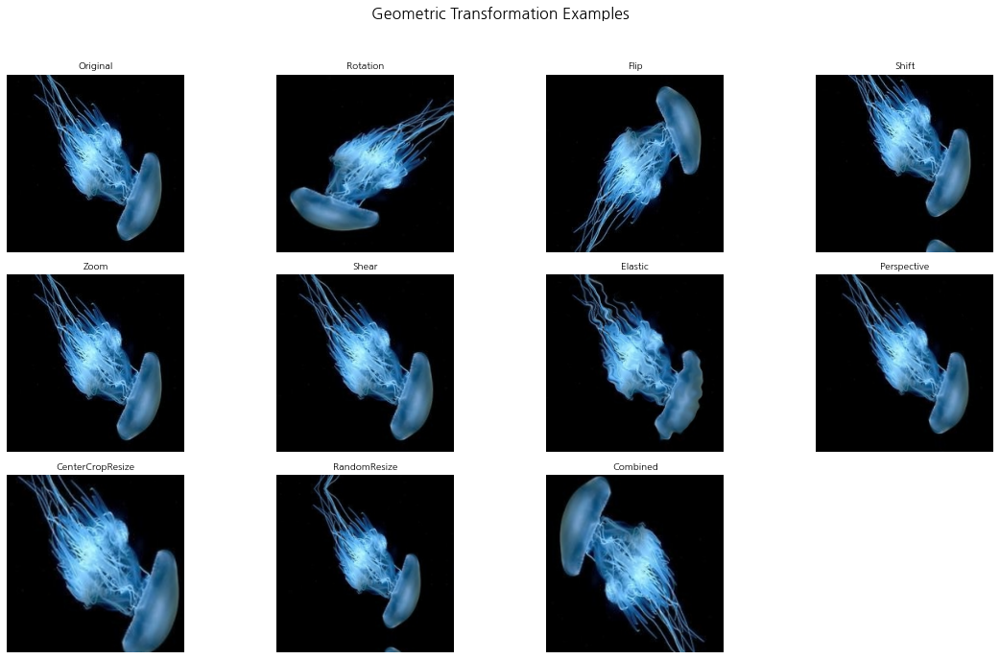


  [시각화 2] 특정 변환 강도별 효과 보기 호출 중...
    - 회전(rotate) 강도별 시각화...


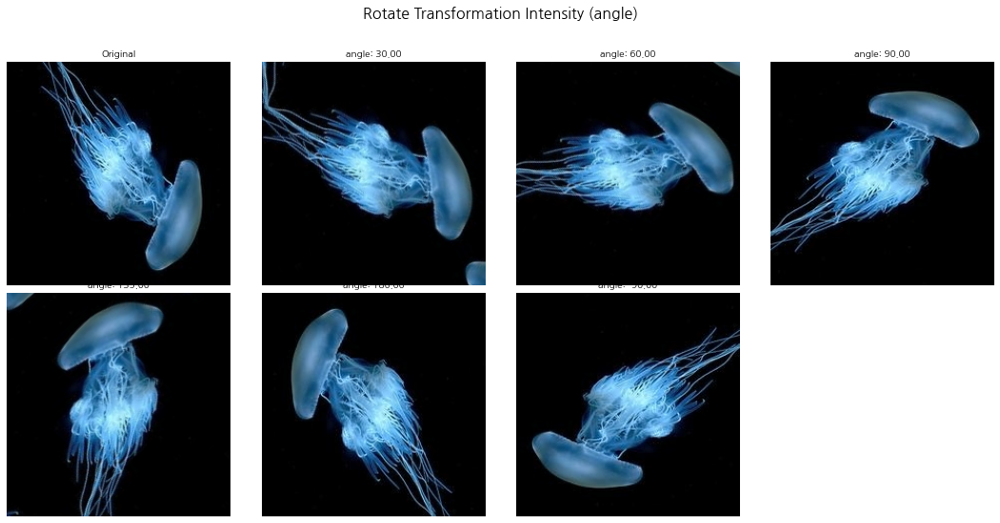

    - 확대/축소(zoom) 강도별 시각화...


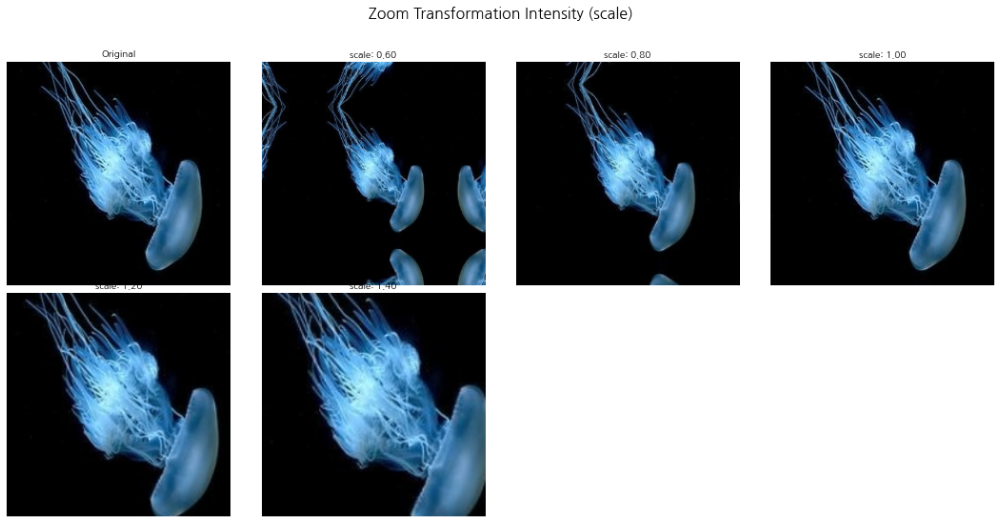


[Cell C''-3 완료] 내장 시각화 메소드 실행 완료 또는 실패.



In [51]:
# =======================================================================
# Cell C''-3: 클래스 내장 시각화 메소드 실행 (개별 변환 및 강도별 효과)
# =======================================================================
print("--- Cell C''-3 시작: 내장 시각화 메소드 실행 ---", flush=True)

# 이전 셀에서 sample_images_geom 와 geometric_augmenter가 생성되었는지 확인
if 'sample_images_geom' in locals() and sample_images_geom and 'geometric_augmenter' in locals():
    try:
        # 첫 번째 로드된 샘플 이미지 사용
        first_sample_name, first_sample_img = sample_images_geom[0]
        print(f"  시각화에 사용할 샘플: {first_sample_name}", flush=True)

        # 1. 모든 단일 증강 기법 시각화
        print("\n  [시각화 1] 단일 변환 효과 보기 호출 중...", flush=True)
        geometric_augmenter.visualize_transformations(first_sample_img, figsize=(16, 10))

        # 2. 특정 증강 강도별 효과 시각화
        print("\n  [시각화 2] 특정 변환 강도별 효과 보기 호출 중...", flush=True)
        # 회전 강도
        print("    - 회전(rotate) 강도별 시각화...", flush=True)
        geometric_augmenter.visualize_intensity(first_sample_img, 'rotate', 'angle', [30, 60, 90, 135, 180, -90], figsize=(15, 8))
        # 줌 강도
        print("    - 확대/축소(zoom) 강도별 시각화...", flush=True)
        geometric_augmenter.visualize_intensity(first_sample_img, 'zoom', 'scale', [0.6, 0.8, 1.0, 1.2, 1.4], figsize=(15, 8))
        # 탄성 변환 강도 (alpha) - 필요시 주석 해제
        # print("    - 탄성 변환(elastic) 강도별 시각화 (alpha)...", flush=True)
        # geometric_augmenter.visualize_intensity(first_sample_img, 'elastic', 'alpha', [20, 40, 60, 80], figsize=(15, 5))

    except Exception as e:
        print(f"  내장 시각화 메소드 실행 중 오류 발생: {e}", flush=True)
else:
    print("오류: 내장 시각화를 실행하기 위한 샘플 이미지 또는 Augmenter 객체가 준비되지 않았습니다.", flush=True)
    print("-> 이전 Cell C''-2 실행 결과를 확인하세요.", flush=True)

print("\n[Cell C''-3 완료] 내장 시각화 메소드 실행 완료 또는 실패.\n", flush=True)

--- Cell C''-4 시작: 특정 변환 강도별 시각화 ---
  시각화 대상: 첫 번째 샘플 이미지 (Moon_jellyfish)

  [시각화 2a] 회전(Rotate) 강도(angle)별 효과:


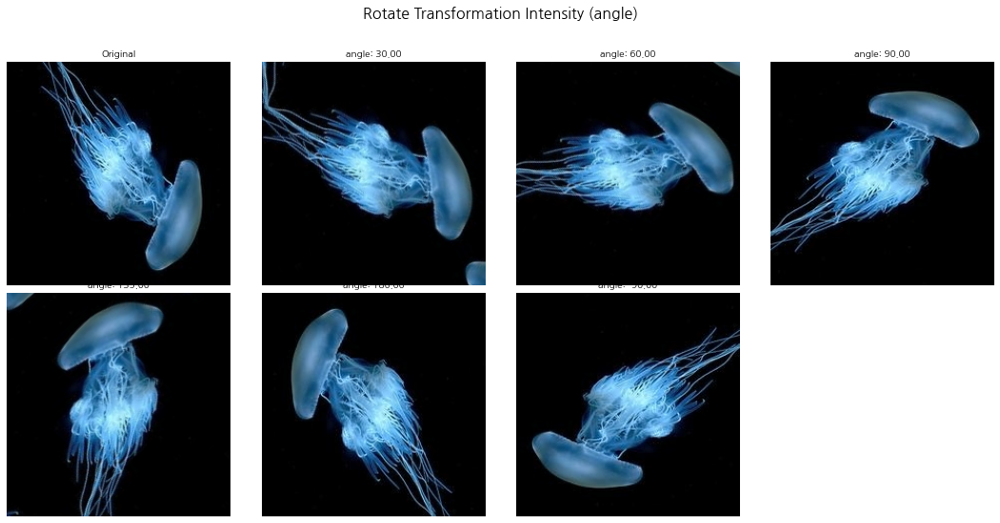


  [시각화 2b] 확대/축소(Zoom) 강도(scale)별 효과:


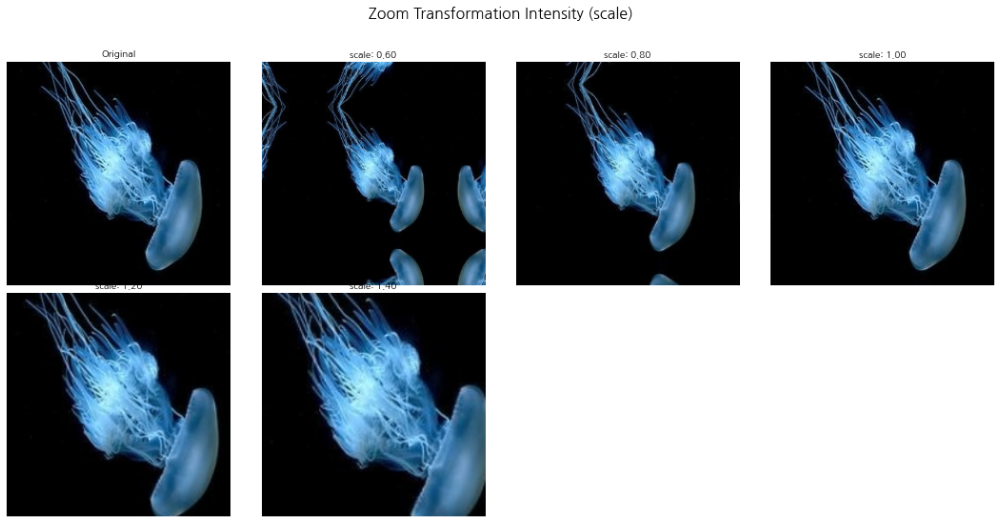


[Cell C''-4 완료] 특정 변환 강도별 시각화 완료 또는 건너<0xEB><0x9A><0xA5>.



In [52]:
# ============================================================
# Cell C''-4: 특정 변환 강도별 효과 시각화 실행
# ============================================================
# 이 셀은 "결합된 Cell B''+C''-2"가 성공적으로 실행되어
# geometric_augmenter 와 sample_images_geom 변수가 생성된 후에 실행합니다.
# ============================================================

print("--- Cell C''-4 시작: 특정 변환 강도별 시각화 ---", flush=True)

# 샘플 이미지와 Augmenter 객체가 준비되었는지 확인
if 'sample_images_geom' in locals() and sample_images_geom and \
   'geometric_augmenter' in locals() and geometric_augmenter is not None:

    # 첫 번째 로드된 샘플 이미지 사용
    # sample_images_geom 리스트는 (클래스명, 이미지_데이터) 튜플로 구성됨
    first_sample_name, first_sample_img = sample_images_geom[0]
    print(f"  시각화 대상: 첫 번째 샘플 이미지 ({first_sample_name})", flush=True)

    # 1. 회전 강도 시각화
    print("\n  [시각화 2a] 회전(Rotate) 강도(angle)별 효과:", flush=True)
    try:
        geometric_augmenter.visualize_intensity(
            first_sample_img,
            transform_type='rotate',      # 적용할 변환 타입
            param_name='angle',           # 변경할 파라미터 이름
            values=[30, 60, 90, 135, 180, -90], # 시도해볼 각도 값들
            figsize=(15, 8)              # 그래프 크기
        )
    except Exception as e:
        print(f"    회전 강도 시각화 오류: {e}", flush=True)

    # 2. 줌 강도 시각화
    print("\n  [시각화 2b] 확대/축소(Zoom) 강도(scale)별 효과:", flush=True)
    try:
        geometric_augmenter.visualize_intensity(
            first_sample_img,
            transform_type='zoom',        # 적용할 변환 타입
            param_name='scale',           # 변경할 파라미터 이름
            values=[0.6, 0.8, 1.0, 1.2, 1.4], # 시도해볼 스케일 값들
            figsize=(15, 8)              # 그래프 크기
        )
    except Exception as e:
        print(f"    줌 강도 시각화 오류: {e}", flush=True)

    # 3. 탄성 변환 강도 시각화 (선택적, 시간이 걸릴 수 있음)
    # print("\n  [시각화 2c] 탄성(Elastic) 변환 강도(alpha)별 효과:", flush=True)
    # try:
    #    geometric_augmenter.visualize_intensity(
    #        first_sample_img,
    #        transform_type='elastic',     # 적용할 변환 타입
    #        param_name='alpha',         # 변경할 파라미터 이름
    #        values=[20, 40, 60, 80],    # 시도해볼 alpha 값들
    #        figsize=(12, 5)             # 그래프 크기
    #    )
    # except Exception as e:
    #    print(f"    탄성 변환 강도 시각화 오류: {e}", flush=True)

else:
    print("  오류: 시각화할 샘플 이미지 또는 Augmenter 객체가 없습니다. 이전 셀 실행 결과를 확인하세요.", flush=True)

print("\n[Cell C''-4 완료] 특정 변환 강도별 시각화 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)

In [53]:
# =====================================================
# Cell 1: 기본 설정 및 라이브러리 임포트
# =====================================================
import tensorflow as tf
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
import tensorflow_hub as hub # ★★★ TF Hub 추가 ★★★
from tensorflow.keras.applications import MobileNetV2 # 이전 코드 호환성 위해 유지 가능
# ★★★ EfficientNet 전용 전처리 함수 임포트 ★★★
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical # 라벨 원-핫 인코딩용
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau # 콜백 추가
import matplotlib.font_manager as fm
import datetime

print(f"--- 스크립트 시작: {datetime.datetime.now()} ---", flush=True)
print(f"TensorFlow 버전: {tf.__version__}", flush=True)
print(f"NumPy 버전: {np.__version__}", flush=True)
print(f"OpenCV 버전: {cv2.__version__}", flush=True)
print(f"TensorFlow Hub 버전: {hub.__version__}", flush=True)
print("GPU:", tf.config.list_physical_devices('GPU'), flush=True)

# --- 상수 및 설정 ---
print("--- 상수 및 경로 설정 시작 ---", flush=True)
IMG_SIZE = 224
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE
base_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid'
train_dir = os.path.join(base_dir, 'Train')
val_dir = os.path.join(base_dir, 'Valid')
test_dir = os.path.join(base_dir, 'Test') # ★★★ 테스트 디렉토리 경로 추가 ★★★
print(f"  Base directory: {base_dir}", flush=True)
print(f"  Train directory: {train_dir}", flush=True)
print(f"  Validation directory: {val_dir}", flush=True)
print(f"  Test directory: {test_dir}", flush=True) # 테스트 경로 확인
print("--- 상수 및 경로 설정 완료 ---", flush=True)
print("\n[Cell 1 완료] 기본 설정 및 임포트 완료.\n", flush=True)

AttributeError: module 'tensorflow.tools.docs.doc_controls' has no attribute 'inheritable_header'

In [54]:
# =====================================================
# Cell 0: 라이브러리 버전 확인 및 호환성 수정 시도
# =====================================================
# 이 셀을 가장 먼저 실행하여 라이브러리 버전 문제를 해결합니다.
# 실행 후에는 반드시 커널을 재시작해야 합니다!
# =====================================================
import sys
import subprocess
import importlib

print("--- 라이브러리 버전 확인 ---", flush=True)
packages_to_check = ['tensorflow', 'tensorflow-hub', 'tensorflow-estimator']
for package in packages_to_check:
    try:
        # pip show 를 직접 호출하여 상세 정보 확인
        print(f"\nChecking: {package}")
        subprocess.run([sys.executable, "-m", "pip", "show", package], check=True)
    except Exception as e:
        print(f"  -> Could not get info for {package}: {e}", flush=True)

# --- 호환성 문제 해결 시도 ---
# TensorFlow 2.6.0 버전에 맞춰 tensorflow-estimator 버전을 강제로 지정합니다.
# (Aiffel 환경에서 권장되는 방식인지 확인 필요)
print("\n--- tensorflow-estimator 버전을 TensorFlow 버전에 맞추는 중 (2.6.0)... ---", flush=True)
# '--user' 플래그는 사용자 레벨에 설치하여 권한 문제 및 충돌을 줄입니다.
# '--no-cache-dir'는 캐시 관련 문제를 방지합니다.
install_command = [
    sys.executable, "-m", "pip", "install",
    "--no-cache-dir", "--upgrade",
    "tensorflow-estimator==2.6.0", # TF 2.6.0 에 맞춤
    "--user" # 사용자 디렉토리에 설치
]

# 명령어 실행
try:
    print(f"Executing: {' '.join(install_command)}", flush=True)
    result = subprocess.run(install_command, capture_output=True, text=True, check=True)
    print("--- 설치/업그레이드 완료 ---", flush=True)
    # print(result.stdout) # 성공 시 너무 많은 출력 방지
    print("\n" + "="*60)
    print("★★★ 중요: 설치/업그레이드가 완료되었습니다. ★★★")
    print("★★★ 이제 Jupyter Notebook 메뉴에서 'Kernel' > 'Restart'를 선택하여 ★★★")
    print("★★★ 커널을 재시작한 후, 다음 셀(Cell 1)부터 실행하세요! ★★★")
    print("="*60, flush=True)
except subprocess.CalledProcessError as e:
    print("--- 오류: tensorflow-estimator 설치/업그레이드 실패 ---", flush=True)
    print(e.stderr)
    print("\n-> 오류가 발생했습니다. 설치된 다른 라이브러리와 충돌할 수 있습니다.", flush=True)
    print("-> 또는 다른 버전(예: pip install -U tensorflow-estimator --user)을 시도해 볼 수 있습니다.", flush=True)
    print("-> 문제가 지속되면 Aiffel 환경의 권장 버전을 확인해보세요.", flush=True)
except Exception as e:
    print(f"--- 예상치 못한 오류 발생: {e} ---", flush=True)

print("\n[Cell 0 완료] 버전 수정 시도 완료. 커널 재시작 필요!", flush=True)

--- 라이브러리 버전 확인 ---

Checking: tensorflow
  -> Could not get info for tensorflow: Command '['/opt/conda/bin/python', '-m', 'pip', 'show', 'tensorflow']' returned non-zero exit status 1.



Checking: tensorflow-hub
Name: tensorflow-hub
Version: 0.12.0
Summary: TensorFlow Hub is a library to foster the publication, discovery, and consumption of reusable parts of machine learning models.
Home-page: https://github.com/tensorflow/hub
Author: Google LLC
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /opt/conda/lib/python3.9/site-packages
Requires: numpy, protobuf
Required-by: 

Checking: tensorflow-estimator
Name: tensorflow-estimator
Version: 2.7.0
Summary: TensorFlow Estimator.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: 
License: Apache 2.0
Location: /opt/conda/lib/python3.9/site-packages
Requires: 
Required-by: tensorflow-gpu

--- tensorflow-estimator 버전을 TensorFlow 버전에 맞추는 중 (2.6.0)... ---
Executing: /opt/conda/bin/python -m pip install --no-cache-dir --upgrade tensorflow-estimator==2.6.0 --user
--- 설치/업그레이드 완료 ---

★★★ 중요: 설치/업그레이드가 완료되었습니다. ★★★
★★★ 이제 Jupyter Notebook 메뉴에서 'Kernel' > 'Restart'를 선택하여 ★★★
★★★ 커널을 재시작한 후, 

In [54]:
# =====================================================
# Cell 1: 기본 설정 및 라이브러리 임포트
# =====================================================
# 커널 재시작 후 이 셀부터 실행합니다.
import tensorflow as tf
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
import tensorflow_hub as hub # ★★★ TF Hub 임포트 (이제 오류 없어야 함) ★★★
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.font_manager as fm
import datetime

print(f"--- 스크립트 시작: {datetime.datetime.now()} ---", flush=True)
print(f"TensorFlow 버전: {tf.__version__}", flush=True)
print(f"NumPy 버전: {np.__version__}", flush=True)
print(f"OpenCV 버전: {cv2.__version__}", flush=True)
print(f"TensorFlow Hub 버전: {hub.__version__}", flush=True)
print("GPU:", tf.config.list_physical_devices('GPU'), flush=True)

# --- 상수 및 설정 ---
print("--- 상수 및 경로 설정 시작 ---", flush=True)
IMG_SIZE = 224
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE
base_dir = '/aiffel/aiffel/jellyfish/Train_Test_Valid'
train_dir = os.path.join(base_dir, 'Train')
val_dir = os.path.join(base_dir, 'valid')
test_dir = os.path.join(base_dir, 'test') # 테스트 디렉토리 경로
print(f"  Base directory: {base_dir}", flush=True)
print(f"  Train directory: {train_dir}", flush=True)
print(f"  Validation directory: {val_dir}", flush=True)
print(f"  Test directory: {test_dir}", flush=True)
print("--- 상수 및 경로 설정 완료 ---", flush=True)
print("\n[Cell 1 완료] 기본 설정 및 임포트 완료.\n", flush=True)

--- 스크립트 시작: 2025-04-04 08:27:59.605244 ---
TensorFlow 버전: 2.6.0
NumPy 버전: 1.21.4
OpenCV 버전: 4.5.3
TensorFlow Hub 버전: 0.12.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
--- 상수 및 경로 설정 시작 ---
  Base directory: /aiffel/aiffel/jellyfish/Train_Test_Valid
  Train directory: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train
  Validation directory: /aiffel/aiffel/jellyfish/Train_Test_Valid/valid
  Test directory: /aiffel/aiffel/jellyfish/Train_Test_Valid/test
--- 상수 및 경로 설정 완료 ---

[Cell 1 완료] 기본 설정 및 임포트 완료.



In [55]:
# =====================================================
# Cell 2: 한글 폰트 설정 (들여쓰기 최종 수정)
# =====================================================
# --- Matplotlib 한글 폰트 설정 ---
# 이 셀의 모든 코드는 맨 앞에서 시작해야 합니다 (들여쓰기 없음)
print("--- 한글 폰트 설정 시작 ---", flush=True) # <- 들여쓰기 없음

# 함수 정의 시작 (들여쓰기 없음)
def setup_korean_font():
    """Matplotlib에서 사용할 한글 폰트를 설정합니다."""
    # 함수 내부는 들여쓰기 (예: 스페이스 4칸)
    font_path = None
    try:
        # try 블록 내부 (한 단계 더 들여쓰기)
        font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
        korean_font_names = ['NanumGothic', 'Malgun Gothic', 'AppleSDGothicNeo']
        for font_file in font_list:
            # for 블록 내부
            try:
                # 내부 try 블록 내부
                font_name = fm.FontProperties(fname=font_file).get_name()
                if any(kor_name in font_name for kor_name in korean_font_names):
                    # if 블록 내부
                    font_path = font_file
                    break # 가장 안쪽 for 루프 탈출
            except Exception:
                # 내부 except 블록 내용
                continue # 오류 발생 시 다음 폰트로
        # for 루프 끝난 후 (try 블록 내부)
        if font_path:
            font_name = fm.FontProperties(fname=font_path).get_name()
            plt.rcParams['font.family'] = font_name
            plt.rcParams['axes.unicode_minus'] = False
            print(f"  Matplotlib 폰트 설정 완료: {font_name}", flush=True)
        else:
            print("  경고: 시스템에서 사용 가능한 한글 폰트를 찾지 못했습니다.", flush=True)
    except Exception as e:
        # 외부 except 블록 내용
        print(f"  폰트 설정 중 예외 발생: {e}", flush=True)
# 함수 정의 끝

# 함수 호출 (들여쓰기 없음)
setup_korean_font()
print("--- 한글 폰트 설정 완료 ---", flush=True) # <- 들여쓰기 없음

print("\n[Cell 2 완료] 한글 폰트 설정 완료.\n", flush=True) # <- 들여쓰기 없음

--- 한글 폰트 설정 시작 ---
  Matplotlib 폰트 설정 완료: NanumGothic
--- 한글 폰트 설정 완료 ---

[Cell 2 완료] 한글 폰트 설정 완료.



In [56]:
# =====================================================
# Cell 3: 모든 증강 함수 및 클래스 정의 (최종 오류 수정본)
# =====================================================
# 이 셀은 모든 커스텀 Augmentation 함수와 클래스를 정의합니다.
# 이전 Cell 1, 2에서 필요한 라이브러리 임포트 및 폰트 설정이 완료되었다고 가정합니다.
# =====================================================

import cv2
import numpy as np
import random
import tensorflow as tf # 클래스 내에서 사용될 수 있음
import matplotlib.pyplot as plt # 기하학적 증강 시각화 메소드용
import os

print("--- 모든 Augmentation 정의 시작 ---", flush=True)

# --- 1. JellyfishFeaturesAugmentation 클래스 정의 (내부 _ensure_uint8 최종 수정) ---
print("  Defining JellyfishFeaturesAugmentation class...", flush=True)
class JellyfishFeaturesAugmentation:
    """ 해파리 종별 특성 강화 """
    def __init__(self, p=0.8):
        self.p = p
        self.species_dict = { "Moon_jellyfish": "Moon jellyfish (Aurelia aurita)", "barrel_jellyfish": "Barrel jellyfish (Rhizostoma pulmo)", "blue_jellyfish": "Blue jellyfish (Cyanea lamarckii)", "compass_jellyfish": "Compass jellyfish (Chrysaora hysoscella)", "lions_mane_jellyfish": "Lion's mane jellyfish (Cyanea capillata)", "mauve_stinger_jellyfish": "Mauve stinger (Pelagia noctiluca)" }
        self.known_species = list(self.species_dict.keys())

    # ★★★ _ensure_uint8 메소드 정의 수정 (다중 라인) ★★★
    def _ensure_uint8(self, image):
        """ 결과를 uint8 타입 및 0-255 범위로 안전하게 변환 (최종 수정) """
        if image is None:
            return None # None 처리

        result = image # 일단 할당
        # 입력 타입 및 범위 확인 후 변환
        if result.dtype != np.uint8:
            # float 타입이고 값이 대략 0~1 범위인지 확인 (부동소수점 오차 감안)
            if result.min() >= 0 and result.max() <= 1.0 + 1e-6 :
                 result = result * 255.0 # 0-255 범위로 스케일링
            # 내부 if 끝
        # 외부 if 끝

        # 최종적으로 0-255 범위 클리핑 및 uint8 타입 변환
        return np.clip(result, 0, 255).astype(np.uint8)

    # --- 모든 enhance_* 메소드 (올바른 포맷 + 오류 처리 개선) ---
    def enhance_moon_jellyfish(self, image, intensity=0.3):
        """ Moon jellyfish 특성 강화 (최종 수정) """
        result = image.copy().astype(np.uint8)
        # 1. 밝기 증가
        gamma = 1.0 - intensity * 0.3
        inv_gamma = 1.0 / gamma if gamma > 0 else 1.0
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)
        # 2. 투명도 효과
        try:
            hsv = cv2.cvtColor(result, cv2.COLOR_RGB2HSV)
            hsv[:, :, 1] = np.clip(hsv[:, :, 1] * (1 - intensity * 0.5), 0, 255)
            hsv[:, :, 2] = np.clip(hsv[:, :, 2] * (1 + intensity * 0.2), 0, 255)
            result = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
        except cv2.error as e_cv:
            print(f"  [Warning] Moon enhance HSV failed: {e_cv}. Skipping.")
            # 오류 발생해도 그냥 지나감 (pass 와 동일 효과)
        # 3. 엣지 강조
        try:
            gray = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
            edges = cv2.Canny(gray, 50, 150)
            # if 블록 수정됨
            if edges is not None:
                edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
                result = cv2.addWeighted(result, 1.0, edges_rgb, intensity * 0.2, 0)
            # if 블록 끝
        except cv2.error as e_cv:
            print(f"  [Warning] Moon enhance Canny/addWeighted failed: {e_cv}. Skipping edge enhancement.")
            # 오류 발생해도 그냥 지나감
        # 최종 반환
        return self._ensure_uint8(result)

    def enhance_barrel_jellyfish(self, image, intensity=0.3):
        """ Barrel jellyfish 특성 강화 (최종 수정) """
        result = image.copy().astype(np.uint8)
        gamma = 1.0 - intensity * 0.4
        inv_gamma = 1.0 / gamma if gamma > 0 else 1.0
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)
        try:
            tensor_image = tf.convert_to_tensor(result, dtype=tf.uint8)
            adjusted_contrast_tensor = tf.image.adjust_contrast(tensor_image, 1 + intensity * 0.5)
            result = adjusted_contrast_tensor.numpy()
        except Exception as e_tf:
            print(f"  [Warning] Barrel enhance: TF contrast adjustment failed: {e_tf}. Skipping contrast.")
            # 오류 무시하고 진행
        try:
            sharpen_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
            sharpened = cv2.filter2D(result, -1, sharpen_kernel)
            result = cv2.addWeighted(result, 1.0, sharpened, intensity, 0)
        except cv2.error as e_cv:
            print(f"  [Warning] Barrel enhance sharpening failed: {e_cv}. Skipping.")
            # 오류 무시하고 진행
        return self._ensure_uint8(result)

    def enhance_blue_jellyfish(self, image, intensity=0.3):
        """ Blue jellyfish 특성 강화 (최종 수정) """
        result = image.copy().astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try:
            if result.ndim == 3 and result.shape[2] >= 3:
                result[:, :, 2] = clahe.apply(result[:, :, 2])
        except Exception as e_cv:
             print(f"  [Warning] Blue enhance CLAHE failed: {e_cv}. Skipping.")
             # 오류 무시하고 진행
        try:
            blurred = cv2.GaussianBlur(result, (5, 5), sigmaX=max(0.1, 1.5 * intensity))
            result = cv2.addWeighted(result, 1 - intensity, blurred, intensity, 0)
        except cv2.error as e_cv:
            print(f"  [Warning] Blue enhance GaussianBlur/Blend failed: {e_cv}. Using original.")
            # 오류 무시하고 진행
        return self._ensure_uint8(result)

    def enhance_compass_jellyfish(self, image, intensity=0.3):
        """ Compass jellyfish 특성 강화 (최종 수정) """
        result = image.copy().astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try:
            if result.ndim == 3 and result.shape[2] >= 3:
                 for c in [0, 1]: # R, G 채널
                      result[:, :, c] = clahe.apply(result[:, :, c])
        except Exception as e_cv:
             print(f"  [Warning] Compass enhance CLAHE failed: {e_cv}. Skipping.")
             # 오류 무시하고 진행
        try:
            sharpen_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
            sharpened = cv2.filter2D(result, -1, sharpen_kernel)
            result = cv2.addWeighted(result, 1 - intensity, sharpened, intensity, 0)
        except cv2.error as e_cv:
            print(f"  [Warning] Compass enhance sharpening failed: {e_cv}. Skipping.")
            # 오류 무시하고 진행
        return self._ensure_uint8(result)

    def enhance_lions_mane_jellyfish(self, image, intensity=0.3):
        """ Lion's mane jellyfish 특성 강화 (최종 수정) """
        result = image.copy().astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        try:
            if result.ndim == 3 and result.shape[2] >= 3:
                 result[:, :, 1] = clahe.apply(result[:, :, 1]) # G 채널
        except Exception as e_cv:
             print(f"  [Warning] Lion's Mane enhance CLAHE failed: {e_cv}. Skipping.")
             # 오류 무시하고 진행
        try:
            sharpen_kernel = np.array([[-1, -1, -1], [-1, 10, -1], [-1, -1, -1]])
            sharpened = cv2.filter2D(result, -1, sharpen_kernel)
            result = cv2.addWeighted(result, max(0, 1 - intensity * 1.2), sharpened, min(1, intensity * 1.2), 0)
        except cv2.error as e_cv:
             print(f"  [Warning] Lion's Mane enhance sharpening failed: {e_cv}. Skipping.")
             # 오류 무시하고 진행
        return self._ensure_uint8(result)

    def enhance_mauve_stinger(self, image, intensity=0.3):
        """ Mauve stinger 특성 강화 (최종 수정) """
        result = image.copy().astype(np.uint8)
        gamma = 1.0 - intensity * 0.3
        inv_gamma = 1.0 / gamma if gamma > 0 else 1.0
        table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
        result = cv2.LUT(result, table)
        try:
            gray = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
            edges = cv2.Canny(gray, 60, 170)
            if edges is not None:
                 edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
                 result = cv2.addWeighted(result, 1.0, edges_rgb, intensity * 0.25, 0)
            # if 끝
        except cv2.error as e_cv:
             print(f"  [Warning] Mauve stinger enhance Canny failed: {e_cv}. Skipping.")
             # 오류 무시하고 진행
        return self._ensure_uint8(result)

    def apply(self, image, species, intensity=0.4):
        """ 주어진 종(species) 이름에 따라 이미지에 특성 강화 증강을 적용합니다. """
        if species not in self.known_species or random.random() > self.p:
            return image.astype(np.uint8)
        result = image.copy().astype(np.uint8)
        try:
            if species == 'Moon_jellyfish': result = self.enhance_moon_jellyfish(result, intensity)
            elif species == 'barrel_jellyfish': result = self.enhance_barrel_jellyfish(result, intensity)
            elif species == 'blue_jellyfish': result = self.enhance_blue_jellyfish(result, intensity)
            elif species == 'compass_jellyfish': result = self.enhance_compass_jellyfish(result, intensity)
            elif species == 'lions_mane_jellyfish': result = self.enhance_lions_mane_jellyfish(result, intensity)
            elif species == 'mauve_stinger_jellyfish': result = self.enhance_mauve_stinger(result, intensity)
            # else 불필요
        except Exception as e:
            # print(f"  [Debug Warning] Error during enhancement apply for {species}: {e}")
            pass # 오류 발생해도 result는 원본 복사본 상태
        return self._ensure_uint8(result)
print("  JellyfishFeaturesAugmentation 정의 완료.", flush=True)


# --- 2. JellyfishGeometricAugmentation 클래스 정의 (오류 최종 수정본) ---
print("  Defining JellyfishGeometricAugmentation class (FINAL REVISION)...", flush=True)
class JellyfishGeometricAugmentation:
    """ 기하학적 변환 증강 (오류 최종 수정) """
    def __init__(self, p=0.8):
        self.p = p
        # ★★★ 아래 리스트의 이름들을 실제 메소드 이름과 일치시킵니다 ★★★
        self.available_transformations = [
            'rotate', 'flip', 'shift', 'zoom', 'shear',
            'elastic_transform',         # 'elastic' -> 'elastic_transform'
            'perspective_transform',     # 'perspective' -> 'perspective_transform'
            'center_crop_and_resize',
            'random_resize'
        ]
        self.costly_transformations = ['elastic_transform'] # 이름 일치
    # ★★★ _ensure_uint8 메소드 정의 수정 (다중 라인) ★★★
    def _ensure_uint8(self, image):
        """ 결과를 uint8 타입 및 0-255 범위로 안전하게 변환 (최종 수정) """
        if image is None:
            return None
        result = image
        if result.dtype != np.uint8:
            if result.min() >= 0 and result.max() <= 1.0 + 1e-6 :
                result = result * 255.0
        return np.clip(result, 0, 255).astype(np.uint8)

    # --- 모든 기하학적 변환 메소드 정의 (최종 수정본) ---
    def rotate(self, image, angle_range=(-180, 180)):
        result = image.copy()
        angle = random.uniform(angle_range[0], angle_range[1])
        h, w = result.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(rotated)
    def flip(self, image, mode='random'):
        result = image.copy()
        mode_code = -2
        if mode == 'random':
            mode_code = random.choice([0, 1, -1])
        elif mode == 'horizontal':
            mode_code = 1
        elif mode == 'vertical':
            mode_code = 0
        elif mode == 'both':
            mode_code = -1
        else:
            return self._ensure_uint8(result)
        if mode_code != -2:
            flipped = cv2.flip(result, mode_code)
            return self._ensure_uint8(flipped)
        else:
            return self._ensure_uint8(result)
    def shift(self, image, shift_range=(-0.15, 0.15)):
         result = image.copy()
         h, w = result.shape[:2]
         tx = int(w * random.uniform(shift_range[0], shift_range[1]))
         ty = int(h * random.uniform(shift_range[0], shift_range[1]))
         M = np.float32([[1, 0, tx], [0, 1, ty]])
         shifted = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
         return self._ensure_uint8(shifted)
    def zoom(self, image, zoom_range=(0.8, 1.2)):
         result = image.copy()
         h, w = result.shape[:2]
         scale = random.uniform(zoom_range[0], zoom_range[1])
         center_x, center_y = w // 2, h // 2
         M = cv2.getRotationMatrix2D((center_x, center_y), 0, scale)
         interpolation = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_LINEAR
         zoomed = cv2.warpAffine(result, M, (w, h), flags=interpolation, borderMode=cv2.BORDER_REFLECT_101)
         return self._ensure_uint8(zoomed)
    def shear(self, image, shear_range=(-0.15, 0.15)):
        result = image.copy()
        h, w = result.shape[:2]
        shear_factor = random.uniform(shear_range[0], shear_range[1])
        if random.random() < 0.5:
             M = np.float32([[1, shear_factor, -shear_factor * h * 0.5], [0, 1, 0]])
        else:
             M = np.float32([[1, 0, 0], [shear_factor, 1, -shear_factor * w * 0.5]])
        sheared = cv2.warpAffine(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
        return self._ensure_uint8(sheared)
    def elastic_transform(self, image, alpha=50, sigma=5):
        result = image.copy(); height, width = result.shape[:2]; random_state = np.random.RandomState(None); effective_alpha = alpha * random.uniform(0.7, 1.3); effective_sigma = max(1.0, sigma * random.uniform(0.7, 1.3)); dx = (random_state.rand(height, width) * 2 - 1); dx = cv2.GaussianBlur(dx.astype(np.float32), (0, 0), effective_sigma) * effective_alpha; dy = (random_state.rand(height, width) * 2 - 1); dy = cv2.GaussianBlur(dy.astype(np.float32), (0, 0), effective_sigma) * effective_alpha; x, y = np.meshgrid(np.arange(width), np.arange(height)); map_x = np.clip(x + dx, 0, width - 1).astype(np.float32); map_y = np.clip(y + dy, 0, height - 1).astype(np.float32);
        distorted = cv2.remap(result, map_x, map_y, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101);
        return self._ensure_uint8(distorted)
    def perspective_transform(self, image, intensity=0.15):
        result = image.copy(); h, w = result.shape[:2]; pts1 = np.float32([[0, 0], [w - 1, 0], [0, h - 1], [w - 1, h - 1]]); max_shift_w = w * intensity; max_shift_h = h * intensity;
        pts2 = np.float32([[random.uniform(-max_shift_w, max_shift_w), random.uniform(-max_shift_h, max_shift_h)], [w - 1 + random.uniform(-max_shift_w, max_shift_w), random.uniform(-max_shift_h, max_shift_h)], [random.uniform(-max_shift_w, max_shift_w), h - 1 + random.uniform(-max_shift_h, max_shift_h)], [w - 1 + random.uniform(-max_shift_w, max_shift_w), h - 1 + random.uniform(-max_shift_h, max_shift_h)]]);
        pts2[:,0] = np.clip(pts2[:,0], 0, w-1); pts2[:,1] = np.clip(pts2[:,1], 0, h-1); warped = result;
        try:
             M = cv2.getPerspectiveTransform(pts1, pts2)
             warped = cv2.warpPerspective(result, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
        except cv2.error as e:
             print(f"  [Warning] Perspective transform failed: {e}. Using original.")
             pass
        return self._ensure_uint8(warped)
    def center_crop_and_resize(self, image, crop_percent_range=(0.75, 0.95)):
        result = image.copy(); crop_percent = random.uniform(crop_percent_range[0], crop_percent_range[1]); h, w = result.shape[:2]; crop_h, crop_w = int(h * crop_percent), int(w * crop_percent);
        if crop_h <= 0 or crop_w <=0 :
            return self._ensure_uint8(result)
        start_y = max(0, (h - crop_h) // 2); start_x = max(0, (w - crop_w) // 2); cropped = result[start_y : min(start_y + crop_h, h), start_x : min(start_x + crop_w, w)];
        if cropped.size == 0:
             return self._ensure_uint8(result)
        interpolation = cv2.INTER_AREA if crop_percent > 1 else cv2.INTER_LINEAR; resized = cv2.resize(cropped, (w, h), interpolation=interpolation); return self._ensure_uint8(resized)
    def random_resize(self, image, scale_range=(0.7, 1.3)):
        original_image = image.copy(); h, w = original_image.shape[:2]; scale = random.uniform(scale_range[0], scale_range[1]); new_h, new_w = int(h * scale), int(w * scale);
        if new_h <= 0 or new_w <= 0:
            return self._ensure_uint8(original_image)
        interpolation = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_LINEAR; resized = cv2.resize(original_image, (new_w, new_h), interpolation=interpolation); final_result = None;
        if scale < 1.0:
            delta_h, delta_w = h - new_h, w - new_w; top, bottom = delta_h // 2, delta_h - (delta_h // 2); left, right = delta_w // 2, delta_w - (delta_w // 2); final_result = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_REFLECT_101);
        elif scale > 1.0:
            delta_h, delta_w = new_h - h, new_w - w; top, left = delta_h // 2, delta_w // 2; final_result = resized[top:min(top + h, new_h), left:min(left + w, new_w)];
        else:
            final_result = resized;
        if final_result is not None and (final_result.shape[0] != h or final_result.shape[1] != w):
            final_result = cv2.resize(final_result, (w, h), interpolation=cv2.INTER_LINEAR);
        elif final_result is None:
             final_result = original_image;
        return self._ensure_uint8(final_result)
    def apply(self, image, transformations=None, num_transforms_range=(1, 3)):
        if not isinstance(image, np.ndarray): raise TypeError("Input image must be a NumPy array.");
        result = self._ensure_uint8(image.copy());
        if random.random() > self.p:
             return result;
        if transformations is None:
            possible_transforms = list(self.available_transformations); costly_selected = [t for t in self.costly_transformations if t in possible_transforms and random.random() < 0.2]; standard_transforms = [t for t in possible_transforms if t not in self.costly_transformations]; num_standard_to_select = max(0, random.randint(num_transforms_range[0], num_transforms_range[1]) - len(costly_selected)); selected_standard = random.sample(standard_transforms, min(num_standard_to_select, len(standard_transforms))); transformations_to_apply = costly_selected + selected_standard; random.shuffle(transformations_to_apply);
        else:
            transformations_to_apply = [t for t in transformations if t in self.available_transformations];
        if not transformations_to_apply:
             return result;
        for transform_name in transformations_to_apply:
            try:
                method = getattr(self, transform_name, None);
                if method and callable(method):
                     result = method(result);
                else:
                     print(f"  [Warning] Unknown geometric transformation requested: '{transform_name}'");
            except Exception as e:
                print(f"  [Error] Failed applying {transform_name}: {e}");
        return self._ensure_uint8(result)
    # 시각화 메소드는 학습에는 불필요
print("  JellyfishGeometricAugmentation 정의 완료.", flush=True)

# --- 3. Underwater Effect 함수 정의 (최종 수정본) ---
print("  Defining underwater_effect function...", flush=True)
def underwater_effect(image, blue_tint=0.2, blur_level=1.0, bubble_density=0.005, min_radius=3, max_radius=8):
    """ 수중 효과 시뮬레이션 (입력: float32 0-1) """
    img = image.copy()
    if len(img.shape) == 3:
        img[:,:,0] = img[:,:,0] * (1 - blue_tint)
        img[:,:,2] = np.clip(img[:,:,2] * (1 + blue_tint/2), 0, 1)
    if blur_level > 0:
        kernel_size = int(blur_level * 3) * 2 + 1
        img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    if bubble_density > 0:
        h, w = img.shape[0], img.shape[1]
        n_bubbles = int(h * w * bubble_density)
        for _ in range(n_bubbles):
            x = np.random.randint(0, w); y = np.random.randint(0, h);
            size_distribution = np.array([0.1, 0.15, 0.2, 0.2, 0.2, 0.15])
            size_indices = np.arange(min_radius, min_radius + len(size_distribution))
            if size_indices.size > 0:
                radius = np.random.choice(size_indices, p=size_distribution)
                base_opacity = 0.3
                size_factor = max(0, (radius - min_radius)) / max(1e-6, (max_radius - min_radius))
                opacity = np.clip(base_opacity + size_factor * 0.3, 0, 1)
                if len(img.shape) == 3:
                    overlay = img.copy()
                    cv2.circle(overlay, (x, y), radius, (1.0, 1.0, 1.0), -1)
                    img = cv2.addWeighted(overlay, opacity, img, 1 - opacity, 0)
            # if size_indices.size 끝
        # for _ in range(n_bubbles) 끝
    # if bubble_density > 0 끝
    return np.clip(img, 0, 1).astype(np.float32)
print("  underwater_effect 함수 정의 완료.", flush=True)

# --- 4. Noise 추가 함수 정의 (최종 수정본) ---
print("  Defining add_gaussian_noise function...", flush=True)
def add_gaussian_noise(image, sigma=0.05):
    """ 가우시안 노이즈 추가 (입력: float32 0-1) """
    img = image.copy()
    gauss = np.random.normal(0, sigma, img.shape)
    noisy_img = img + gauss
    noisy_img = np.clip(noisy_img, 0.0, 1.0)
    return noisy_img.astype(np.float32)
print("  add_gaussian_noise 함수 정의 완료.", flush=True)

print("--- 모든 Augmentation 정의 완료 ---", flush=True)
print("\n[Cell 3 완료] 모든 증강 함수/클래스 정의 완료 (최종 수정).\n", flush=True)

--- 모든 Augmentation 정의 시작 ---
  Defining JellyfishFeaturesAugmentation class...
  JellyfishFeaturesAugmentation 정의 완료.
  Defining JellyfishGeometricAugmentation class (FINAL REVISION)...
  JellyfishGeometricAugmentation 정의 완료.
  Defining underwater_effect function...
  underwater_effect 함수 정의 완료.
  Defining add_gaussian_noise function...
  add_gaussian_noise 함수 정의 완료.
--- 모든 Augmentation 정의 완료 ---

[Cell 3 완료] 모든 증강 함수/클래스 정의 완료 (최종 수정).



In [57]:
# ============================================================
# Cell 4: 데이터 로딩 함수 및 증강 적용 데이터셋 생성 함수 정의 (최종 수정본)
# ============================================================
# 이 셀은 데이터를 메모리로 불러오고,
# 각 증강 방식을 적용하여 별도의 TF Dataset을 생성하는 함수들을 정의합니다.
# Cell 1, 3에서 정의된 변수/클래스를 사용합니다.
# ============================================================
import tensorflow as tf # 안전하게 임포트
import numpy as np    # 안전하게 임포트
import cv2          # 안전하게 임포트
import os           # 안전하게 임포트
import random       # 안전하게 임포트
from tensorflow.keras.utils import to_categorical # 안전하게 임포트

print("--- 데이터 로딩/증강 데이터셋 생성 함수 정의 시작 ---", flush=True)

# 원본 이미지 로딩 및 전처리 함수 (BGR->RGB, 리사이즈, 라벨링)
def load_raw_images_and_labels(base_path, class_names_list, image_size_tuple):
    """ 지정된 경로에서 이미지를 로드, 리사이즈하고 라벨링 (uint8 이미지, int 라벨, str 이름 리스트 반환) """
    images, labels, species_names = [], [], []
    print(f"  이미지 로딩 시작 (경로: {base_path}, 크기: {image_size_tuple})...", flush=True)
    # class_names_list가 유효한지 확인
    if not class_names_list:
        print("  오류(load_raw): 클래스 이름 목록이 비어있습니다.", flush=True)
        return None, None, None

    for idx, class_name in enumerate(class_names_list):
        class_path = os.path.join(base_path, class_name)
        if not os.path.isdir(class_path):
            print(f"  경고(load_raw): 클래스 경로 없음 - {class_path}", flush=True)
            continue # 다음 클래스로
        # print(f"    - 로딩 중: {class_name}", flush=True) # 출력 간소화
        img_count_in_class = 0
        try:
            files_in_dir = os.listdir(class_path)
            for fname in files_in_dir:
                # 파일 확장자 필터링
                if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(class_path, fname)
                    try: # 파일 개별 처리 오류 핸들링
                        img_bytes = np.fromfile(img_path, np.uint8)
                        img = cv2.imdecode(img_bytes, cv2.IMREAD_COLOR)
                        if img is not None:
                            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                            img = cv2.resize(img, image_size_tuple, interpolation=cv2.INTER_LINEAR)
                            images.append(img) # uint8 상태로 저장
                            labels.append(idx) # 정수 인덱스 라벨
                            species_names.append(class_name) # 문자열 라벨 (특성 강화용)
                            img_count_in_class += 1
                        # else: print(f"      경고: 이미지 로드 실패(imdecode None) - {fname}", flush=True)
                    except Exception as e_file:
                        print(f"      오류: 파일 처리 중 오류 ({class_name}/{fname}): {e_file}", flush=True)
        except Exception as e:
             print(f"      오류: 디렉토리 처리 중 오류 ({class_name}): {e}", flush=True)
        print(f"    - {class_name}: {img_count_in_class}개 이미지 로드됨.", flush=True) # 클래스별 최종 카운트

    if not images:
        print("  오류(load_raw): 이미지를 전혀 로드하지 못했습니다. 경로를 확인하세요.", flush=True)
        return None, None, None

    print(f"  이미지 로딩 완료. 총 {len(images)}개.", flush=True)
    # 라벨은 정수 리스트로 반환
    return np.array(images, dtype=np.uint8), np.array(labels, dtype=np.int32), species_names

# TF Dataset 생성 함수 (라벨 원-핫 인코딩 포함, ★★★ SyntaxError 최종 수정 ★★★)
def make_tf_dataset(images, labels_int):
    """ NumPy 배열로부터 TF Dataset 생성 (수정됨) """
    if images is None or labels_int is None:
        # print("Debug(make_tf_dataset): Input images or labels_int is None.") # Optional debug
        return None

    # NUM_CLASSES 는 Cell 3 에서 전역적으로 정의되었다고 가정
    # ★★★ if 조건과 실행 분리 ★★★
    if 'NUM_CLASSES' not in globals() or NUM_CLASSES == 0:
        # If condition ends here
        # Body starts on next line, indented
        print("오류(make_tf_dataset): NUM_CLASSES 가 정의되지 않았습니다.", flush=True)
        return None
    # If block ends

    try: # try block starts here
        one_hot_labels = to_categorical(labels_int, num_classes=NUM_CLASSES)
        # 이미지와 라벨의 개수가 맞는지 확인
        if len(images) != len(one_hot_labels):
            # If condition ends here
            # Body starts on next line, indented
            print(f"오류(make_tf_dataset): 이미지({len(images)})와 라벨({len(one_hot_labels)}) 개수 불일치!", flush=True)
            return None
        # If block ends
        # Dataset 생성 및 반환
        return tf.data.Dataset.from_tensor_slices((images, one_hot_labels))
    except Exception as e: # except aligned with try
         # except body indented
         print(f"오류(make_tf_dataset): Dataset 생성 실패 - {e}", flush=True)
         return None
    # try-except 끝

# 증강 적용 및 TF Dataset 생성 함수 (특성/기하, ★★★ SyntaxError 최종 수정 ★★★)
def make_augmented_dataset(images, labels_int, species_names, augmenter, mode='feature'):
    """ NumPy 이미지에 증강 적용 후 TF Dataset 생성 (수정됨) """
    augmented_images = []
    print(f"  '{mode}' 증강 적용 시작 (이미지 {len(images)}개)...", flush=True)
    # ★★★ if 조건과 실행 분리 ★★★
    if mode not in ['feature', 'geometric'] or augmenter is None:
         print(f"  오류: 잘못된 모드({mode}) 또는 Augmenter 객체 없음.", flush=True)
         return None

    for i in range(len(images)):
        img_in = images[i] # uint8
        aug_img = img_in # 기본값은 원본
        try: # try 시작
            if mode == 'feature':
                # species_names 리스트가 images와 길이가 같다고 가정
                if species_names is not None and i < len(species_names):
                    species_key = species_names[i]
                    # augmenter는 JellyfishFeaturesAugmentation 인스턴스여야 함
                    aug_img = augmenter.apply(img_in, species=species_key, intensity=random.uniform(0.2, 0.6))
                else:
                    # else 블록 내용
                    print(f"  경고({mode}): species_names 정보 부족 (인덱스 {i}). 원본 사용.", flush=True)
            elif mode == 'geometric':
                # augmenter는 JellyfishGeometricAugmentation 인스턴스여야 함
                aug_img = augmenter.apply(img_in) # apply 내부에서 랜덤 조합 적용
            # if/elif 끝
            augmented_images.append(aug_img) # 정상 처리 시 추가
        except Exception as e: # except 시작
             print(f"  증강({mode}) 적용 중 오류 (인덱스 {i}): {e}", flush=True)
             augmented_images.append(img_in) # 오류 시 원본 추가
        # try-except 끝
    # for 루프 끝
    print(f"  '{mode}' 증강 적용 완료.", flush=True)
    # ★★★ if 조건과 실행 분리 ★★★
    if not augmented_images or len(augmented_images) != len(images):
        print(f"  오류({mode}): 증강 결과 이미지 개수 불일치!", flush=True)
        return None
    # if 블록 끝
    # 최종 데이터셋 생성
    return make_tf_dataset(np.array(augmented_images, dtype=np.uint8), labels_int)

# 수중 효과 적용 및 TF Dataset 생성 함수 (★★★ SyntaxError 최종 수정 ★★★)
def make_underwater_dataset(images, labels_int):
    """ NumPy 이미지에 수중 효과 적용 후 TF Dataset 생성 (수정됨) """
    augmented_images = []
    print(f"  'Underwater' 효과 적용 시작 (이미지 {len(images)}개)...", flush=True)
    # underwater_effect 함수 존재 확인
    if 'underwater_effect' not in globals():
        print("오류: underwater_effect 함수 미정의")
        return None

    for img_in in images: # uint8 입력
         aug_img_uint8 = img_in # 기본값
         try: # try 시작
             img_float = img_in.astype(np.float32) / 255.0
             aug_img_float = underwater_effect(
                 img_float, blue_tint=random.uniform(0.05, 0.3), blur_level=random.uniform(0.3, 1.2),
                 bubble_density=random.uniform(0, 0.009), min_radius=random.randint(2, 4), max_radius=random.randint(6, 12)
             )
             aug_img_uint8 = np.clip(aug_img_float * 255.0, 0, 255).astype(np.uint8)
         except Exception as e: # except 시작
              print(f"  Underwater 효과 적용 중 오류: {e}", flush=True)
              # 오류 시 aug_img_uint8는 원본 상태 유지
         # try-except 끝
         augmented_images.append(aug_img_uint8)
    # for 루프 끝
    print(f"  'Underwater' 효과 적용 완료.", flush=True); # <- 여기 세미콜론은 괜찮음 (print문 뒤)
    # ★★★ if 조건과 실행 분리 ★★★
    if not augmented_images or len(augmented_images) != len(images):
        return None
    # if 블록 끝
    return make_tf_dataset(np.array(augmented_images, dtype=np.uint8), labels_int)

# 노이즈 추가 및 TF Dataset 생성 함수 (★★★ SyntaxError 최종 수정 ★★★)
def make_noise_dataset(images, labels_int):
    """ NumPy 이미지에 노이즈 추가 후 TF Dataset 생성 (수정됨) """
    augmented_images = []
    print(f"  'Noise' 증강 적용 시작 (이미지 {len(images)}개)...", flush=True)
    # add_gaussian_noise 함수 존재 확인
    if 'add_gaussian_noise' not in globals():
        print("오류: add_gaussian_noise 함수 미정의")
        return None

    for img_in in images: # uint8 입력
         aug_img_uint8 = img_in # 기본값
         try: # try 시작
             img_float = img_in.astype(np.float32) / 255.0
             aug_img_float = add_gaussian_noise(img_float, sigma=random.uniform(0.01, 0.07))
             aug_img_uint8 = np.clip(aug_img_float * 255.0, 0, 255).astype(np.uint8)
         except Exception as e: # except 시작
              print(f"  Noise 증강 적용 중 오류: {e}", flush=True)
              # 오류 시 aug_img_uint8는 원본 상태 유지
         # try-except 끝
         augmented_images.append(aug_img_uint8)
    # for 루프 끝
    print(f"  'Noise' 증강 적용 완료.", flush=True); # <- 여기 세미콜론은 괜찮음
    # ★★★ if 조건과 실행 분리 ★★★
    if not augmented_images:
        return None
    # if 블록 끝
    return make_tf_dataset(np.array(augmented_images, dtype=np.uint8), labels_int)

print("--- 데이터 로딩/증강 데이터셋 생성 함수 정의 완료 ---", flush=True)
print("\n[Cell 4 완료] 데이터 처리 함수 정의 완료 (최종 수정).\n", flush=True)

--- 데이터 로딩/증강 데이터셋 생성 함수 정의 시작 ---
--- 데이터 로딩/증강 데이터셋 생성 함수 정의 완료 ---

[Cell 4 완료] 데이터 처리 함수 정의 완료 (최종 수정).



In [58]:
# ============================================================
# Cell 5: 데이터 로딩 및 개별 증강 데이터셋 생성 실행 (SyntaxError 최종 수정)
# ============================================================
# 이 셀은 Cell 4에서 정의된 함수들을 호출하여
# 원본 데이터를 메모리에 로드하고, 각 증강별 데이터셋을 생성합니다.
# Cell 1, 3에서 정의된 변수(train_dir, class_names 등)를 사용합니다.
# ============================================================
import numpy as np # 안전하게 임포트
import tensorflow as tf # 안전하게 임포트
# 필요한 함수/클래스는 이전 셀에서 정의되었다고 가정
# from tensorflow.keras.utils import to_categorical # Cell 4에서 임포트됨
# from previous_cell import JellyfishFeaturesAugmentation, JellyfishGeometricAugmentation # 실제 경로로 수정 필요 시

print("--- 원본 데이터 로딩 시작 ---", flush=True)
# Cell 4의 함수 사용, Cell 1,3의 변수 사용
# load_raw_images_and_labels는 (uint8 이미지, int 라벨, str 이름 리스트) 반환
raw_images, raw_labels_int, species_names_list = load_raw_images_and_labels(
    train_dir,                 # Cell 1 정의
    class_names,               # Cell 3 정의
    (IMG_SIZE, IMG_SIZE)       # Cell 1 정의
)

# 생성될 데이터셋 변수 초기화
ds_original = None; ds_feature = None; ds_geom = None; ds_underwater = None; ds_noise = None
features_augmenter = None; geometric_augmenter = None; # Augmenter 초기화

# 원본 데이터 로딩 성공 시 진행
if raw_images is not None and raw_labels_int is not None and species_names_list is not None:
    print(f"\n--- 원본 TF Dataset 생성 ({len(raw_images)}개) ---", flush=True)
    # make_tf_dataset은 원-핫 인코딩된 라벨을 포함한 데이터셋 반환 (Cell 4 정의)
    ds_original = make_tf_dataset(raw_images, raw_labels_int)
    if ds_original is None:
        print("  오류: 원본 데이터셋 생성 실패!", flush=True)

    # 증강기 인스턴스 생성 (Cell 3 클래스 사용)
    print("\n--- Augmenter 객체 생성 ---", flush=True)
    # ★★★ try 블록 분리 ★★★
    try:
        # try 블록 내용 시작
        # JellyfishFeaturesAugmentation 클래스가 정의되어 있는지 확인
        if 'JellyfishFeaturesAugmentation' in globals():
             features_augmenter = JellyfishFeaturesAugmentation(p=1.0) # 생성 시 확률 1.0
        else:
            print("  경고: JellyfishFeaturesAugmentation 클래스 미정의.", flush=True)

        # JellyfishGeometricAugmentation 클래스가 정의되어 있는지 확인
        if 'JellyfishGeometricAugmentation' in globals():
             geometric_augmenter = JellyfishGeometricAugmentation(p=1.0)
        else:
            print("  경고: JellyfishGeometricAugmentation 클래스 미정의.", flush=True)

        # 객체 생성 결과 메시지
        if features_augmenter or geometric_augmenter:
            print("  Augmenter 객체 생성 시도 완료.", flush=True)
        else:
             # 두 객체 모두 생성 실패 시 경고
             print("  경고: Augmenter 객체 생성 실패.", flush=True)

    except Exception as e:
        # except 블록 내용 시작
        print(f"  오류: Augmenter 객체 생성 실패 - {e}", flush=True)
        features_augmenter = None # 오류 시 None 처리
        geometric_augmenter = None # 오류 시 None 처리
    # try-except 블록 끝

    # 특성 강화 데이터셋 생성
    # ★★★ if 조건과 실행 분리 ★★★
    if features_augmenter and ds_original:
        print(f"\n--- 특성 강화(Feature) TF Dataset 생성 ({len(raw_images)}개) ---", flush=True)
        # make_augmented_dataset은 Cell 4에서 정의됨
        ds_feature = make_augmented_dataset(
            raw_images, raw_labels_int, species_names_list, features_augmenter, mode='feature'
        )
        if ds_feature is None:
            print("  오류: 특성 강화 데이터셋 생성 실패!", flush=True)
    # if 블록 끝

    # 기하학적 증강 데이터셋 생성
    # ★★★ if 조건과 실행 분리 ★★★
    if geometric_augmenter and ds_original:
        print(f"\n--- 기하학적(Geometric) TF Dataset 생성 ({len(raw_images)}개) ---", flush=True)
        # make_augmented_dataset은 Cell 4에서 정의됨
        ds_geom = make_augmented_dataset(
            raw_images, raw_labels_int, None, geometric_augmenter, mode='geometric'
        )
        if ds_geom is None:
            print("  오류: 기하학적 증강 데이터셋 생성 실패!", flush=True)
    # if 블록 끝

    # 수중 효과 데이터셋 생성
    # ★★★ if 조건과 실행 분리 ★★★
    if ds_original:
        print(f"\n--- 수중 효과(Underwater) TF Dataset 생성 ({len(raw_images)}개) ---", flush=True)
        # make_underwater_dataset은 Cell 4에서 정의됨
        ds_underwater = make_underwater_dataset(raw_images, raw_labels_int)
        if ds_underwater is None:
            print("  오류: 수중 효과 데이터셋 생성 실패!", flush=True)
    # if 블록 끝

    # 노이즈 추가 데이터셋 생성
    # ★★★ if 조건과 실행 분리 ★★★
    if ds_original:
        print(f"\n--- 노이즈(Noise) TF Dataset 생성 ({len(raw_images)}개) ---", flush=True)
        # make_noise_dataset은 Cell 4에서 정의됨
        ds_noise = make_noise_dataset(raw_images, raw_labels_int)
        if ds_noise is None:
            print("  오류: 노이즈 데이터셋 생성 실패!", flush=True)
    # if 블록 끝

    print("\n--- 모든 개별 데이터셋 생성 완료 (또는 시도 완료) ---", flush=True)

else:
    # 원본 데이터 로딩 실패 시
    print("오류: 원본 데이터 로딩에 실패하여 증강 데이터셋을 생성할 수 없습니다.", flush=True)
# 가장 바깥 if 블록 끝

print("\n[Cell 5 완료] 원본 및 증강 데이터셋 생성 완료.\n", flush=True)

--- 원본 데이터 로딩 시작 ---
  이미지 로딩 시작 (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/Train, 크기: (224, 224))...
    - Moon_jellyfish: 150개 이미지 로드됨.
    - barrel_jellyfish: 150개 이미지 로드됨.
    - blue_jellyfish: 150개 이미지 로드됨.
    - compass_jellyfish: 150개 이미지 로드됨.
    - lions_mane_jellyfish: 150개 이미지 로드됨.
    - mauve_stinger_jellyfish: 150개 이미지 로드됨.
  이미지 로딩 완료. 총 900개.

--- 원본 TF Dataset 생성 (900개) ---

--- Augmenter 객체 생성 ---
  Augmenter 객체 생성 시도 완료.

--- 특성 강화(Feature) TF Dataset 생성 (900개) ---
  'feature' 증강 적용 시작 (이미지 900개)...
  'feature' 증강 적용 완료.

--- 기하학적(Geometric) TF Dataset 생성 (900개) ---
  'geometric' 증강 적용 시작 (이미지 900개)...
  'geometric' 증강 적용 완료.

--- 수중 효과(Underwater) TF Dataset 생성 (900개) ---
  'Underwater' 효과 적용 시작 (이미지 900개)...
  'Underwater' 효과 적용 완료.

--- 노이즈(Noise) TF Dataset 생성 (900개) ---
  'Noise' 증강 적용 시작 (이미지 900개)...
  'Noise' 증강 적용 완료.

--- 모든 개별 데이터셋 생성 완료 (또는 시도 완료) ---

[Cell 5 완료] 원본 및 증강 데이터셋 생성 완료.



In [59]:
# ============================================================
# Cell 6: 데이터셋 결합 및 최종 파이프라인 구성 (최종 수정본)
# ============================================================
# 이 셀은 Cell 5에서 생성된 개별 데이터셋들을 결합하고,
# 최종 전처리(EfficientNet용)를 적용하며,
# 검증 및 테스트 데이터셋도 준비합니다.
# ============================================================
import tensorflow as tf # 안전하게 임포트
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess_input # 안전하게 임포트
import numpy as np # 안전하게 임포트
import os # 안전하게 임포트

print("--- 데이터셋 결합 및 최종 파이프라인 구성 시작 ---", flush=True)

train_ds = None       # 최종 학습 데이터셋 초기화
final_val_ds = None   # 최종 검증 데이터셋 초기화
final_test_ds = None  # 최종 테스트 데이터셋 초기화

# 결합할 유효한 학습 데이터셋 리스트 만들기 (ds_... 변수들은 Cell 5에서 정의됨)
# 각 변수가 None이 아닌지 확인 후 리스트에 추가
datasets_to_combine = []
if 'ds_original' in globals() and ds_original is not None: datasets_to_combine.append(ds_original)
if 'ds_feature' in locals() and ds_feature is not None: datasets_to_combine.append(ds_feature) # locals() 또는 globals() 확인
if 'ds_geom' in locals() and ds_geom is not None: datasets_to_combine.append(ds_geom)
if 'ds_underwater' in locals() and ds_underwater is not None: datasets_to_combine.append(ds_underwater)
if 'ds_noise' in locals() and ds_noise is not None: datasets_to_combine.append(ds_noise)

# 유효한 데이터셋이 있을 경우에만 진행
if datasets_to_combine:
    print(f"  결합할 학습용 데이터셋 개수: {len(datasets_to_combine)}", flush=True)
    # 첫 번째 데이터셋을 기준으로 시작
    train_ds = datasets_to_combine[0]
    # 나머지 데이터셋들을 순차적으로 결합 (concatenate)
    # ★★★ for 루프와 내용 분리 ★★★
    for ds in datasets_to_combine[1:]:
        # for 루프 내용 (들여쓰기)
        train_ds = train_ds.concatenate(ds)
    # for 루프 끝

    # ★★★ 결합 완료 후 크기 확인 ★★★
    # cardinality는 추정치를 반환하거나 TF_DATASET_UNKNOWN_CARDINALITY(-2)를 반환할 수 있음
    combined_size = tf.data.experimental.cardinality(train_ds).numpy()
    print(f"  결합된 학습 데이터셋 크기 (추정): {combined_size}", flush=True)

    # ★★★ if 조건과 실행 분리 ★★★
    if combined_size == 0: # 0개인 경우만 문제로 간주 (UNKNOWN 등은 일단 진행)
         print("  오류: 결합된 학습 데이터셋 크기가 0입니다. Cell 5 실행 결과를 확인하세요.", flush=True)
         train_ds = None # 문제 발생 표시
    else:
        # else 블록 내용 (들여쓰기)
        # 최종 전처리 및 파이프라인 구성
        print("  최종 학습 데이터셋 전처리 및 파이프라인 구성...", flush=True)
        # 셔플 버퍼 크기는 추정된 크기 또는 충분히 큰 값 사용
        buffer_size = combined_size if combined_size > 0 else 10000

        # 전처리 함수 정의 (EfficientNet 용)
        @tf.function
        def preprocess_for_efficientnet(image, label): # 입력: uint8 이미지, one-hot 라벨
            # tf.cast를 사용하여 타입을 float32로 변경
            image = tf.cast(image, tf.float32)
            # EfficientNet 전용 전처리 함수 적용
            return efficientnet_preprocess_input(image), label

        # map, shuffle, batch, prefetch 적용
        train_ds = train_ds.map(preprocess_for_efficientnet, num_parallel_calls=AUTOTUNE)
        print("   - 최종 전처리 매핑 완료 (EfficientNet).", flush=True)
        train_ds = train_ds.shuffle(buffer_size=buffer_size)
        print("   - Shuffle 완료.", flush=True)
        train_ds = train_ds.batch(BATCH_SIZE) # Cell 1에서 정의된 BATCH_SIZE 사용
        print(f"   - Batch({BATCH_SIZE}) 완료.", flush=True)
        train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
        print("   - Prefetch 완료.", flush=True)
        print("  최종 학습 데이터셋 준비 완료.", flush=True)
    # else 블록 끝
else:
    # if datasets_to_combine: 에 대한 else
    print("오류: 결합할 유효한 학습 데이터셋이 없습니다. Cell 5 실행 결과를 확인하세요.", flush=True)
# 가장 바깥 if 블록 끝

# --- 검증 데이터셋 준비 (증강 없음) ---
print("\n--- 최종 검증 데이터셋 준비 시작 ---", flush=True)
# Cell 4의 함수, Cell 1/3의 변수 사용
val_images, val_labels_int, _ = load_raw_images_and_labels(
    val_dir, class_names, (IMG_SIZE, IMG_SIZE)
)
# ★★★ if 조건과 실행 분리 ★★★
if val_images is not None and val_labels_int is not None:
    # if 블록 내용
    final_val_ds = make_tf_dataset(val_images, val_labels_int) # Cell 4 정의 함수
    if final_val_ds:
        # if 블록 내용
        final_val_ds = final_val_ds.map(preprocess_for_efficientnet, num_parallel_calls=AUTOTUNE)
        final_val_ds = final_val_ds.batch(BATCH_SIZE)
        final_val_ds = final_val_ds.prefetch(buffer_size=AUTOTUNE)
        val_ds_cardinality = tf.data.experimental.cardinality(final_val_ds).numpy()
        print(f"  최종 검증 데이터셋 준비 완료 (크기 추정: {val_ds_cardinality}).", flush=True)
        if val_ds_cardinality <= 0:
            # if 블록 내용
            print("  경고: 최종 검증 데이터셋 크기가 0 또는 알 수 없음.", flush=True)
            final_val_ds = None # 유효하지 않음
        # 내부 if 끝
    else:
        # 바깥 if에 대한 else 블록 내용
        print("  경고: 검증 데이터셋 생성 실패.", flush=True)
        final_val_ds = None # 명시적 None 할당
    # 바깥 if 끝
else:
    # 가장 바깥 if에 대한 else 블록 내용
    print("  경고: 검증 이미지/라벨 로드 실패. 최종 검증 데이터셋 없음.", flush=True)
    final_val_ds = None # 명시적 None 할당
# 가장 바깥 if/else 끝

# --- 테스트 데이터셋 준비 (증강 없음) ---
print("\n--- 최종 테스트 데이터셋 준비 시작 ---", flush=True)
test_images, test_labels_int, _ = load_raw_images_and_labels(
    test_dir, class_names, (IMG_SIZE, IMG_SIZE) # Cell 1에서 정의된 test_dir 사용
)
# ★★★ if 조건과 실행 분리 ★★★
if test_images is not None and test_labels_int is not None:
    # if 블록 내용
    final_test_ds = make_tf_dataset(test_images, test_labels_int) # Cell 4 정의 함수
    if final_test_ds:
        # if 블록 내용
        final_test_ds = final_test_ds.map(preprocess_for_efficientnet, num_parallel_calls=AUTOTUNE)
        final_test_ds = final_test_ds.batch(BATCH_SIZE)
        final_test_ds = final_test_ds.prefetch(buffer_size=AUTOTUNE)
        test_ds_cardinality = tf.data.experimental.cardinality(final_test_ds).numpy()
        print(f"  최종 테스트 데이터셋 준비 완료 (크기 추정: {test_ds_cardinality}).", flush=True)
        if test_ds_cardinality <= 0:
            # if 블록 내용
            print("  경고: 최종 테스트 데이터셋 크기가 0 또는 알 수 없음.", flush=True)
            final_test_ds = None
        # 내부 if 끝
    else:
        # 바깥 if에 대한 else 블록 내용
        print("  경고: 테스트 데이터셋 생성 실패.", flush=True)
        final_test_ds = None # 명시적 None 할당
    # 바깥 if 끝
else:
    # 가장 바깥 if에 대한 else 블록 내용
    print("  경고: 테스트 이미지/라벨 로드 실패. 최종 테스트 데이터셋 없음.", flush=True)
    final_test_ds = None # 명시적 None 할당
# 가장 바깥 if/else 끝

print("\n[Cell 6 완료] 최종 데이터셋 준비 완료.\n", flush=True)

--- 데이터셋 결합 및 최종 파이프라인 구성 시작 ---
  결합할 학습용 데이터셋 개수: 5
  결합된 학습 데이터셋 크기 (추정): 4500
  최종 학습 데이터셋 전처리 및 파이프라인 구성...
   - 최종 전처리 매핑 완료 (EfficientNet).
   - Shuffle 완료.
   - Batch(32) 완료.
   - Prefetch 완료.
  최종 학습 데이터셋 준비 완료.

--- 최종 검증 데이터셋 준비 시작 ---
  이미지 로딩 시작 (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/valid, 크기: (224, 224))...
    - Moon_jellyfish: 6개 이미지 로드됨.
    - barrel_jellyfish: 5개 이미지 로드됨.
    - blue_jellyfish: 7개 이미지 로드됨.
    - compass_jellyfish: 7개 이미지 로드됨.
    - lions_mane_jellyfish: 7개 이미지 로드됨.
    - mauve_stinger_jellyfish: 7개 이미지 로드됨.
  이미지 로딩 완료. 총 39개.
  최종 검증 데이터셋 준비 완료 (크기 추정: 2).

--- 최종 테스트 데이터셋 준비 시작 ---
  이미지 로딩 시작 (경로: /aiffel/aiffel/jellyfish/Train_Test_Valid/test, 크기: (224, 224))...
    - Moon_jellyfish: 6개 이미지 로드됨.
    - barrel_jellyfish: 5개 이미지 로드됨.
    - blue_jellyfish: 7개 이미지 로드됨.
    - compass_jellyfish: 7개 이미지 로드됨.
    - lions_mane_jellyfish: 8개 이미지 로드됨.
    - mauve_stinger_jellyfish: 7개 이미지 로드됨.
  이미지 로딩 완료. 총 40개.
  최종 테스트 데이터셋 준비 완료 (크기 추정: 2).

[Cell

In [60]:
# ============================================================
# Cell 7: 모델 정의 (EfficientNet B0 사용)
# ============================================================
print("--- EfficientNet 모델 빌드 함수 정의 ---", flush=True)
def build_tfhub_efficientnet_model(num_classes, img_size):
    module_url = "https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1"; print(f"  TF Hub 모델 로딩 시작: {module_url}", flush=True)
    feature_extractor_layer = hub.KerasLayer(module_url, input_shape=(img_size, img_size, 3), trainable=True); print(f"  TF Hub 모델 로딩 완료. Trainable: {feature_extractor_layer.trainable}", flush=True)
    model = Sequential([feature_extractor_layer, Dense(512, activation='relu'), BatchNormalization(), Dropout(0.3), Dense(128, activation='relu'), Dropout(0.2), Dense(num_classes, activation='softmax')], name="EfficientNetB0_Jellyfish"); print("  Sequential 모델 구성 완료.", flush=True)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='categorical_crossentropy', metrics=['accuracy']); print("  모델 컴파일 완료.", flush=True)
    return model
print("--- EfficientNet 모델 빌드 함수 정의 완료 ---", flush=True)
print("\n[Cell 7 완료] 모델 정의 완료.\n", flush=True)

--- EfficientNet 모델 빌드 함수 정의 ---
--- EfficientNet 모델 빌드 함수 정의 완료 ---

[Cell 7 완료] 모델 정의 완료.



In [68]:
# ===================================
# Cell 8: 모델 빌드, 콜백 정의, 학습 실행 (EarlyStopping 제거됨)
# ===================================
# 이 셀은 Cell 7에서 정의된 모델을 빌드하고,
# Cell 6에서 준비된 데이터셋으로 모델 학습을 수행합니다.
# EarlyStopping 콜백은 제거하여 지정된 epochs만큼 학습합니다.
# ===================================
import tensorflow as tf # 안전하게 임포트
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau # 콜백 임포트 확인
import datetime # 안전하게 임포트
# 필요한 모델/옵티마이저/레이어는 이전 셀에서 임포트 가정

print("\n--- 모델 빌드 및 학습 시작 ---", flush=True)
model = None; history = None # 변수 초기화

# 모델 빌드 (Cell 7 함수 사용, Cell 1/3 변수 사용)
# NUM_CLASSES, IMG_SIZE 가 이전 셀에서 정의되었다고 가정
if 'NUM_CLASSES' in globals() and NUM_CLASSES > 0 and 'IMG_SIZE' in globals() and 'build_tfhub_efficientnet_model' in globals():
     print("  모델 빌드 중...", flush=True)
     try:
          model = build_tfhub_efficientnet_model(num_classes=NUM_CLASSES, img_size=IMG_SIZE)
          print("  모델 빌드 완료.", flush=True)
          # 모델 구조 요약 출력 (필요시 주석 해제)
          # print("\n--- 모델 구조 요약 ---")
          # model.summary(print_fn=lambda x: print(x, flush=True))
          # print("--- 모델 구조 요약 완료 ---")
     except Exception as e_build:
          print(f"  오류: 모델 빌드 중 실패 - {e_build}", flush=True)
          model = None # 빌드 실패 시 None 처리
else:
     print("오류: 모델 빌드 불가 (필요 변수/함수 미정의).", flush=True)
     model = None # 빌드 불가 시 None 처리

# 학습 데이터 및 모델 준비 확인 후 학습 진행
# train_ds 는 Cell 6에서, model 은 위에서 준비됨
if model is not None and 'train_ds' in locals() and train_ds is not None:
    print("\n" + "="*30, flush=True)
    print(">>> 모델 학습 시작 (model.fit)... <<<", flush=True)
    print("="*30, flush=True)

    epochs = 20 # 사용자 지정 에포크
    print(f"  총 Epochs: {epochs}", flush=True)

    # 검증 데이터셋 설정 (Cell 6에서 final_val_ds로 준비됨)
    validation_dataset_to_use = final_val_ds if 'final_val_ds' in locals() and final_val_ds is not None else None

    # 콜백 정의 (★★★ EarlyStopping 제거 ★★★)
    monitor_loss = 'val_loss' if validation_dataset_to_use is not None else 'loss'
    monitor_metric = 'val_accuracy' if validation_dataset_to_use is not None else 'accuracy' # ModelCheckpoint용
    callbacks_list = [
        # EarlyStopping(monitor=monitor_loss, patience=3, restore_best_weights=True, verbose=1), # <-- 이 라인 제거 또는 주석 처리
        ModelCheckpoint("best_efficientnet_model.h5", save_best_only=True, monitor=monitor_loss, verbose=1),
        ReduceLROnPlateau(monitor=monitor_loss, factor=0.2, patience=3, min_lr=1e-6, verbose=1) # 학습률 조정은 유지
    ]
    print(f"  Callbacks 설정: ModelCheckpoint(monitor='{monitor_loss}'), ReduceLROnPlateau(monitor='{monitor_loss}', patience=3)", flush=True) # EarlyStopping 제거됨 명시

    # 검증 데이터셋 사용 여부 메시지
    if validation_dataset_to_use:
        print("  검증 데이터셋(final_val_ds)을 model.fit에 전달합니다.", flush=True)
    else:
        print("  경고: 검증 데이터셋 미준비. 검증 없이 학습.", flush=True)


    print("\n  model.fit 호출 중...", flush=True)
    print(f"  ★★★ 각 에포크 로그 확인! ★★★", flush=True)
    print("-" * 60, flush=True)

    # model.fit 호출 (callbacks_list 에서 EarlyStopping 제외됨)
    history = model.fit(
        train_ds,
        epochs=epochs,
        validation_data=validation_dataset_to_use,
        callbacks=callbacks_list, # 수정된 콜백 리스트 전달
        verbose=1
    )

    print("-" * 60, flush=True)
    print("\n" + "="*30, flush=True)
    print(f">>> 모델 학습 완료 ({datetime.datetime.now()}) <<<", flush=True)
    print("="*30, flush=True)

else:
    print("오류: 모델 학습 불가. 모델 또는 학습 데이터셋이 준비되지 않음.", flush=True)
    history = None # history 객체가 없음을 명시

print("\n[Cell 8 완료] 모델 학습 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)


--- 모델 빌드 및 학습 시작 ---
  모델 빌드 중...
  TF Hub 모델 로딩 시작: https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1
  TF Hub 모델 로딩 완료. Trainable: True
  Sequential 모델 구성 완료.
  모델 컴파일 완료.
  모델 빌드 완료.

>>> 모델 학습 시작 (model.fit)... <<<
  총 Epochs: 20
  Callbacks 설정: ModelCheckpoint(monitor='val_loss'), ReduceLROnPlateau(monitor='val_loss', patience=3)
  검증 데이터셋(final_val_ds)을 model.fit에 전달합니다.

  model.fit 호출 중...
  ★★★ 각 에포크 로그 확인! ★★★
------------------------------------------------------------
Epoch 1/20
141/141 [==============================] - 59s 308ms/step - loss: 0.7070 - accuracy: 0.8031 - val_loss: 1.0599 - val_accuracy: 0.6410

Epoch 00001: val_loss improved from inf to 1.05992, saving model to best_efficientnet_model.h5
Epoch 2/20
141/141 [==============================] - 42s 290ms/step - loss: 0.2932 - accuracy: 0.9471 - val_loss: 0.9662 - val_accuracy: 0.7949

Epoch 00002: val_loss improved from 1.05992 to 0.96620, saving model to best_efficientnet_model.h5
Epoch 3/20
141/

In [69]:
# ===================================
# Cell 9: 테스트 데이터셋 평가 (SyntaxError 최종 수정)
# ===================================
print("\n--- 테스트 데이터셋 평가 시작 ---", flush=True)

# 모델 학습 및 테스트 데이터셋 준비 확인
# model 변수는 Cell 8에서, final_test_ds는 Cell 6에서 정의됨
if 'model' in locals() and model is not None and 'final_test_ds' in locals() and final_test_ds is not None:
    print("  model.evaluate 호출 중...", flush=True)
    # ★★★ try 블록 분리 ★★★
    try:
        # try 블록 내용 (들여쓰기)
        test_loss, test_acc = model.evaluate(final_test_ds, verbose=1) # Cell 6에서 준비된 final_test_ds 사용
        print("-" * 30, flush=True)
        print(f"✅ 테스트 정확도 (Test Accuracy): {test_acc:.4f}", flush=True)
        print(f"✅ 테스트 손실 (Test Loss): {test_loss:.4f}", flush=True)
        print("-" * 30, flush=True)
    except Exception as e:
        # except 블록 내용 (들여쓰기)
        print(f"  테스트 데이터셋 평가 중 오류 발생: {e}", flush=True)
    # try-except 블록 끝
else:
    # else 블록 내용 (들여쓰기)
    print("  오류: 테스트 평가 불가. 모델 또는 테스트 데이터셋이 준비되지 않았습니다.", flush=True)
    print("  -> 이전 셀들(Cell 6, Cell 8)의 실행 결과를 확인하세요.", flush=True)
# if/else 블록 끝

print("\n[Cell 9 완료] 테스트 평가 완료 또는 건너<0xEB><0x9A><0xA5>.\n", flush=True)


--- 테스트 데이터셋 평가 시작 ---
  model.evaluate 호출 중...
2/2 [==============================] - 0s 28ms/step - loss: 0.8307 - accuracy: 0.8750
------------------------------
✅ 테스트 정확도 (Test Accuracy): 0.8750
✅ 테스트 손실 (Test Loss): 0.8307
------------------------------

[Cell 9 완료] 테스트 평가 완료 또는 건너<0xEB><0x9A><0xA5>.




--- 학습 곡선 시각화 시작 ---
  History 객체 키: ['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr']


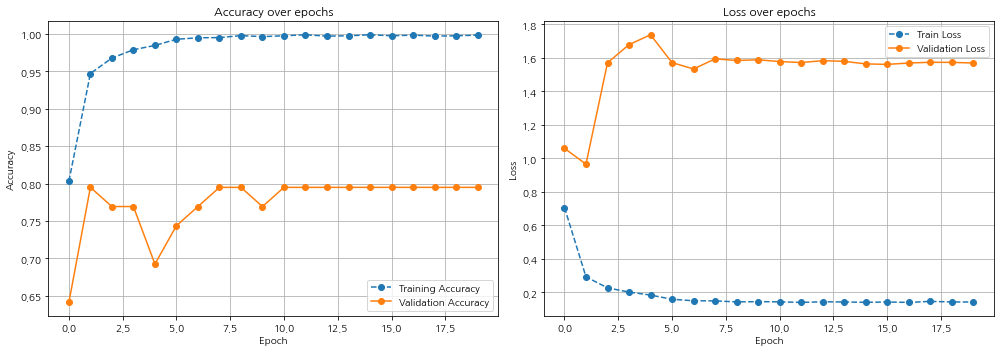

--- 학습 곡선 시각화 완료 ---

[Cell 10 완료] 학습 곡선 시각화 완료 또는 생략.



In [71]:
# ===================================
# Cell 10: 학습 곡선 시각화 (SyntaxError 최종 수정)
# ===================================
import matplotlib.pyplot as plt # 안전하게 임포트
import numpy as np          # 안전하게 임포트

print("\n--- 학습 곡선 시각화 시작 ---", flush=True)

# history 객체 존재 및 내용 확인
if 'history' in locals() and history is not None and history.history:
    # ★★★ print 와 try 분리 ★★★
    print(f"  History 객체 키: {list(history.history.keys())}", flush=True)
    try:
        # try 블록 내용 시작
        acc = history.history.get('accuracy')
        val_acc = history.history.get('val_accuracy') # 없으면 None
        loss = history.history.get('loss')
        val_loss = history.history.get('val_loss')     # 없으면 None

        # ★★★ if 와 실행 내용 분리 ★★★
        if acc is not None and loss is not None:
            # if 블록 내용 시작
            epochs_range = range(len(acc)) # 실제 학습된 에포크 기준
            plt.figure(figsize=(14, 5))

            # Accuracy Plot
            plt.subplot(1, 2, 1)
            plt.plot(epochs_range, acc, label='Training Accuracy', marker='o', linestyle='dashed')
            # ★★★ if 와 실행 내용 분리 ★★★
            if val_acc is not None:
                # if 블록 내용
                plt.plot(epochs_range, val_acc, label='Validation Accuracy', marker='o')
            else:
                # else 블록 내용
                print("  (Info) Validation Accuracy 기록 없음.")
            # if/else 블록 끝
            plt.legend(loc='lower right')
            plt.title('Accuracy over epochs')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.grid(True)

            # Loss Plot
            plt.subplot(1, 2, 2)
            plt.plot(epochs_range, loss, label='Train Loss', marker='o', linestyle='dashed')
            # ★★★ if 와 실행 내용 분리 ★★★
            if val_loss is not None:
                # if 블록 내용
                plt.plot(epochs_range, val_loss, label='Validation Loss', marker='o')
            else:
                # else 블록 내용
                print("  (Info) Validation Loss 기록 없음.")
            # if/else 블록 끝
            plt.legend(loc='upper right')
            plt.title('Loss over epochs')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.grid(True)

            # ★★★ plot 관련 명령 분리 ★★★
            plt.tight_layout()
            plt.show()
            print("--- 학습 곡선 시각화 완료 ---", flush=True)
        # 바깥 if 끝
        else:
             # else 블록 내용
             print("  시각화 실패: history 객체에 'accuracy' 또는 'loss' 키 없음.", flush=True)
        # 바깥 if/else 끝
    except Exception as e:
        # except 블록 내용
        print(f"  학습 곡선 시각화 중 오류 발생: {e}", flush=True)
    # try-except 끝
else:
     # 가장 바깥 if 대한 else 블록 내용
     print("  학습 기록(history) 없음. 시각화 생략.", flush=True)
# 가장 바깥 if/else 끝

print("\n[Cell 10 완료] 학습 곡선 시각화 완료 또는 생략.\n", flush=True)


--- 예측 결과 시각화 시작 ---
  테스트 데이터셋에서 배치 가져와 예측 및 시각화 시도...
    - 배치 1 예측 중...
      -> 시각화할 이미지 인덱스: [0, 6, 11, 18, 25]


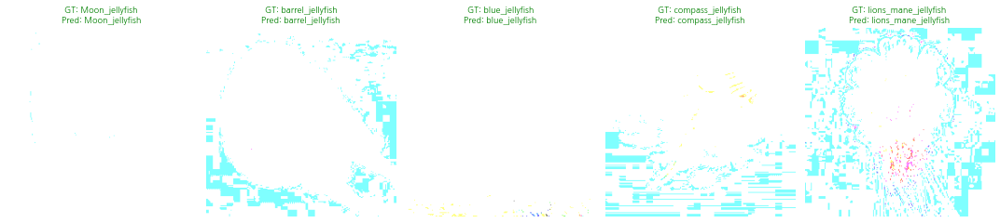

    - 배치 2 예측 중...
      -> 시각화할 이미지 인덱스: [1, 2, 7, 5, 0]


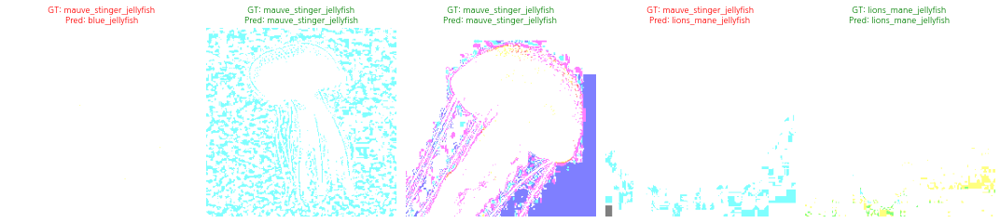


[Cell 11 완료] 예측 결과 시각화 완료 또는 생략.



In [72]:
# ===================================
# Cell 11: 예측 결과 시각화 (SyntaxError 최종 수정)
# ===================================
# 이 셀은 학습된 모델을 사용하여 테스트 데이터셋의 예측 결과를 시각화합니다.
# Cell 8에서 'model', Cell 6에서 'final_test_ds', Cell 3에서 'class_names'가 정의되어야 합니다.
# ===================================
import matplotlib.pyplot as plt # 안전하게 임포트
import numpy as np          # 안전하게 임포트
import random             # 안전하게 임포트
import tensorflow as tf     # 안전하게 임포트 (model.predict 등)
import os                 # 안전하게 임포트 (tf.print용)

print("\n--- 예측 결과 시각화 시작 ---", flush=True)

# 모델, 테스트 데이터셋, 클래스 이름 변수 확인
if 'model' in locals() and model is not None and \
   'final_test_ds' in locals() and final_test_ds is not None and \
   'class_names' in locals() and class_names:

    print("  테스트 데이터셋에서 배치 가져와 예측 및 시각화 시도...", flush=True)
    shown_classes = set()
    visualized_count = 0
    max_batches_to_try = 10 # 루프 최대 반복 횟수

    # EfficientNet 역정규화 함수 정의
    def deprocess_image(processed_img):
        # EfficientNet preprocess_input은 -1 ~ 1 범위로 스케일링하므로,
        # 이를 역으로 0 ~ 1 범위로 변환 후 0 ~ 255 uint8로 변환
        img = (processed_img + 1.0) / 2.0
        return np.clip(img * 255.0, 0, 255).astype(np.uint8)

    # 예측 및 시각화 루프 시작
    try:
        for images_normalized, labels_onehot in final_test_ds.take(max_batches_to_try):
            # 최대 5 세트까지만 시각화
            if visualized_count >= 5:
                 break # for 루프 탈출

            print(f"    - 배치 {visualized_count+1} 예측 중...", flush=True)
            # 모델 예측
            preds = model.predict(images_normalized)
            pred_labels = np.argmax(preds, axis=1)           # 예측 라벨 (인덱스)
            true_labels = np.argmax(labels_onehot.numpy(), axis=1) # 실제 라벨 (인덱스)

            # 현재 배치에서 처음 보는 클래스가 있는지 확인
            current_batch_classes = set(true_labels)
            newly_seen_classes = current_batch_classes - shown_classes
            indices_to_show = [] # 이번 배치에서 시각화할 이미지 인덱스

            # 새로운 클래스 이미지 우선 선택
            if newly_seen_classes:
                for cls_idx in newly_seen_classes:
                    match_indices = np.where(true_labels == cls_idx)[0]
                    # ★★★ if 문과 실행 내용 분리 ★★★
                    if len(match_indices) > 0:
                        indices_to_show.append(match_indices[0])
                    # ★★★ if 문과 실행 내용 분리 ★★★
                    if len(indices_to_show) >= 5:
                         break # 최대 5개 채우면 종료
                # 내부 for 루프 끝
            # if newly_seen_classes 끝

            # 부족하면 기존 클래스 이미지 랜덤 추가
            # ★★★ if 문과 실행 내용 분리 ★★★
            if len(indices_to_show) < 5:
                remaining_indices = [i for i in range(len(true_labels)) if i not in indices_to_show]
                needed = 5 - len(indices_to_show)
                # random.sample 사용 시 에러 방지 (k가 population보다 클 수 없음)
                indices_to_show.extend(random.sample(remaining_indices, min(needed, len(remaining_indices))))
            # if len(indices_to_show) < 5 끝

            # 시각화할 이미지가 없으면 다음 배치로
            # ★★★ if 문과 실행 내용 분리 ★★★
            if not indices_to_show:
                 continue # for 루프의 다음 반복으로

            # 시각화 준비
            print(f"      -> 시각화할 이미지 인덱스: {indices_to_show}", flush=True)
            plt.figure(figsize=(15, 5)) # plt.figure 호출 분리
            plot_num = 1 # plot_num 초기화 분리

            # 선택된 이미지 시각화
            for i in indices_to_show:
                # ★★★ 여러 명령문을 별도 라인으로 분리 ★★★
                plt.subplot(1, 5, plot_num)
                img_display = deprocess_image(images_normalized[i].numpy())
                plt.imshow(img_display)
                # 클래스 이름 가져오기 (오류 방지)
                true_class = class_names[true_labels[i]] if true_labels[i] < len(class_names) else "Unknown"
                pred_class = class_names[pred_labels[i]] if pred_labels[i] < len(class_names) else "Unknown"
                title = f"GT: {true_class}\nPred: {pred_class}"
                color = "green" if true_labels[i] == pred_labels[i] else "red"
                plt.title(title, fontsize=9, color=color)
                plt.axis('off')
                plot_num += 1
            # 내부 for 루프 끝

            # ★★★ 여러 명령문을 별도 라인으로 분리 ★★★
            plt.tight_layout()
            plt.show()
            visualized_count += 1
            shown_classes.update(true_labels[indices_to_show])
        # 외부 for 루프 끝

        # 시각화 완료 후 메시지
        # ★★★ if 문과 실행 내용 분리 ★★★
        if visualized_count == 0:
            print("  경고: 예측 결과를 시각화할 이미지를 처리하지 못했습니다.", flush=True)
        # if 끝
    except Exception as e:
        # except 블록 내용
        print(f"  예측 결과 시각화 중 오류 발생: {e}", flush=True)
    # try-except 끝
else:
    # 가장 바깥 if에 대한 else 블록 내용 (여러 줄로 분리)
    print("  오류: 예측 시각화 불가. 모델 또는 테스트 데이터셋 또는 클래스 이름이 준비되지 않음.", flush=True)
    print("  -> 이전 셀들(Cell 3, Cell 6, Cell 8)의 실행 결과를 확인하세요.", flush=True)
# if/else 끝

print("\n[Cell 11 완료] 예측 결과 시각화 완료 또는 생략.\n", flush=True)